# Vote Data Analysis

Nous disposons d'un ensemble de données représentant les résultats par commune française d'un vote lors d'un référendum fictif organisé en 2013.

L'idée de voir ce qui peut être instructif sur ces données. Nous pouvons utiliser les données de l'INSEE pour aider.

**Objectif :**
- Explorer les liens entres les variables (et visualisation).
- *Bonus :* Creer un modele predictif de regression/classification.

In [189]:
import os
import pandas as pd, numpy as np
import pylab as plt, seaborn as sns
import geopandas as gpd, networkx as nx
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.gridspec as gridspec

# exploration
from scipy.stats import ttest_ind
from sklearn.decomposition import PCA

# learning
import sklearn as sk
from sklearn.pipeline import make_pipeline
from sklearn import preprocessing as skpp
from sklearn import model_selection as skms
from sklearn import metrics as skm
from sklearn import feature_selection as skfs

from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# param
pd.set_option('display.max_row', 200)
pd.set_option('display.max_column', 200)

---

## 1. Data Collection

Nous disposons de 4 jeux de données réparti dans 1 csv (referendum.csv) et 3 documents excell :

- Demographie : [base-cc-evol-struct-pop-2013/COM_2013](https://www.insee.fr/fr/statistiques/2044751)
- Revenu : [filo-revenu-pauvrete-menage-2013/COM](https://www.insee.fr/fr/statistiques/2388572)
- Diplome : [pop-16ans-dipl6818](https://www.insee.fr/fr/statistiques/1893149)


### 1-a. Data knowledge

Les données insee sont regroupé suivant un code géographique "CODGEO", ce qui correspond à DEP+COM (département + commune).

Comment voter par référendum en France ?
- vote de loi (global), exemple : constitution union européenne
- consultation (locale), aéroport

Possibilité intermédiaire d'élection d'électeur (région)

**Remarque :** Parce que la proportion de la taille de la ville est différente, suivant les méthodes de vote, nous pouvons avoir un résultat différent.

**Facultatif :** Étant donné que les données sont géographiquement locales, nous pouvons utiliser la cartographie pour voir l'effet spatial. Au moins, cela peut aider à la visualisation. Pour cela, on peut se référer à la base de données openstreetmap [ici](https://www.data.gouv.fr/fr/datasets/decoupage-administratif-communal-francais-issu-d-openstreetmap/). Aussi, les données de l'Insee ne reflètent que du point de vue de l'individu, cependant il est possible que le système influence les choix (politique de la ville, etc.), pour cela on peut voir le résultat du vote de la politique de la ville [ici](https://www.data.gouv.fr/fr/pages/donnees-des-elections/). (*Voir aussi :* http://map.datafrance.info/politique)

**Remarques :** Les donnée de l'insee nous informes sur les proportions qu'il y a pour chacune des variables, ce qui n'est pas le cas du fichier csv.

*Resume of INSEE report (cas données secrete) :*
- [Revenus et pauvreté des ménages en 2013](https://www.insee.fr/fr/statistiques/2117515?geo=METRO-1) : Le taux de pauvrete est plus present chez les moins de 30 ans (+20%), puis diminu avec l'age (-20% et -10% pour plus de 60 ans), les propriétaires sont moins pauvres.

### 1-b. Data overview

- **Spreadsheet vizualization :** 
-- **Referundum :** Construire CODGEO à partir des données departement-commune. Il y a des données supplémentaire "Français à l'étranger".
-- **Demographie :** feuille COM_2013. Indicateur démographique essentiel (âge, sexe et catégorie sociale), la variable « P13_POP " est le décompte de la population, est une aide à la normalisation. Ici, nous pouvons utiliser la feuille COM_2008 pour étudier la croissance démographique.
-- **Revenu :** feuille COM. Indicateur de revenu, aide à voir s'il a un effet de vote-richesse. La variable pauvreté est souvent vide, et il convient de faire attention à son évolution : nous pouvons creer une classe "confidentiel/non-confidentiel". Le "Nombre de ménages fiscaux" peut donner des informations sur la taille du ménage.
-- **Diplome :** Structure de la population scolarisée selon le niveau de diplôme (4 modalités + sexe). Ces données ne contiennent pas de recensement pour l'année 2013. Nous pouvons utiliser les feuilles COM_2008 et COM_2018 pour interpoler les données en 2013. CODGEO est à construire. Ici cela correspond au derniers diplome obtenu. 
- **Variable list :** Dans referundum, les colonnes ["Abstentions" 	"Blancs et nuls" 	"Choix A" 	"Choix B"] correspondent au part de la colonnes ["Inscrits"], il est p-e plus interessant de representer leurs proportions. De même pour Demographie, où l'ensemble des variables peuvent etre mise en relation avec "POP_13", par contre, ici le nombre de variables est **supérieur à 100**. Pour Revenu, les données sont déjà representé sous forme de proportion, où l'on distingue des variables de Taux de pauvreté et Source de revenu (activité, prestation social, logement). Dans le cas des diplome, il n'est pas forcement necessaire de distinguer l'obtention d'un diplome entre 16 et 24 ans et 25 ans, nous pouvons ici sommer les colonnes 2 à 2, puis normaliser par la somme par ligne.
- ***Objectif :*** réduire le nombre de variables avant de combiner les données et de les analyser.

### 1-c. Data importation

In [2]:
# referendum :
df_ref = pd.read_csv('Referendum.csv', sep=';')
# demography
xls_dem = pd.ExcelFile('INSEE/base-cc-evol-struct-pop-2013.xls')
df_dem = pd.read_excel(xls_dem, skiprows=list(range(5)))
# income
xls_inc = pd.ExcelFile('INSEE/filo-revenu-pauvrete-menage-2013.xls')
df_inc = pd.read_excel(xls_inc, skiprows=list(range(5)))
# diplom
xls_dip = pd.ExcelFile('INSEE/pop-16ans-dipl6818.xls')
df_dip_2008 = pd.read_excel(xls_dip, sheet_name='COM_2008', skiprows=list(range(16)))
df_dip_2018 = pd.read_excel(xls_dip, sheet_name='COM_2018', skiprows=list(range(16)))
# geographic (bonus)
geo_df = gpd.read_file("communes-20220101-shp/communes-20220101.shp")
"""
get excat name of feature for more readability
"""

'\nget excat name of feature for more readability\n'

In [3]:
# data save (for test)
data = [df_ref.copy(), df_dem.copy(), df_inc.copy(), df_dip_2008.copy(), df_dip_2018.copy(), geo_df.copy()]

In [4]:
## basic statistic
for d in data :
    display(d.describe())

,Code de la commune,Inscrits,Abstentions,Blancs et nuls,Choix A,Choix B
count,36791.000000,3.679100e+04,36791.000000,36791.000000,36791.000000,36791.000000
mean,251.665217,1.251082e+03,256.697100,19.058737,426.723383,548.602348
std,181.696562,8.595773e+03,2075.420552,96.750220,3303.009008,3346.575020
min,1.000000,6.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,105.000000,1.600000e+02,23.000000,2.000000,49.000000,81.000000
50%,218.000000,3.370000e+02,49.000000,6.000000,108.000000,169.000000
75%,361.000000,8.070000e+02,120.000000,14.000000,268.000000,402.000000
max,909.000000,1.253322e+06,248755.000000,12093.000000,506594.000000,485880.000000


,REG,REG2016,P13_POP,P13_POP0014,P13_POP1529,P13_POP3044,P13_POP4559,P13_POP6074,P13_POP7589,P13_POP90P,P13_POPH,P13_H0014,P13_H1529,P13_H3044,P13_H4559,P13_H6074,P13_H7589,P13_H90P,P13_H0019,P13_H2064,P13_H65P,P13_POPF,P13_F0014,P13_F1529,P13_F3044,P13_F4559,P13_F6074,P13_F7589,P13_F90P,P13_F0019,P13_F2064,P13_F65P,P13_POP01P,P13_POP01P_IRAN1,P13_POP01P_IRAN2,P13_POP01P_IRAN3,P13_POP01P_IRAN4,P13_POP01P_IRAN5,P13_POP01P_IRAN6,P13_POP01P_IRAN7,P13_POP0114_IRAN2P,P13_POP0114_IRAN2,P13_POP0114_IRAN3P,P13_POP1524_IRAN2P,P13_POP1524_IRAN2,P13_POP1524_IRAN3P,P13_POP2554_IRAN2P,P13_POP2554_IRAN2,P13_POP2554_IRAN3P,P13_POP55P_IRAN2P,P13_POP55P_IRAN2,P13_POP55P_IRAN3P,C13_POP15P,C13_POP15P_CS1,C13_POP15P_CS2,C13_POP15P_CS3,C13_POP15P_CS4,C13_POP15P_CS5,C13_POP15P_CS6,C13_POP15P_CS7,C13_POP15P_CS8,C13_H15P,C13_H15P_CS1,C13_H15P_CS2,C13_H15P_CS3,C13_H15P_CS4,C13_H15P_CS5,C13_H15P_CS6,C13_H15P_CS7,C13_H15P_CS8,C13_F15P,C13_F15P_CS1,C13_F15P_CS2,C13_F15P_CS3,C13_F15P_CS4,C13_F15P_CS5,C13_F15P_CS6,C13_F15P_CS7,C13_F15P_CS8,C13_POP1524,C13_POP1524_CS1,C13_POP1524_CS2,C13_POP1524_CS3,C13_POP1524_CS4,C13_POP1524_CS5,C13_POP1524_CS6,C13_POP1524_CS7,C13_POP1524_CS8,C13_POP2554,C13_POP2554_CS1,C13_POP2554_CS2,C13_POP2554_CS3,C13_POP2554_CS4,C13_POP2554_CS5,C13_POP2554_CS6,C13_POP2554_CS7,C13_POP2554_CS8,C13_POP55P,C13_POP55P_CS1,C13_POP55P_CS2,C13_POP55P_CS3,C13_POP55P_CS4,C13_POP55P_CS5,C13_POP55P_CS6,C13_POP55P_CS7,C13_POP55P_CS8
count,36641.000000,36641.000000,3.664100e+04,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,3.664100e+04,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,3.664100e+04,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,3.664100e+04,3.664100e+04,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,3.664100e+04,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,3.664100e+04,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.0,36641.000000,3.664100e+04,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000,36641.000000
mean,49.442892,52.047215,1.789382e+03,330.957382,322.536940,349.189733,357.221284,266.125146,145.839513,17.512279,8.663399e+02,169.344958,162.217271,172.673088,174.534518,126.175550,56.923520,4.471024,224.868194,507.908449,133.563286,9.230423e+02,161.612424,160.319669,176.516645,182.686766,139.949596,88.915993,13.041255,214.438197,524.821328,183.782822,1.767199e+03,1.564052e+03,73.455676,71.817266,19.550348,30.105593,0.914925,7.302278,38.781468,15.489016,23.292452,45.475163,14.712325,30.762838,96.500062,35.170679,61.329384,22.389393,8.083656,14.305737,1.458462e+03,12.576478,50.883813,131.389062,205.557415,241.645535,188.792439,388.661037,238.956206,696.868018,9.237751,36.252283,78.212310,95.966185,57.585845,152.906489,174.309142,92.398013,7.615940e+02,3.338727,14.631530,53.176752,109.591229,184.059690,35.885949,214.351895,146.558193,215.131586,0.276733,1.587916,4.178782,16.944644,32.784738,28.793792,0.0,130.564980,6.993790e+02,8.681063,38.283290,104.132873,162.188301,176.989875,137.644780,2.852322,68.606464,543.951430,3.618682,11.012607,23.077407,26.424469,31.870922,22.353866,385.808715,39.784762
std,25.440842,24.237866,1.477981e+04,2311.599775,3524.359804,3243.0106

,NBMENFISC13,NBPERSMENFISC13,MED13,PIMP13,TP6013,TP60AGE113,TP60AGE213,TP60AGE313,TP60AGE413,TP60AGE513,TP60AGE613,TP60TOL113,TP60TOL213,PRA13,PTSAC13,PBEN13,PPEN13,PPAT13,PPSOC13,PPFAM13,PPMINI13,PPLOGT13,PIMPOT13,RD13,D113,D913
count,3.294100e+04,3.294100e+04,32941.000000,5136.000000,4203.000000,789.000000,1329.000000,1804.000000,1157.000000,752.000000,340.000000,2002.000000,2989.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000,5136.000000
mean,8.576749e+02,1.982206e+03,20255.437605,59.015576,13.408280,28.713561,22.585403,20.951220,17.737252,13.075798,10.020588,8.102897,26.511542,71.060942,65.701012,5.359930,29.195191,10.964914,5.022936,2.330121,1.390129,1.301928,-16.243984,3.026241,11963.139139,35885.061947
std,7.210126e+03,1.494167e+04,2874.016524,11.164424,6.323904,9.600607,9.314395,8.833824,7.057360,5.747306,4.138051,3.456939,8.360215,10.331201,10.884238,2.270883,7.278821,4.591927,2.416973,0.813730,1.033103,0.844884,3.233576,0.598909,1945.115190,8071.196121
min,3.200000e+01,8.150000e+01,10021.250000,24.000000,5.000000,10.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,8.000000,17.400000,16.100000,0.700000,6.800000,2.700000,0.500000,0.300000,0.100000,0.100000,-41.300000,1.978255,6382.500000,22170.000000
25%,1.020000e+02,2.465000e+02,18451.538462,51.000000,9.000000,21.000000,15.000000,14.000000,12.000000,9.000000,7.000000,5.000000,20.000000,64.800000,59.100000,3.800000,24.400000,8.500000,3.400000,1.800000,0.700000,0.700000,-17.800000,2.673038,10531.032407,31015.888889
50%,2.050000e+02,5.060000e+02,19844.666667,58.000000,12.000000,28.000000,22.000000,20.000000,17.000000,12.000000,9.000000,7.000000,26.000000,72.000000,66.600000,5.100000,28.400000,10.300000,4.600000,2.200000,1.100000,1.100000,-15.700000,2.916487,11954.880952,34004.666667
75%,4.860000e+02,1.192500e+03,21566.190476,67.000000,17.000000,35.000000,29.000000,26.000000,22.000000,16.000000,12.000000,10.000000,32.000000,78.400000,73.200000,6.500000,33.100000,12.400000,6.000000,2.800000,1.800000,1.700000,-14.100000,3.225144,13304.653239,38545.657143
max,1.038789e+06,2.109850e+06,46250.555556,89.000000,53.000000,62.000000,60.000000,58.000000,55.000000,44.000000,30.000000,32.000000,60.000000,104.400000,100.300000,28.100000,67.500000,68.500000,25.500000,7.600000,10.700000,8.300000,-5.500000,10.386841,20401.333333,126486.000000


,rr,cr,stable,dpx_rec0s1age2_rec1rpop2008,dpx_rec0s1age2_rec2rpop2008,dpx_rec0s2age2_rec1rpop2008,dpx_rec0s2age2_rec2rpop2008,dpx_rec1s1age2_rec1rpop2008,dpx_rec1s1age2_rec2rpop2008,dpx_rec1s2age2_rec1rpop2008,dpx_rec1s2age2_rec2rpop2008,dpx_rec2s1age2_rec1rpop2008,dpx_rec2s1age2_rec2rpop2008,dpx_rec2s2age2_rec1rpop2008,dpx_rec2s2age2_rec2rpop2008,dpx_rec3s1age2_rec1rpop2008,dpx_rec3s1age2_rec2rpop2008,dpx_rec3s2age2_rec1rpop2008,dpx_rec3s2age2_rec2rpop2008,dpx_rec4s1age2_rec1rpop2008,dpx_rec4s1age2_rec2rpop2008,dpx_rec4s2age2_rec1rpop2008,dpx_rec4s2age2_rec2rpop2008,dpx_rec5s1age2_rec1rpop2008,dpx_rec5s1age2_rec2rpop2008,dpx_rec5s2age2_rec1rpop2008,dpx_rec5s2age2_rec2rpop2008,dpx_rec6s1age2_rec1rpop2008,dpx_rec6s1age2_rec2rpop2008,dpx_rec6s2age2_rec1rpop2008,dpx_rec6s2age2_rec2rpop2008
count,38214.000000,38214.000000,38214.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000,36701.000000
mean,52.340059,251.001021,0.871513,10.792362,104.394667,6.941132,125.986520,0.420289,53.920420,0.243374,89.410939,5.392298,28.635225,3.856777,45.787061,16.842684,159.718211,10.854040,120.066386,13.099712,82.710236,13.532695,95.865477,5.700054,55.284115,7.679603,79.179714,3.272524,80.118691,4.597489,74.283851
std,24.426905,180.234893,0.334636,68.545833,581.947110,50.769834,719.840171,3.902661,210.803832,2.169014,363.631850,27.699277,152.403322,21.172155,246.283327,77.998595,602.224353,57.188335,523.710835,81.172733,429.993996,91.464407,527.737802,42.919644,313.641963,58.921641,458.473595,41.671546,761.325473,57.307902,718.612080
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,106.000000,1.000000,0.000000,11.641026,0.000000,11.729199,0.000000,8.000000,0.000000,12.000000,0.000000,0.000000,0.000000,4.000000,0.000000,21.860764,0.000000,12.208936,0.000000,8.095808,0.000000,8.237288,0.000000,4.000000,0.000000,7.830986,0.000000,3.954802,0.000000,3.976331
50%,44.000000,218.000000,1.000000,0.000000,24.747875,0.000000,27.400000,0.000000,18.885942,0.000000,26.913043,0.000000,7.864979,0.000000,11.722008,4.000000,51.343849,0.000000,32.000000,3.858824,20.551181,0.000000,23.576471,0.000000,12.079646,0.000000,17.514153,0.000000,8.551724,0.000000,11.204545
75%,76.000000,360.000000,1.000000,4.142857,61.595939,3.985801,68.000000,0.000000,42.491429,0.000000,64.000000,4.000000,18.628738,3.889686,27.943089,12.000000,123.625308,7.890029,82.897844,8.000000,52.057971,7.981777,57.132584,4.000000,32.668058,4.024845,47.284250,0.000000,28.000000,0.000000,28.000000
max,94.000000,909.000000,1.000000,6514.388771,62291.554152,4948.078480,78446.540746,446.021867,21526.375927,211.305887,31012.200475,2315.617039,16055.204959,1634.567193,24067.490467,6868.636562,53011.667494,4842.603542,49819.594568,5378.597693,38059.127534,5986.720203,48522.580290,3184.039189,24771.135945,4235.515537,38555.058690,3162.735648,46804.737498,4355.980417,43229.850808


,rr,cr,stable,dpx_rec0s1age2_rec1rpop2018,dpx_rec0s1age2_rec2rpop2018,dpx_rec0s2age2_rec1rpop2018,dpx_rec0s2age2_rec2rpop2018,dpx_rec1s1age2_rec1rpop2018,dpx_rec1s1age2_rec2rpop2018,dpx_rec1s2age2_rec1rpop2018,dpx_rec1s2age2_rec2rpop2018,dpx_rec2s1age2_rec1rpop2018,dpx_rec2s1age2_rec2rpop2018,dpx_rec2s2age2_rec1rpop2018,dpx_rec2s2age2_rec2rpop2018,dpx_rec3s1age2_rec1rpop2018,dpx_rec3s1age2_rec2rpop2018,dpx_rec3s2age2_rec1rpop2018,dpx_rec3s2age2_rec2rpop2018,dpx_rec4s1age2_rec1rpop2018,dpx_rec4s1age2_rec2rpop2018,dpx_rec4s2age2_rec1rpop2018,dpx_rec4s2age2_rec2rpop2018,dpx_rec5s1age2_rec1rpop2018,dpx_rec5s1age2_rec2rpop2018,dpx_rec5s2age2_rec1rpop2018,dpx_rec5s2age2_rec2rpop2018,dpx_rec6s1age2_rec1rpop2018,dpx_rec6s1age2_rec2rpop2018,dpx_rec6s2age2_rec1rpop2018,dpx_rec6s2age2_rec2rpop2018
count,38214.000000,38214.000000,38214.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000,35385.000000
mean,52.340059,251.001021,0.871513,7.402615,86.366403,4.604456,101.199781,0.381932,37.280386,0.217737,67.558574,4.857842,28.233979,3.184168,43.032801,11.568312,182.407418,7.140725,145.452170,17.866770,98.173972,16.459280,115.810979,5.682672,64.487478,5.447540,80.466911,6.324135,126.475860,8.647852,143.159497
std,24.426905,180.234893,0.334636,46.994329,489.778777,31.321478,583.542484,3.547220,142.546117,1.793330,251.366081,24.006056,138.618974,17.889996,205.210907,53.384590,647.301031,36.424682,586.111104,105.649310,458.973442,111.856490,560.688842,38.387720,311.915517,36.578152,397.044656,75.924799,1103.165769,100.398409,1195.942592
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,106.000000,1.000000,0.000000,5.114679,0.000000,5.104167,0.000000,5.000000,0.000000,5.248227,0.000000,0.000000,0.000000,4.878049,0.000000,25.000000,0.000000,15.089820,0.000000,10.071429,0.000000,10.191388,0.000000,5.000000,0.000000,5.178571,0.000000,5.026324,0.000000,9.659864
50%,44.000000,218.000000,1.000000,0.000000,19.750000,0.000000,19.786780,0.000000,10.440418,0.000000,20.000000,0.000000,5.165663,0.000000,10.049102,0.000000,60.000000,0.000000,40.000000,4.919094,25.898204,0.000000,30.000000,0.000000,15.205423,0.000000,20.000000,0.000000,15.712401,0.000000,21.304348
75%,76.000000,360.000000,1.000000,4.991114,46.327071,0.000000,50.295877,0.000000,30.100043,0.000000,50.000000,4.959839,20.000000,0.000000,28.545752,9.920844,147.036176,5.003864,104.778637,10.084169,67.871924,10.000000,75.194932,4.983333,44.649123,4.954987,53.963515,0.000000,50.000000,4.926385,61.029120
max,94.000000,909.000000,1.000000,3872.013390,49892.731596,3033.074002,59925.203121,390.000000,14962.160813,146.058466,20777.958664,1929.207946,14171.775694,1506.070564,18945.962049,4662.937630,59843.009700,3046.475811,54884.283311,6906.718813,41663.459641,7778.976177,52828.304127,2786.518568,25238.096374,2519.956513,34903.748860,6090.125163,74274.838961,8111.675895,78778.857960


,surf_ha
count,3.495500e+04
mean,1.824993e+03
std,1.474375e+04
min,3.000000e+00
25%,6.520000e+02
50%,1.100000e+03
75%,1.906000e+03
max,1.853204e+06


In [5]:
df_ref[['Abstentions','Blancs et nuls','Choix A','Choix B']].sum() / df_ref['Inscrits'].sum()

Abstentions       0.205180
Blancs et nuls    0.015234
Choix A           0.341084
Choix B           0.438502
dtype: float64

**Observation :** Le choix B à gagné lors du referendum à 43,85% au total (56,25% si on ne prend pas en compte les abstentions/blancs)

### 1-d. Data pre-analysis

##### First Simplify dataframe

In [6]:
def clean(df, end, insee = False):
    columns = df.columns.values
    index = np.where(columns == end)[0][0]
    # adding geographic code
    if insee :
        column1, column2 = insee
        CODE_series  = df[column1].str.zfill(2) + df[column2].astype(str).str.zfill(3)
    else :
        CODE_series = df.iloc[:,0]
    # drop all object columns
    df.drop(columns=columns[:index+1], inplace=True)
    # insert id
    df.insert(0, 'CODGEO' , CODE_series)

In [7]:
## basic clean
# referendum
data[0] = data[0][data[0]['Code du département'] != 'ZZ']
data[0].loc[data[0]['Code du département'].str.isalpha(), 'Code du département'] = "97"
clean(data[0], 'Libellé de la commune', insee=['Code du département','Code de la commune'])
# demography
clean(data[1], 'LIBGEO')
data[1].drop(columns='C13_POP1524_CS7', inplace=True) # Aberrant variable (retraité à 15-24 ans)
# income
clean(data[2], 'LIBGEO')
# diplom
clean(data[3], 'libgeo', insee=['dr','cr'])
clean(data[4], 'libgeo', insee=['dr','cr'])
# geographic (bonus)
data[5].rename(columns={'insee':'CODGEO'}, inplace=True)

In [8]:
gb_dep = data[0].groupby(data[0].CODGEO.str[:2])
dep_vote = gb_dep[['Inscrits','Abstentions','Blancs et nuls','Choix A','Choix B']].sum()
dep_vote[['Abstentions','Blancs et nuls','Choix A','Choix B']].div(dep_vote['Inscrits'], axis=0).mean()

Abstentions       0.182872
Blancs et nuls    0.016103
Choix A           0.347710
Choix B           0.453315
dtype: float64

**Observation :** Dans ce syteme de referendum, il n'y a pas beaucoup de changement de repartitions des differentes parties. Le découpage des départements est équitables.

##### Create some variable

In [9]:
## referendum : create vote class
data[0].insert(1, 'Results', data[0][['Abstentions','Blancs et nuls','Choix A','Choix B']].idxmax(1).astype("category"))
""" df['Results'] = df.apply(classification_function, axis=1)"""

## demography : dominant social category, age, sex
""" do if necessary """

## income : confidencial / unconfidential
""" optimize if necessary : poverty private only, all private, public """ # count with value_counts()
series_2 = (data[2].isna().sum(axis=1) < 7).replace({True: 'public', False: 'private'})
data[2].insert(1, 'Confidentiality', series_2)

## diplom : mean interpolation (simple imputer)
arr_d1, arr_d2 = data[3].values, data[4].values
r_d1, r_d2 = arr_d1[:,1::2]+arr_d1[:,2::2], arr_d2[:,1::2]+arr_d2[:,2::2]
arr_d = (r_d1 + r_d2)/2
df_dip = pd.DataFrame(arr_d, columns=['H'+str(int(i/2)) if i%2==0 else 'F'+str(int(i/2)) for i in range(14)])
df_dip = df_dip.astype('float')
df_dip.insert(0, 'CODGEO', data[3]['CODGEO'])

## geographic (add vote result)
data[5] = data[5].merge(data[0][['CODGEO', 'Results']], how='inner', on='CODGEO')

In [10]:
data[0]['Results'].value_counts() / data[0]['Results'].value_counts().sum()

Choix B           0.836134
Choix A           0.157912
Abstentions       0.005873
Blancs et nuls    0.000082
Name: Results, dtype: float64

**Observation :** Le choix B aurait encore gagné si l'on a un système de grand electeurs (assemblée, etc.), mais cette fois, le resultat est accentué où l'on aurait un score de 83,6% des places (84,1% si on ne prend pas en compte les abstentions/blancs).

##### Normalized data

In [11]:
# referendum
norm_col = ['Abstentions','Blancs et nuls','Choix A','Choix B']
data[0]["Inscrits"] = data[0]["Inscrits"].astype('float')
data[0][norm_col] = data[0][norm_col].div(data[0]["Inscrits"], axis=0)
# demography
data[1].iloc[:,2:] = (data[1].iloc[:,2:]).div(data[1]['P13_POP'], axis=0)
# income
data[2]["NBMENFISC13"] = data[2]["NBMENFISC13"].div(data[2]["NBPERSMENFISC13"], axis=0)
data[2]["NBPERSMENFISC13_"] = data[2]["NBPERSMENFISC13"].div(data[1]['P13_POP'], axis=0)
# diplom
col_d08 = data[3].select_dtypes('float').columns
col_d18 = data[4].select_dtypes('float').columns
col_dip = df_dip.select_dtypes('float').columns
""" """
data[3][col_d08] = data[3][col_d08].div(data[3][col_d08].sum(axis=1), axis=0)
data[4][col_d18] = data[4][col_d18].div(data[4][col_d18].sum(axis=1), axis=0)
df_dip[col_dip] = df_dip[col_dip].div(df_dip[col_dip].sum(axis=1), axis=0)

In [12]:
data[0][norm_col].mean()

Abstentions       0.154191
Blancs et nuls    0.017181
Choix A           0.326664
Choix B           0.501963
dtype: float64

**Observation :** Dans un systeme de répartition global, le resultats est toujours pour le Choix B, il est toujours supérieurs au global, mais c'est moins accentué que par la methodes precedente.

##### Basic visualization

/home/fabien/.local/lib/python3.8/site-packages/geopandas/plotting.py:49: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in geom:
/home/fabien/.local/lib/python3.8/site-packages/descartes/patch.py:63: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  concatenate([asarray(t.exterior)[:, :2]] +
/home/fabien/.local/lib/python3.8/site-packages/descartes/patch.py:64: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  [asarray(r)[:, :2] for r in t.interiors])


<AxesSubplot:>

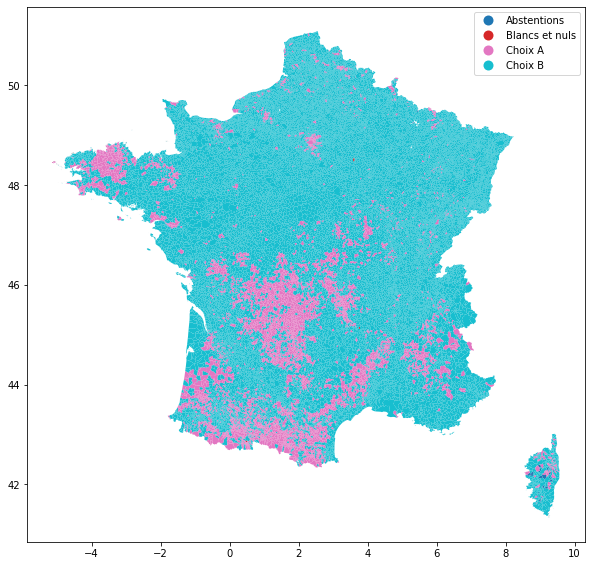

In [13]:
# geographic representation of vote
fig,ax = plt.subplots(figsize=(10, 10))
data[5][data[5].CODGEO.str[:2] != "97"].plot(ax=ax, categorical=True, column = "Results", legend=True)
# dep = data[5].dissolve(by='dep', aggfunc='sum')

**Observation :** Les données semblent corrélé avec le vote départemental de 2015 (intuition)

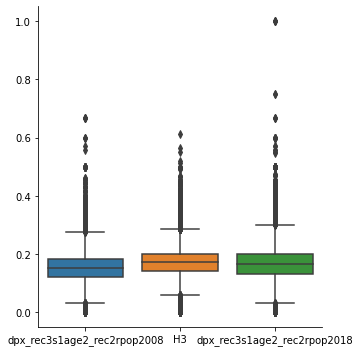

In [14]:
# distribution of diplom
df_dip_control = pd.concat([data[3]['dpx_rec3s1age2_rec2rpop2008'], df_dip['H3'], data[4]['dpx_rec3s1age2_rec2rpop2018']],axis=1)
sns.catplot(data=df_dip_control,  kind="box")

**Observation :** La moyenne a reduit le bruit, voir s'il y a besoin d'appliquer une methode polynomiale.

/home/fabien/.local/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 720x720 with 0 Axes>

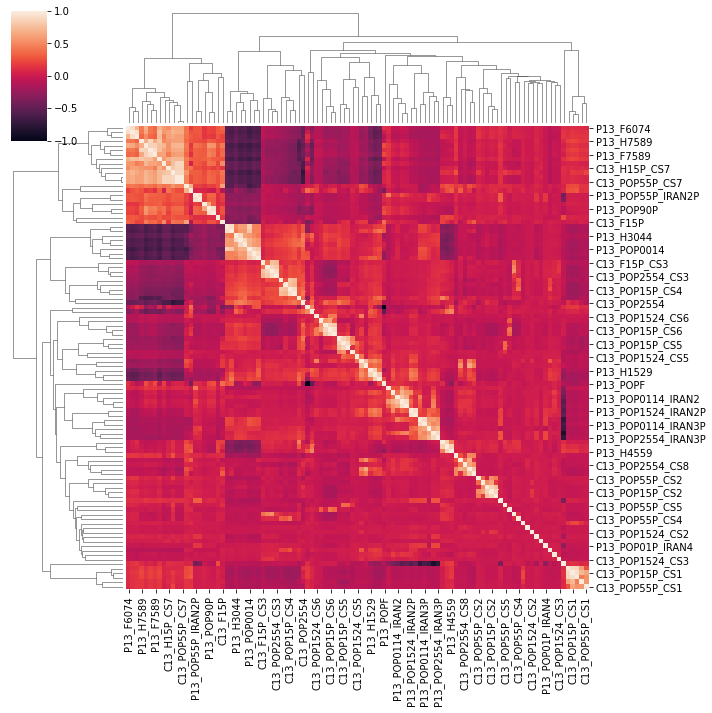

In [15]:
# correlation variable for democraphic info
dem_corr = data[1].corr()
dem_mask = np.triu(np.ones_like(dem_corr))
plt.figure(figsize=(10,10))
#sns.heatmap(dem_corr, mask=dem_mask) #, annot=True)
sns.clustermap(dem_corr)

##### Subset construct (if necessary)

In [16]:
x = data[1].iloc[:, 1:].fillna(0)
x = skpp.StandardScaler().fit_transform(x)
# PCA compression of continious variables (if unlinear : Manifold : IsoMap)
pca = PCA(n_components= 3) # 0.5)
principalComponents = pca.fit_transform(x)
pc_df = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2', 'PC3'])
# add class
pc_df['hue'] = data[0]['Results'].astype("category")

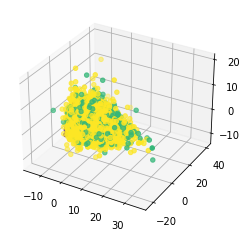

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

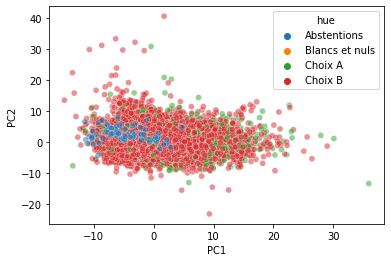

In [17]:
ax = plt.axes(projection='3d')
ax.scatter(pc_df['PC1'], pc_df['PC2'], pc_df['PC3'], c= pc_df['hue'].cat.codes); plt.show();plt.close()
sns.scatterplot(data=pc_df,  x="PC1", y="PC2", hue='hue', alpha=0.5)

**Observation :** On observe un nuages de points qui se chevauche entre le choix A et le choix B.

### 1-e. Data compilation

In [18]:
complete_data = data[0].copy()
for d in data[1:3]+[df_dip] : #+[data[-1]] :
    complete_data = pd.merge(complete_data, d, how='inner', on='CODGEO')
# head or tail
complete_data.head()

,CODGEO,Results,Inscrits,Abstentions,Blancs et nuls,Choix A,Choix B,P13_POP,P13_POP0014,P13_POP1529,P13_POP3044,P13_POP4559,P13_POP6074,P13_POP7589,P13_POP90P,P13_POPH,P13_H0014,P13_H1529,P13_H3044,P13_H4559,P13_H6074,P13_H7589,P13_H90P,P13_H0019,P13_H2064,P13_H65P,P13_POPF,P13_F0014,P13_F1529,P13_F3044,P13_F4559,P13_F6074,P13_F7589,P13_F90P,P13_F0019,P13_F2064,P13_F65P,P13_POP01P,P13_POP01P_IRAN1,P13_POP01P_IRAN2,P13_POP01P_IRAN3,P13_POP01P_IRAN4,P13_POP01P_IRAN5,P13_POP01P_IRAN6,P13_POP01P_IRAN7,P13_POP0114_IRAN2P,P13_POP0114_IRAN2,P13_POP0114_IRAN3P,P13_POP1524_IRAN2P,P13_POP1524_IRAN2,P13_POP1524_IRAN3P,P13_POP2554_IRAN2P,P13_POP2554_IRAN2,P13_POP2554_IRAN3P,P13_POP55P_IRAN2P,P13_POP55P_IRAN2,P13_POP55P_IRAN3P,C13_POP15P,C13_POP15P_CS1,C13_POP15P_CS2,C13_POP15P_CS3,C13_POP15P_CS4,C13_POP15P_CS5,C13_POP15P_CS6,C13_POP15P_CS7,C13_POP15P_CS8,C13_H15P,C13_H15P_CS1,C13_H15P_CS2,C13_H15P_CS3,C13_H15P_CS4,C13_H15P_CS5,C13_H15P_CS6,C13_H15P_CS7,C13_H15P_CS8,C13_F15P,C13_F15P_CS1,C13_F15P_CS2,C13_F15P_CS3,C13_F15P_CS4,C13_F15P_CS5,C13_F15P_CS6,C13_F15P_CS7,C13_F15P_CS8,C13_POP1524,C13_POP1524_CS1,C13_POP1524_CS2,C13_POP1524_CS3,C13_POP1524_CS4,C13_POP1524_CS5,C13_POP1524_CS6,C13_POP1524_CS8,C13_POP2554,C13_POP2554_CS1,C13_POP2554_CS2,C13_POP2554_CS3,C13_POP2554_CS4,C13_POP2554_CS5,C13_POP2554_CS6,C13_POP2554_CS7,C13_POP2554_CS8,C13_POP55P,C13_POP55P_CS1,C13_POP55P_CS2,C13_POP55P_CS3,C13_POP55P_CS4,C13_POP55P_CS5,C13_POP55P_CS6,C13_POP55P_CS7,C13_POP55P_CS8,Confidentiality,NBMENFISC13,NBPERSMENFISC13,MED13,PIMP13,TP6013,TP60AGE113,TP60AGE213,TP60AGE313,TP60AGE413,TP60AGE513,TP60AGE613,TP60TOL113,TP60TOL213,PRA13,PTSAC13,PBEN13,PPEN13,PPAT13,PPSOC13,PPFAM13,PPMINI13,PPLOGT13,PIMPOT13,RD13,D113,D913,NBPERSMENFISC13_,H0,F0,H1,F1,H2,F2,H3,F3,H4,F4,H5,F5,H6,F6
0,01001,Choix B,592.0,0.141892,0.015203,0.260135,0.582770,767.0,0.229487,0.124359,0.212821,0.194872,0.164103,0.070513,0.003846,0.507692,0.119231,0.067949,0.110256,0.096154,0.084615,0.029487,0.000000,0.147436,0.284615,0.075641,0.492308,0.110256,0.056410,0.102564,0.098718,0.079487,0.041026,0.003846,0.137179,0.267949,0.087179,0.989744,0.926923,0.008974,0.035897,0.015385,0.001282,0.000000,0.001282,0.017949,0.003846,0.014103,0.007692,0.002564,0.005128,0.030769,0.002564,0.028205,0.006410,0.000000,0.006410,0.794872,0.020513,0.005128,0.102564,0.112821,0.148718,0.092308,0.215385,0.097436,0.405128,0.010256,0.005128,0.082051,0.035897,0.025641,0.082051,0.117949,0.046154,0.389744,0.010256,0.000000,0.020513,0.076923,0.123077,0.010256,0.097436,0.051282,0.117949,0.0,0.000000,0.000000,0.005128,0.015385,0.010256,0.087179,0.389744,0.020513,0.005128,0.082051,0.102564,0.107692,0.066667,0.005128,0.000000,0.287179,0.0,0.000000,0.020513,0.005128,0.025641,0.015385,0.210256,0.010256,private,0.386719,768.0,22130.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.001304,0.058567,0.070804,0.059595,0.080527,0.041496,0.034509,0.141622,0.109485,0.113033,0.085834,0.052664,0.055721,0.060978,0.035163
1,01002,Choix B,215.0,0.167442,0.023256,0.306977,0.502326,236.0,0.188034,0.149573,0.256410,0.162393,0.153846,0.081197,0.008547,0.529915,0.106838,0.072650,0.145299,0.068376,0.094017,0.038462,0.004274,0.119658,0.311966,0.098291,0.470085,0.081197,0.076923,0.111111,0.094017,0.059829,0.042735,0.004274,0.102564,0.290598,0.076923,1.000000,0.863248,0.042735,0.068376,0.017094,0.008547,0.000000,0.000000,0.025641,0.012821,0.012821,0.021368,0.000000,0.021368,0.081197,0.029915,0.051282,0.008547,0.000000,0.008547,0.803419,0.000000,0.017094,0.085470,0.222222,0.034188,0.136752,0.273504,0.034188,0.427350,0.000000,0.017094,0.034188,0.119658,0.000000,0.136752,0.119658,0.000000,0.376068,0.000000,0.000000,0.051282,0.102564,0.034188,0.000000,0.153846,0.034188,0.051282,0.0,0.000000,0.000000,0.000000,0.034188,0.017094,0.000000,0.444444,0.000000,0.017094,0.085470,0.222222,0.000000,0.085470,0.000000,0.034188,0.307692,0.0,0.000000,0.000000,0.000000,0.000000,0.034188,0.273504,0.000000,private,0.414

## 2. Data Exploration

Explorer le jeu de donnée assemblé pour trouver les variables d'interet (but : tester des hypothèses).

In [19]:
df_explore = complete_data.copy()

### 2-a. Data definition

**Variable target :** Resultat du vote par commune

In [20]:
print(df_explore.shape) # row and columns
print(df_explore.dtypes.value_counts()) # variable type
print("\n")
print((df_explore.isna().sum()/df_explore.shape[0]).sort_values(ascending=True)) # NaN proportion

(36515, 152)
float64     149
object        2
category      1
dtype: int64


CODGEO                0.000000
C13_F15P_CS7          0.000000
C13_F15P_CS6          0.000000
C13_F15P_CS5          0.000000
C13_F15P_CS4          0.000000
C13_F15P_CS3          0.000000
C13_F15P_CS2          0.000000
C13_F15P_CS1          0.000000
C13_H15P_CS8          0.000000
C13_H15P_CS7          0.000000
C13_H15P_CS6          0.000000
C13_H15P_CS5          0.000000
C13_F15P_CS8          0.000000
C13_H15P_CS4          0.000000
C13_H15P_CS2          0.000000
C13_H15P_CS1          0.000000
C13_H15P              0.000000
C13_POP15P_CS8        0.000000
C13_POP15P_CS7        0.000000
C13_POP15P_CS6        0.000000
C13_POP15P_CS5        0.000000
C13_POP15P_CS4        0.000000
C13_POP15P_CS3        0.000000
C13_POP15P_CS2        0.000000
C13_POP15P_CS1        0.000000
C13_H15P_CS3          0.000000
C13_POP15P            0.000000
C13_POP1524           0.000000
C13_POP1524_CS2       0.000000
Confidentiality       0.0

- Le nombre de variables est beaucoup trop grand pour faire de l'analyse (150) et de la modelisation (risque d'overfitting)
- On a 2 types de variables, avec seulement 2 categories precedement construite. Les autres sont des floats.
- Les variables vident ont été precedement annoté par des categories privée/public. Une analyse plus poussé permettra de definir leur utilité ou non.


### 2-b. Data relationship

Evaluation des correlations entre variables, ainsi que la distribution de chaque variables suivant la target "Results".

#### (i) Correlation des données :

/home/fabien/.local/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


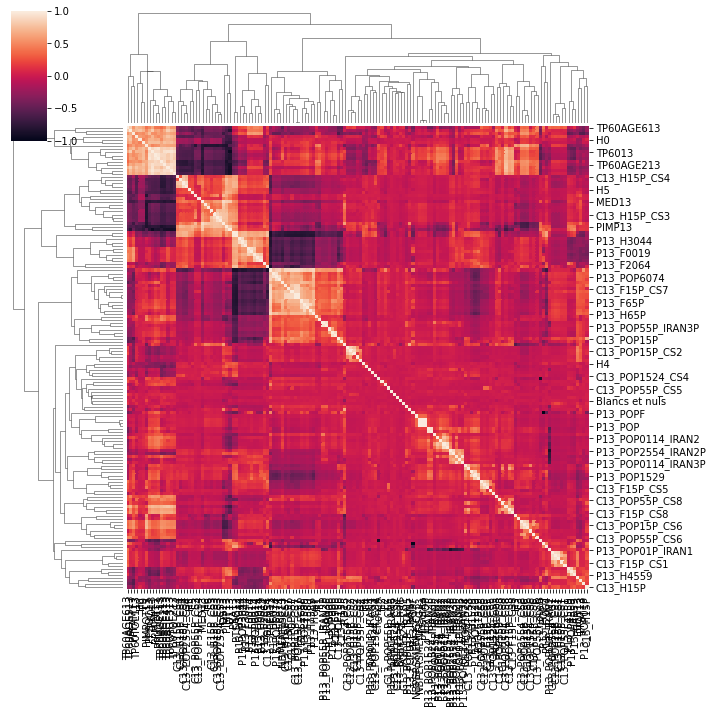

In [21]:
corr = df_explore.select_dtypes('float').corr()
# correlation map linked by average method and euclidean metric :
grid = sns.clustermap(corr, xticklabels=True)
label_order = [xl.get_text() for xl in grid.ax_heatmap.get_xmajorticklabels()]

**Observation :** Presque la moitée des données n'ont pas de correlation entres elles, beaucoups d'entres elle provienne des données demographiques.

In [22]:
# print(label_order)
for i in range(len(label_order)) :
    print(f'{label_order[i] :-<50} {i}')

TP60AGE613---------------------------------------- 0
TP60AGE513---------------------------------------- 1
PPFAM13------------------------------------------- 2
TP60TOL113---------------------------------------- 3
H0------------------------------------------------ 4
F0------------------------------------------------ 5
PIMPOT13------------------------------------------ 6
PPSOC13------------------------------------------- 7
TP6013-------------------------------------------- 8
PPMINI13------------------------------------------ 9
PPLOGT13------------------------------------------ 10
TP60AGE113---------------------------------------- 11
TP60AGE213---------------------------------------- 12
TP60AGE413---------------------------------------- 13
TP60AGE313---------------------------------------- 14
TP60TOL213---------------------------------------- 15
C13_H15P_CS4-------------------------------------- 16
C13_F15P_CS4-------------------------------------- 17
C13_POP15P_CS4------------------------

In [23]:
correlated_block = ['TP60AGE613', 'TP60AGE513', 'PPFAM13', 'TP60TOL113', 'H0', 'F0', 'PIMPOT13', 'PPSOC13', 'TP6013', 'PPMINI13', 'PPLOGT13', 'TP60AGE113', 'TP60AGE213', 'TP60AGE413', 'TP60AGE313', 'TP60TOL213', 'D913', 'PIMP13', 'D113', 'Choix B', 'C13_H15P_CS4', 'C13_F15P_CS4', 'C13_POP15P_CS4', 'C13_POP2554_CS4', 'H5', 'F5', 'C13_POP55P_CS3', 'C13_POP55P_CS4', 'MED13', 'H6', 'F6', 'C13_F15P_CS3', 'C13_H15P_CS3', 'C13_POP15P_CS3', 'C13_POP2554_CS3', 'PRA13', 'PTSAC13', 'P13_H3044', 'P13_POP3044', 'P13_F3044', 'P13_F0014', 'P13_F0019', 'P13_POP0014', 'P13_H0014', 'P13_H0019', 'P13_F2064', 'C13_POP2554', 'PPEN13', 'P13_H6074', 'P13_POP6074', 'P13_F6074', 'C13_H15P_CS7', 'C13_POP55P', 'C13_F15P_CS7', 'C13_POP15P_CS7', 'C13_POP55P_CS7', 'P13_F65P', 'P13_POP7589', 'P13_F7589', 'P13_H7589', 'P13_H65P', 'H1', 'F1', 'P13_POP55P_IRAN2P', 'P13_POP55P_IRAN3P', 'P13_H90P', 'P13_POP90P', 'P13_F90P', 'C13_POP15P', 'C13_F15P', 'RD13', 'H3', 'F3']
# without poverty
correlated_block = ['H0', 'F0', 'PIMPOT13', 'PPSOC13', 'PPMINI13', 'PPLOGT13', 'D913', 'PIMP13', 'D113', 'Choix B', 'C13_H15P_CS4', 'C13_F15P_CS4', 'C13_POP15P_CS4', 'C13_POP2554_CS4', 'H5', 'F5', 'C13_POP55P_CS3', 'C13_POP55P_CS4', 'MED13', 'H6', 'F6', 'C13_F15P_CS3', 'C13_H15P_CS3', 'C13_POP15P_CS3', 'C13_POP2554_CS3', 'PRA13', 'PTSAC13', 'P13_H3044', 'P13_POP3044', 'P13_F3044', 'P13_F0014', 'P13_F0019', 'P13_POP0014', 'P13_H0014', 'P13_H0019', 'P13_F2064', 'C13_POP2554', 'PPEN13', 'P13_H6074', 'P13_POP6074', 'P13_F6074', 'C13_H15P_CS7', 'C13_POP55P', 'C13_F15P_CS7', 'C13_POP15P_CS7', 'C13_POP55P_CS7', 'P13_F65P', 'P13_POP7589', 'P13_F7589', 'P13_H7589', 'P13_H65P', 'H1', 'F1', 'P13_POP55P_IRAN2P', 'P13_POP55P_IRAN3P', 'P13_H90P', 'P13_POP90P', 'P13_F90P', 'C13_POP15P', 'C13_F15P', 'RD13', 'H3', 'F3']

##### (i-bis) Mesure specifiques relation "Feature Choix" / "Feature"

Inscrits


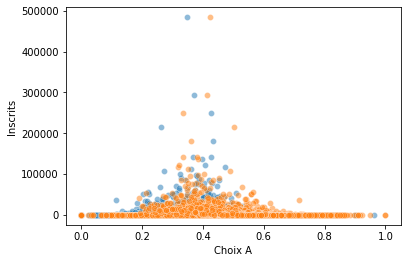

Abstentions


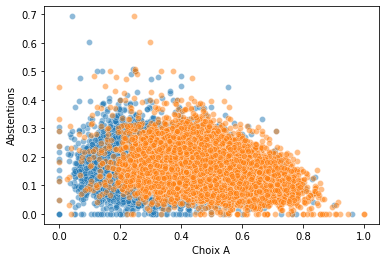

Blancs et nuls


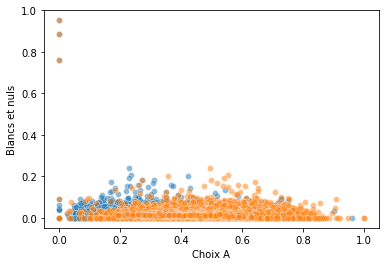

Choix A


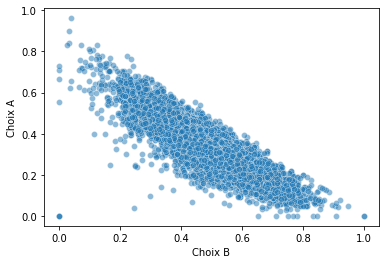

Choix B


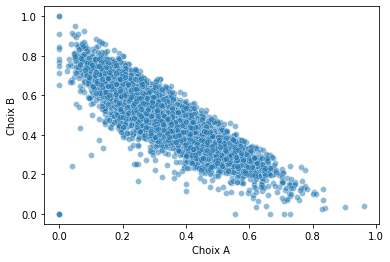

P13_POP


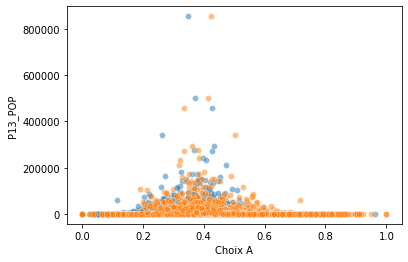

P13_POP0014


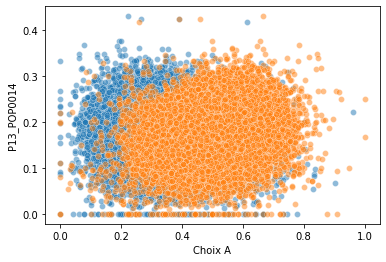

P13_POP1529


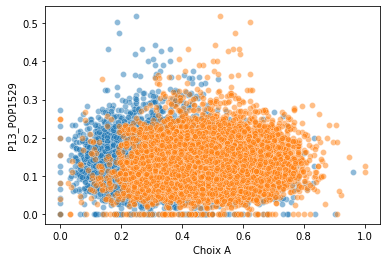

P13_POP3044


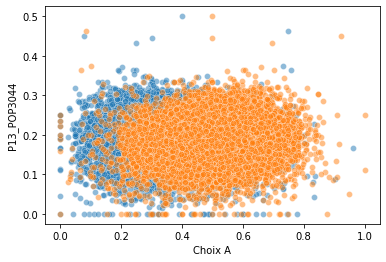

P13_POP4559


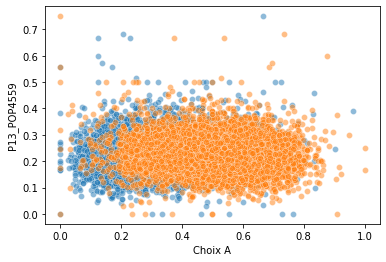

P13_POP6074


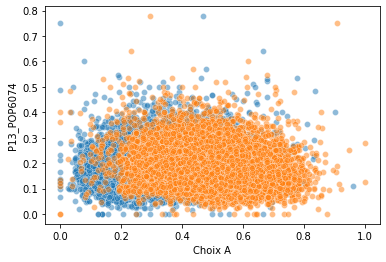

P13_POP7589


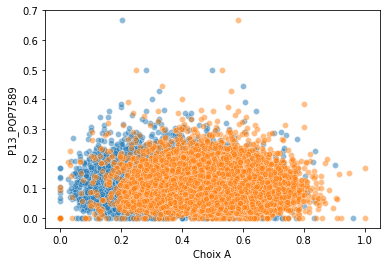

P13_POP90P


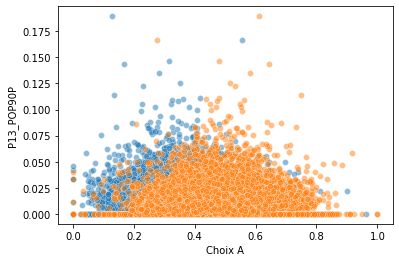

P13_POPH


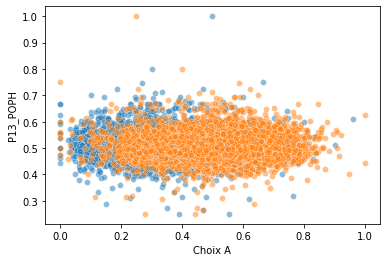

P13_H0014


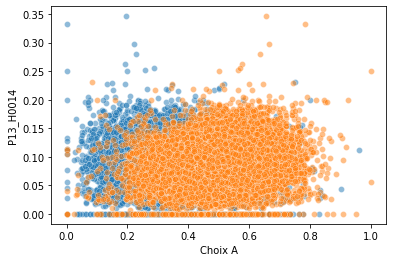

P13_H1529


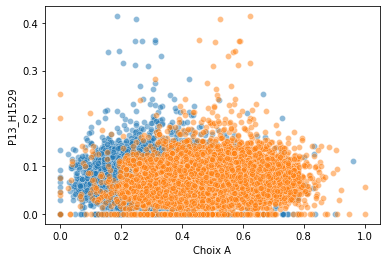

P13_H3044


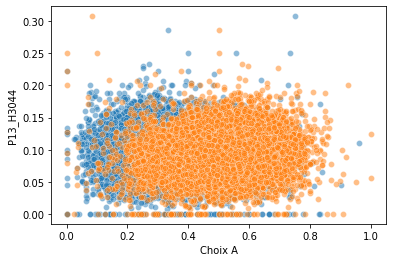

P13_H4559


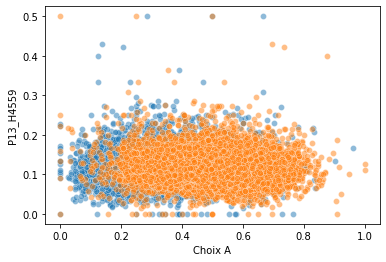

P13_H6074


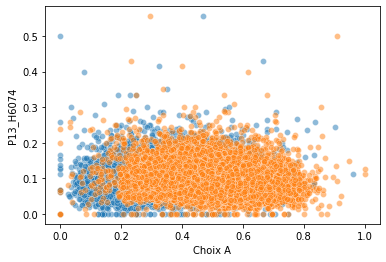

P13_H7589


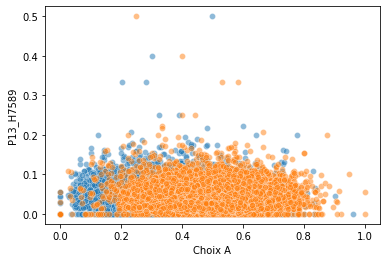

P13_H90P


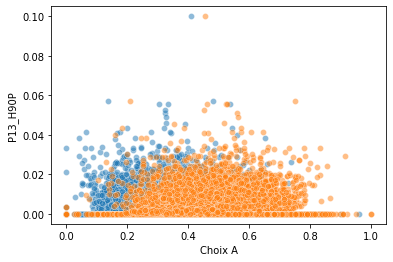

P13_H0019


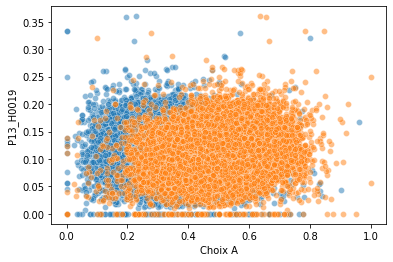

P13_H2064


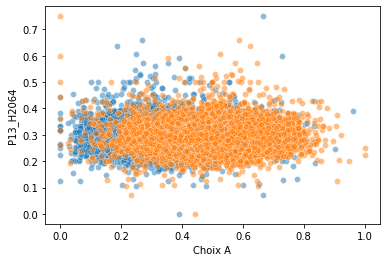

P13_H65P


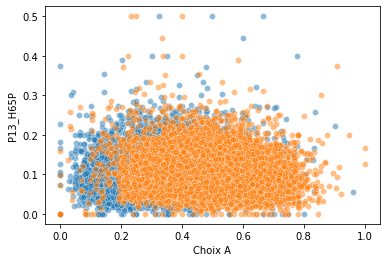

P13_POPF


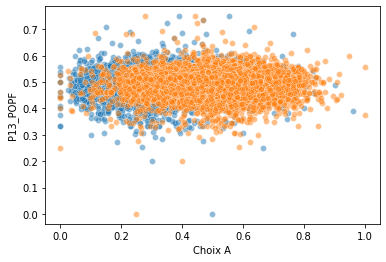

P13_F0014


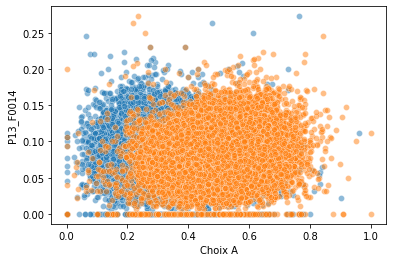

P13_F1529


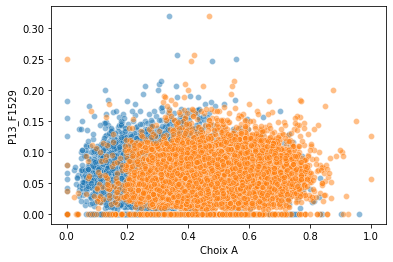

P13_F3044


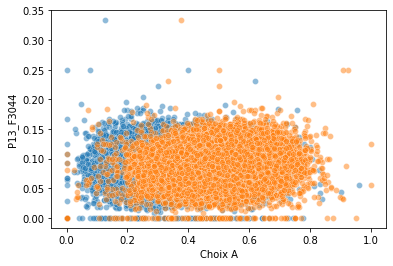

P13_F4559


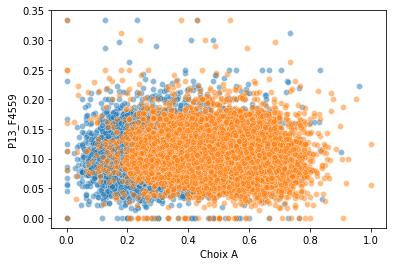

P13_F6074


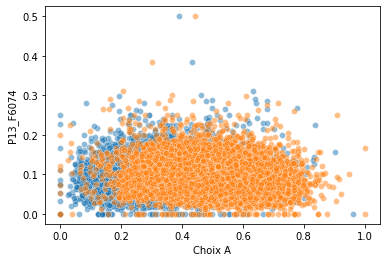

P13_F7589


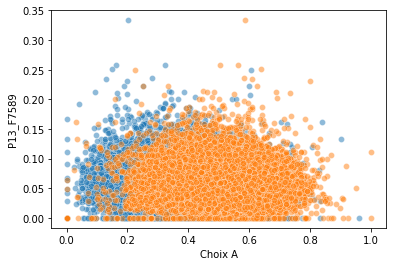

P13_F90P


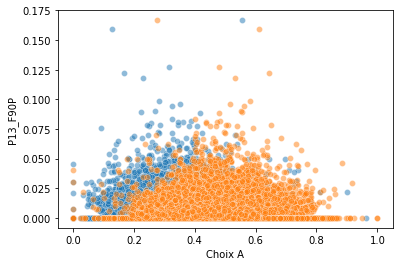

P13_F0019


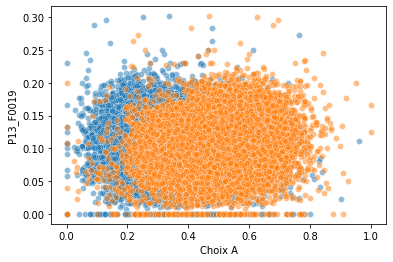

P13_F2064


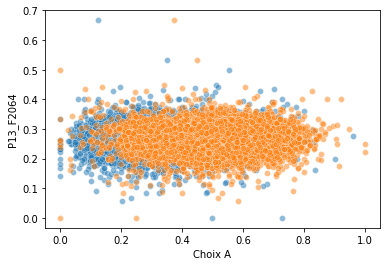

P13_F65P


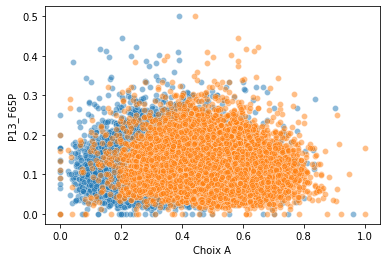

P13_POP01P


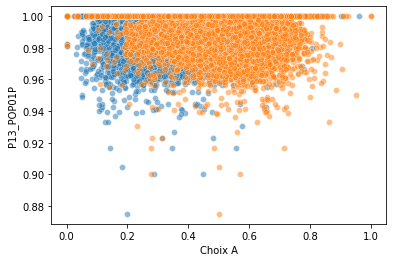

P13_POP01P_IRAN1


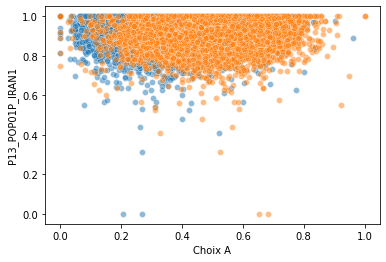

P13_POP01P_IRAN2


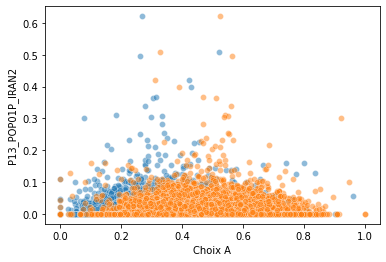

P13_POP01P_IRAN3


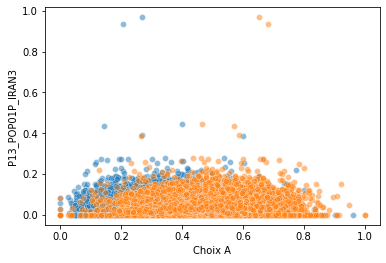

P13_POP01P_IRAN4


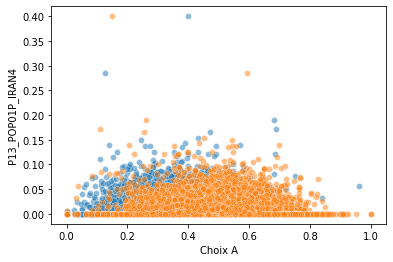

P13_POP01P_IRAN5


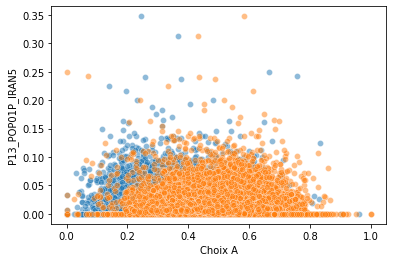

P13_POP01P_IRAN6


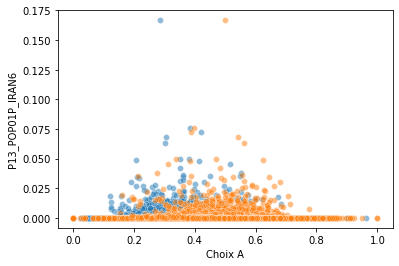

P13_POP01P_IRAN7


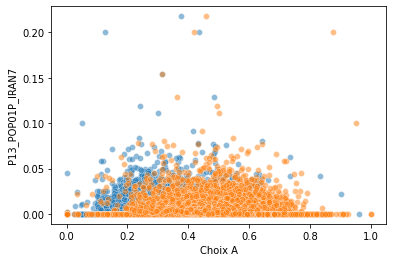

P13_POP0114_IRAN2P


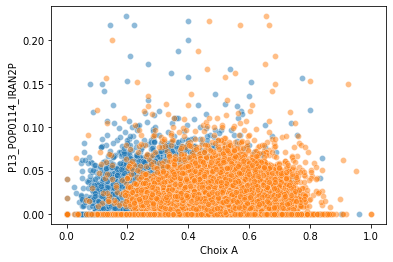

P13_POP0114_IRAN2


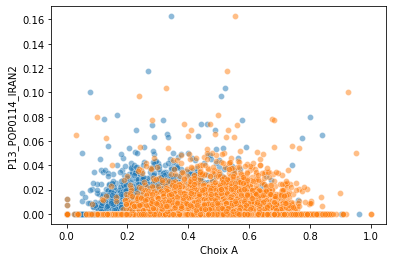

P13_POP0114_IRAN3P


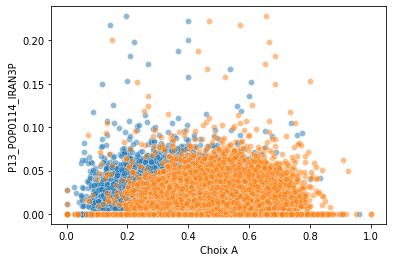

P13_POP1524_IRAN2P


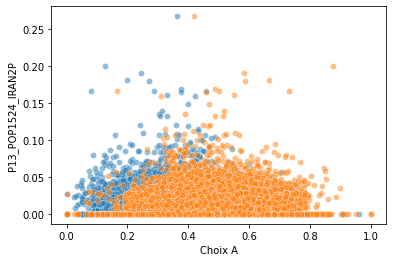

P13_POP1524_IRAN2


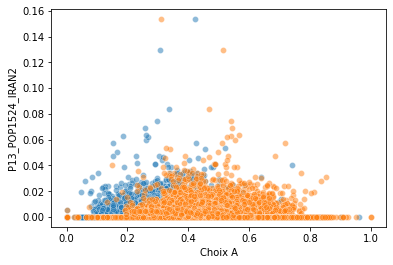

P13_POP1524_IRAN3P


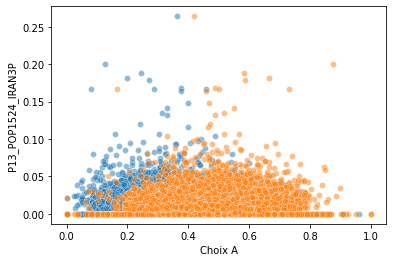

P13_POP2554_IRAN2P


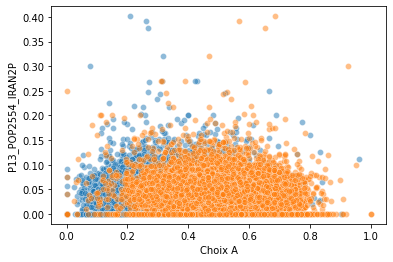

P13_POP2554_IRAN2


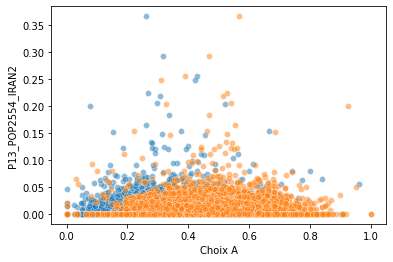

P13_POP2554_IRAN3P


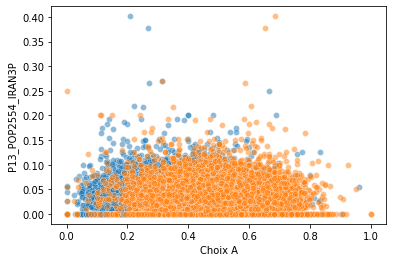

P13_POP55P_IRAN2P


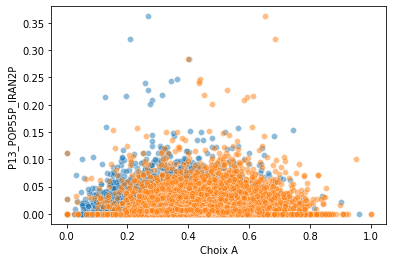

P13_POP55P_IRAN2


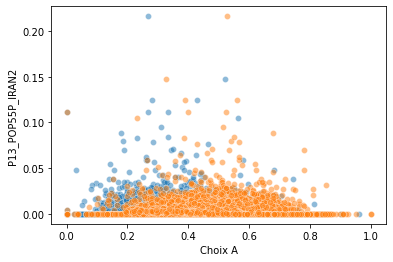

P13_POP55P_IRAN3P


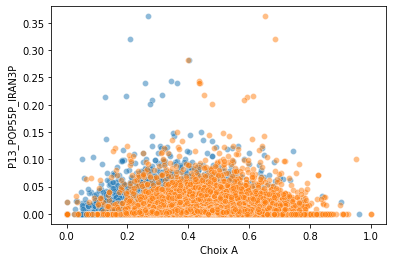

C13_POP15P


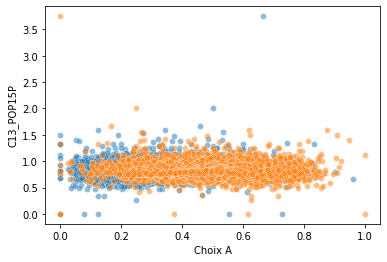

C13_POP15P_CS1


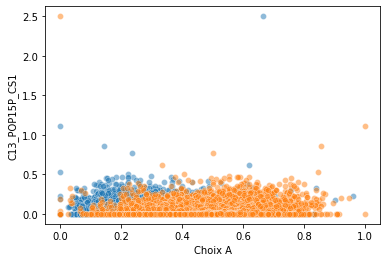

C13_POP15P_CS2


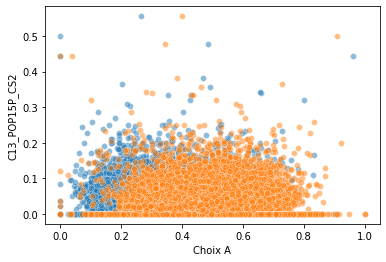

C13_POP15P_CS3


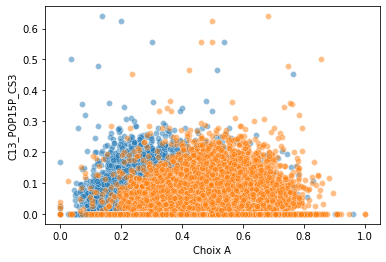

C13_POP15P_CS4


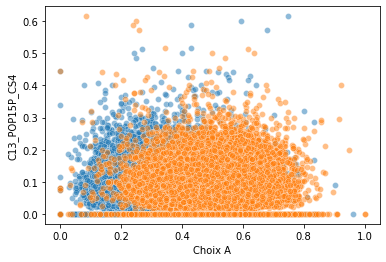

C13_POP15P_CS5


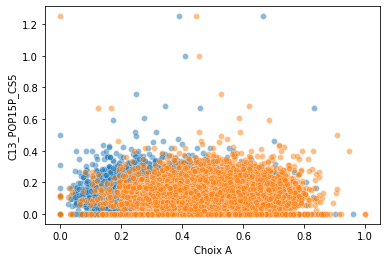

C13_POP15P_CS6


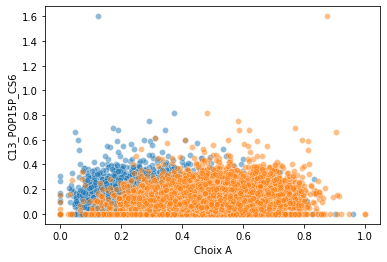

C13_POP15P_CS7


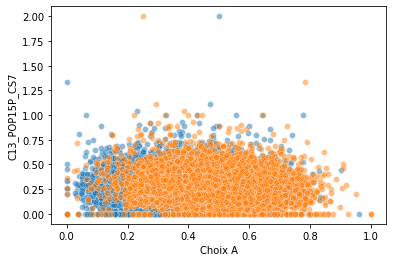

C13_POP15P_CS8


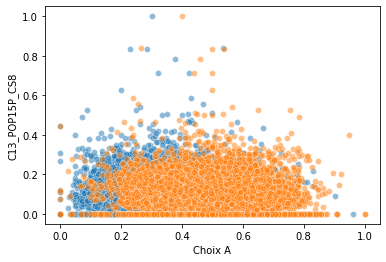

C13_H15P


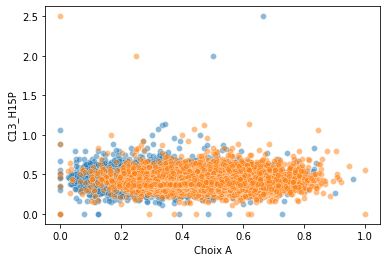

C13_H15P_CS1


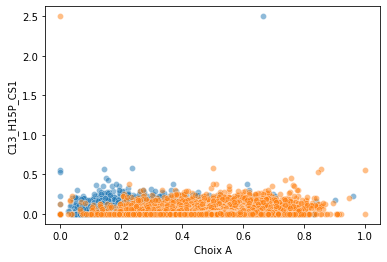

C13_H15P_CS2


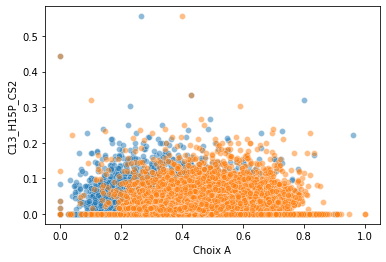

C13_H15P_CS3


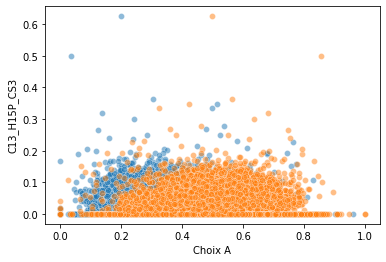

C13_H15P_CS4


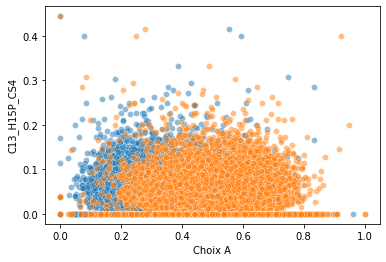

C13_H15P_CS5


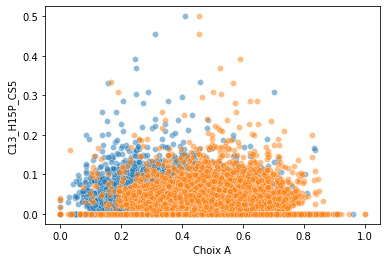

C13_H15P_CS6


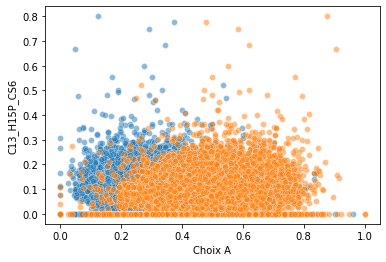

C13_H15P_CS7


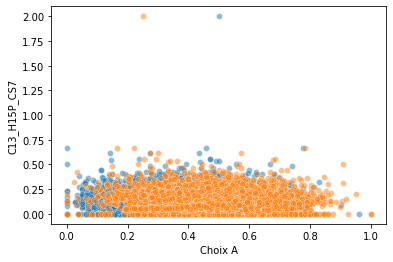

C13_H15P_CS8


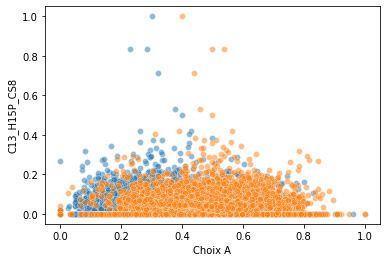

C13_F15P


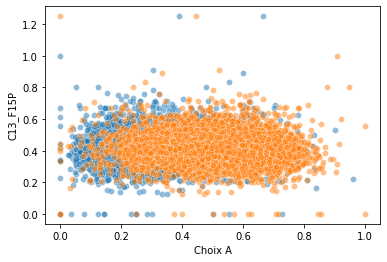

C13_F15P_CS1


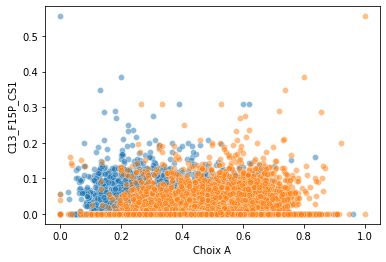

C13_F15P_CS2


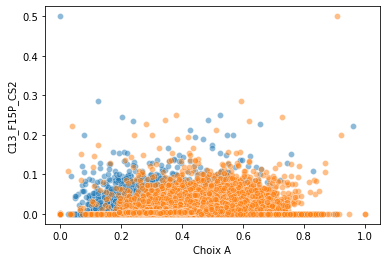

C13_F15P_CS3


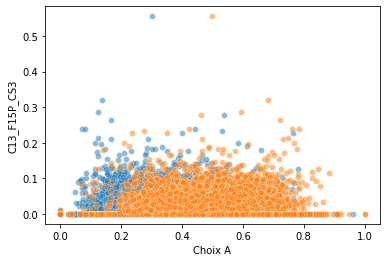

C13_F15P_CS4


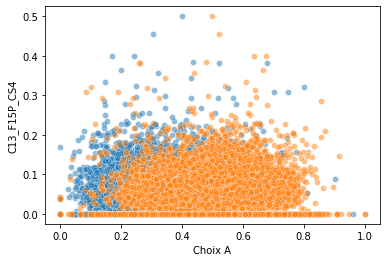

C13_F15P_CS5


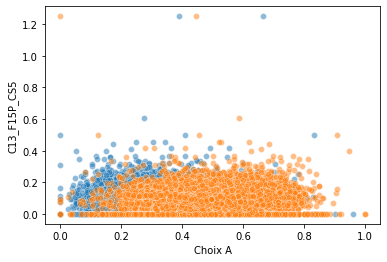

C13_F15P_CS6


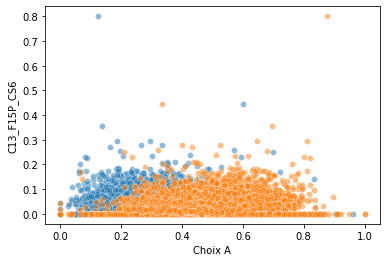

C13_F15P_CS7


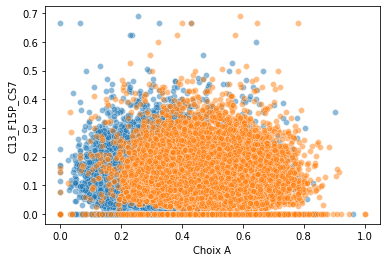

C13_F15P_CS8


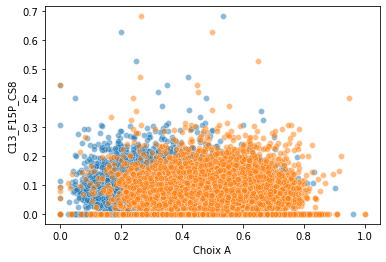

C13_POP1524


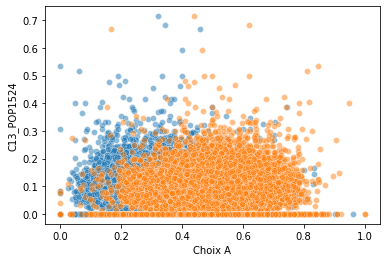

C13_POP1524_CS1


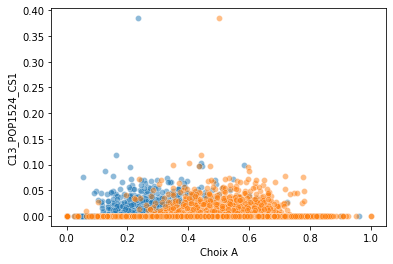

C13_POP1524_CS2


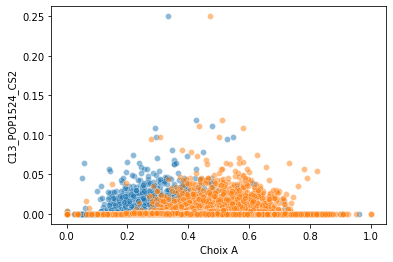

C13_POP1524_CS3


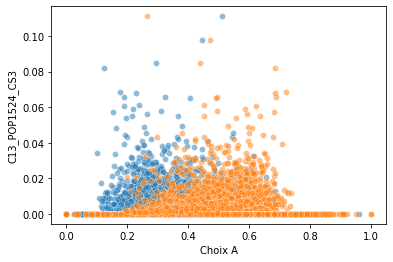

C13_POP1524_CS4


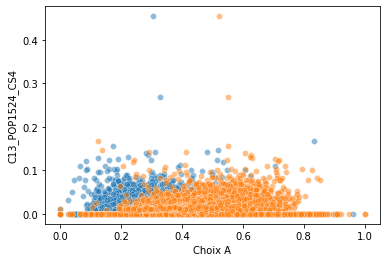

C13_POP1524_CS5


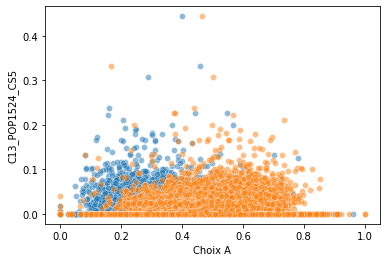

C13_POP1524_CS6


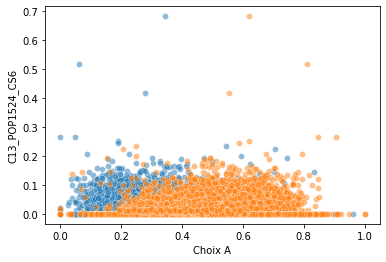

C13_POP1524_CS8


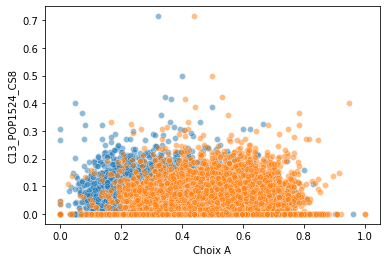

C13_POP2554


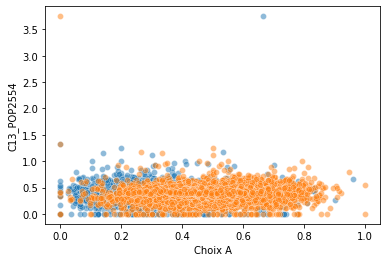

C13_POP2554_CS1


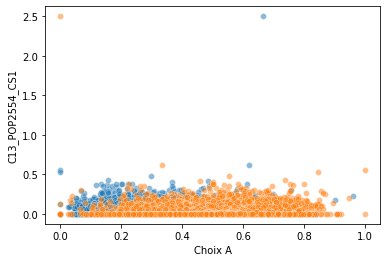

C13_POP2554_CS2


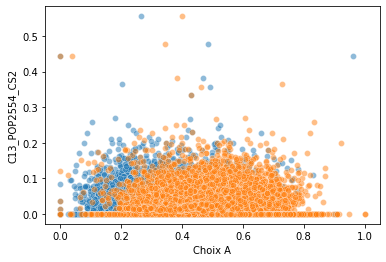

C13_POP2554_CS3


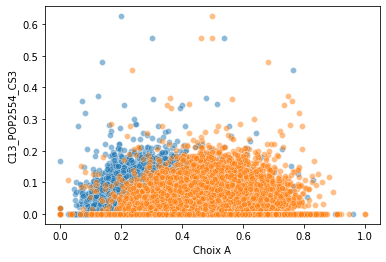

C13_POP2554_CS4


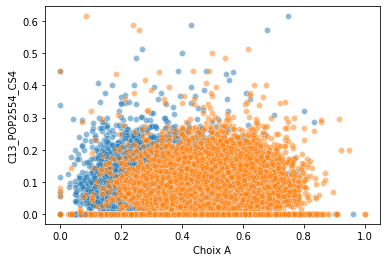

C13_POP2554_CS5


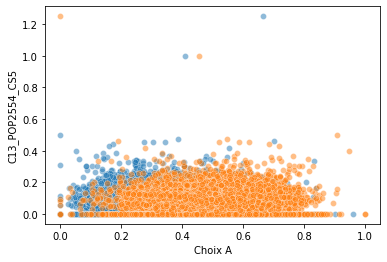

C13_POP2554_CS6


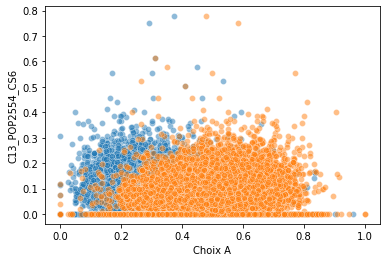

C13_POP2554_CS7


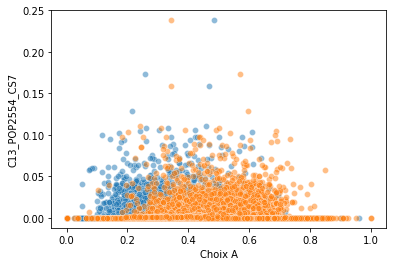

C13_POP2554_CS8


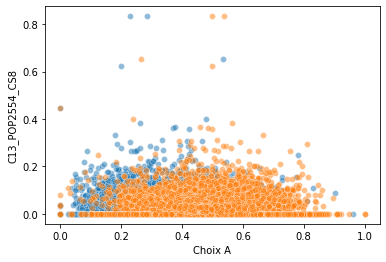

C13_POP55P


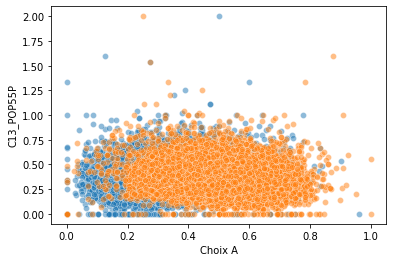

C13_POP55P_CS1


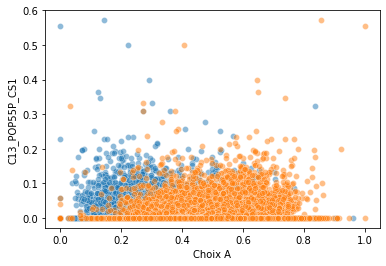

C13_POP55P_CS2


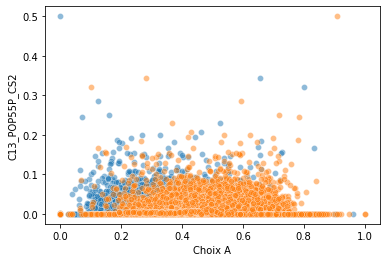

C13_POP55P_CS3


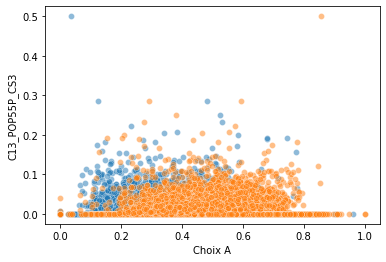

C13_POP55P_CS4


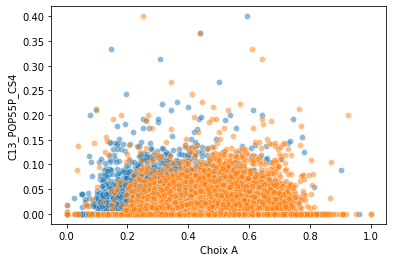

C13_POP55P_CS5


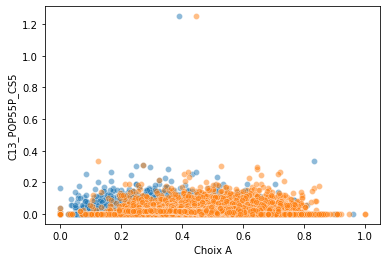

C13_POP55P_CS6


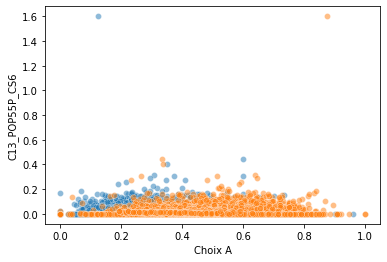

C13_POP55P_CS7


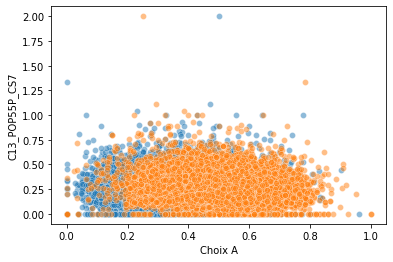

C13_POP55P_CS8


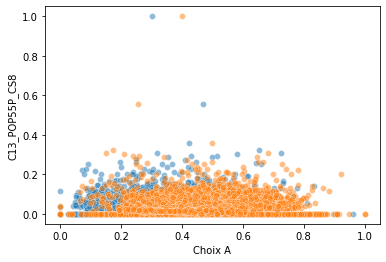

NBMENFISC13


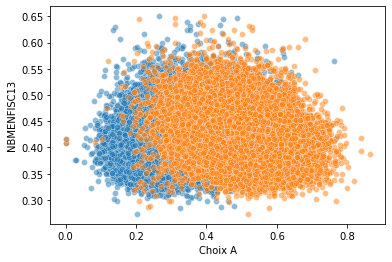

NBPERSMENFISC13


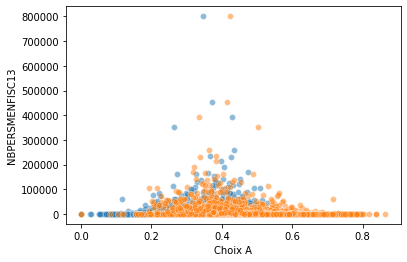

MED13


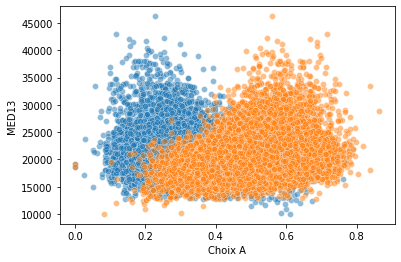

PIMP13


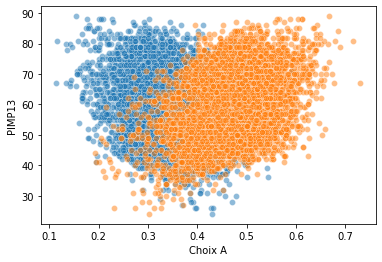

TP6013


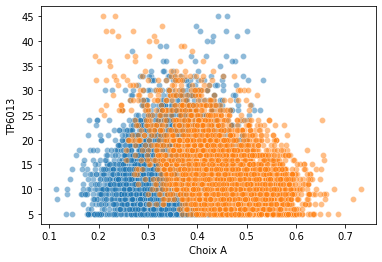

TP60AGE113


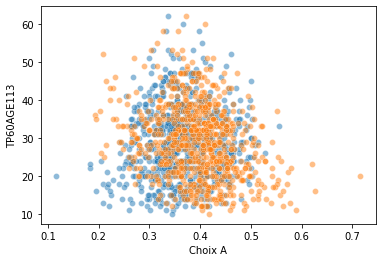

TP60AGE213


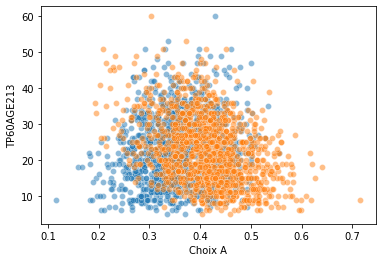

TP60AGE313


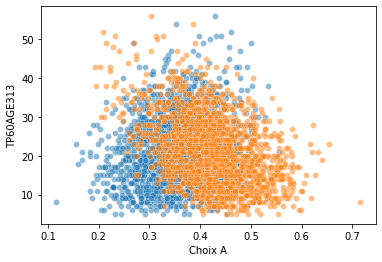

TP60AGE413


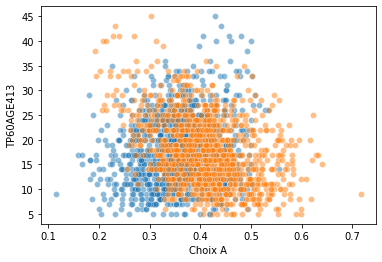

TP60AGE513


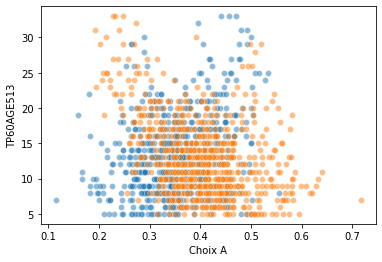

TP60AGE613


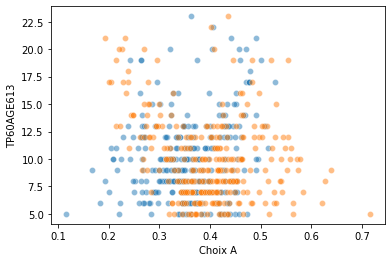

TP60TOL113


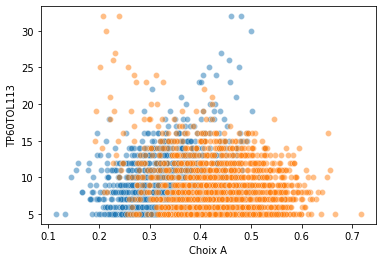

TP60TOL213


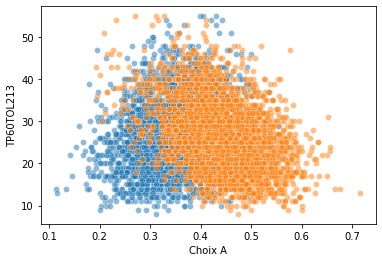

PRA13


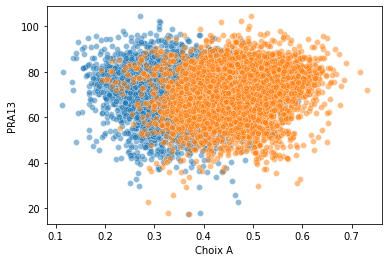

PTSAC13


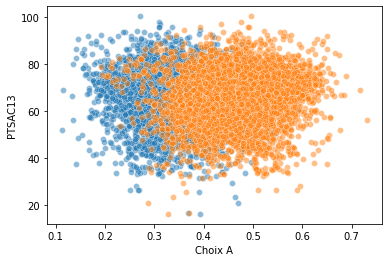

PBEN13


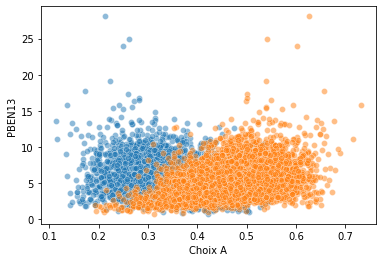

PPEN13


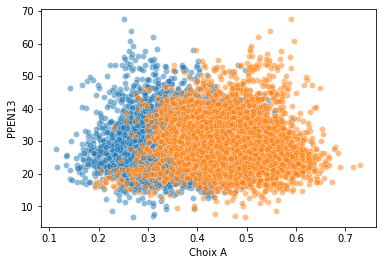

PPAT13


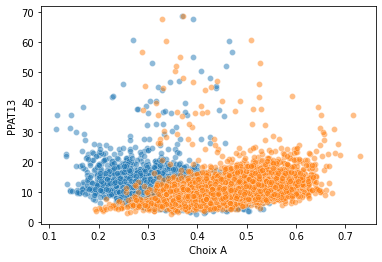

PPSOC13


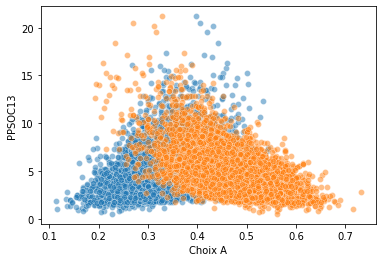

PPFAM13


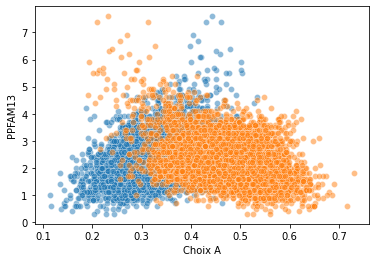

PPMINI13


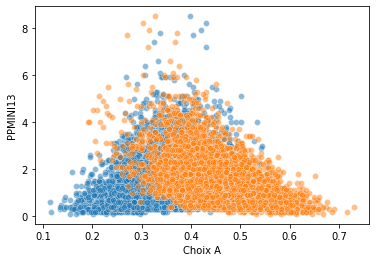

PPLOGT13


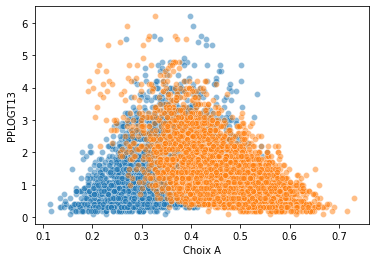

PIMPOT13


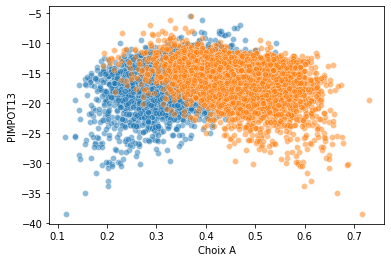

RD13


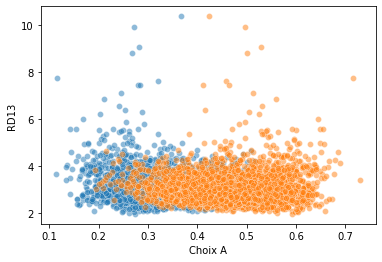

D113


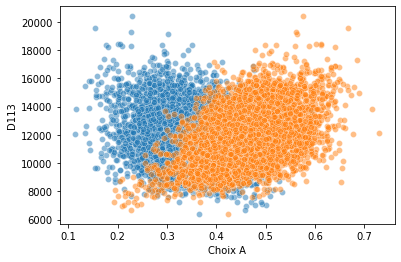

D913


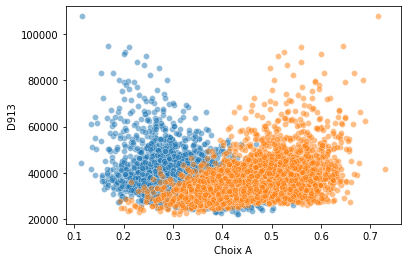

NBPERSMENFISC13_


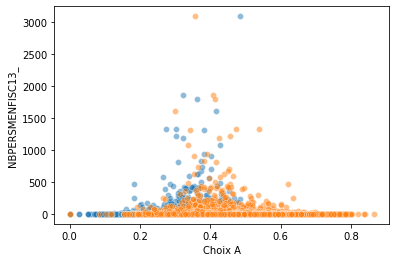

H0


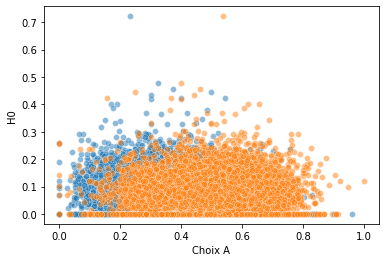

F0


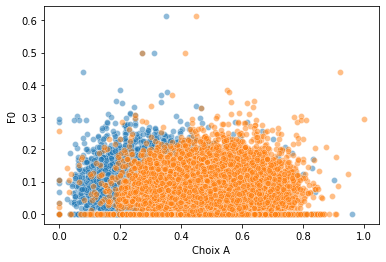

H1


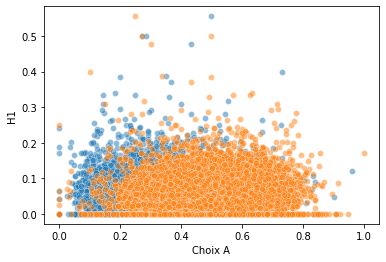

F1


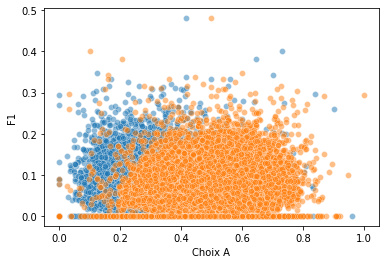

H2


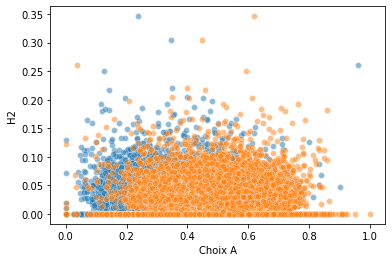

F2


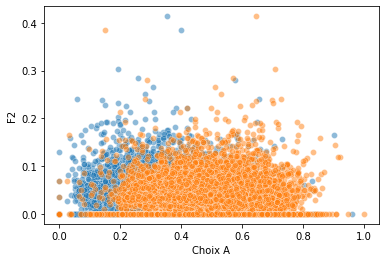

H3


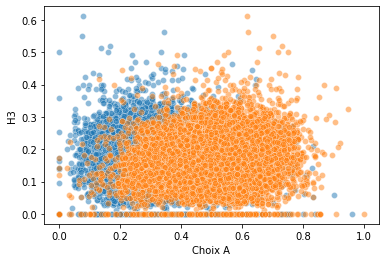

F3


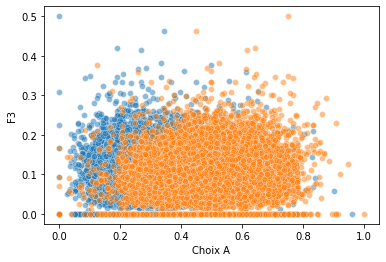

H4


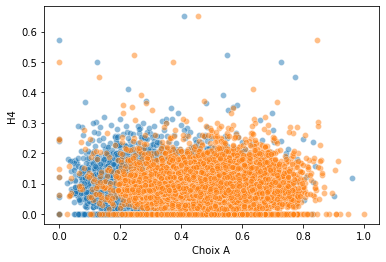

F4


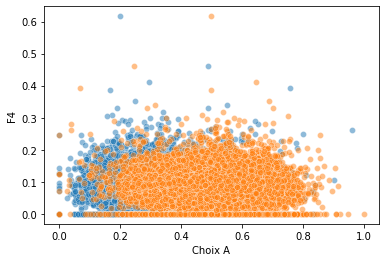

H5


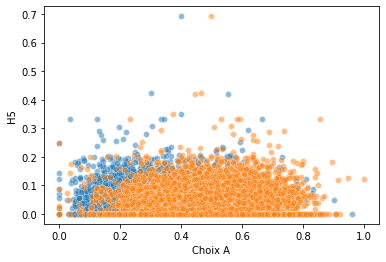

F5


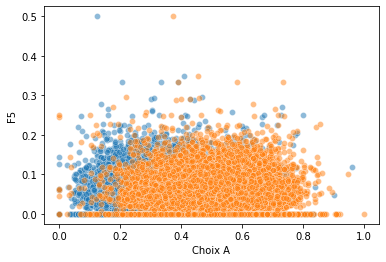

H6


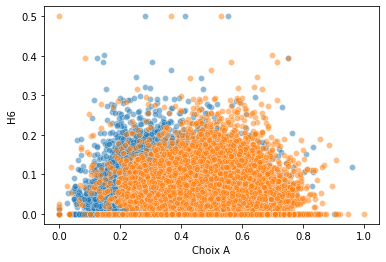

F6


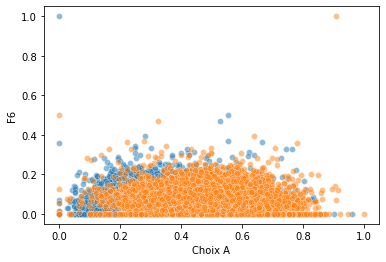

In [24]:
# plot
plt.rcParams.update({'figure.max_open_warning': 0})
for col in df_explore.select_dtypes('float'):
    print(col)
    if col == 'Choix A' : pass
    else : sns.scatterplot(data=df_explore[['Choix A', col]], x='Choix A', y=col, alpha=0.5)
    if col == 'Choix B' : pass
    else : sns.scatterplot(data=df_explore[['Choix B', col]], x='Choix B', y=col, alpha=0.5)
    plt.show(); plt.close()

**Observations :** La normalisation par la population à creer quelque valeurs où la population n'appartient qu'à une seule categorie sociale (tout sera 0 ou 1). Les nuages de points se chevauche beaucoup, néamoins on observe des décalage entre les classes A et B : approfondir par l'analyse des distributions.

#### (ii) Distribution des features par classes

In [25]:
# random reduction (Law of large numbers)
reduced_df = df_explore.sample(1000, random_state=0)
# drop all NAN
reduced_df = df_explore.dropna()
# show
reduced_df.shape

(290, 152)

Inscrits


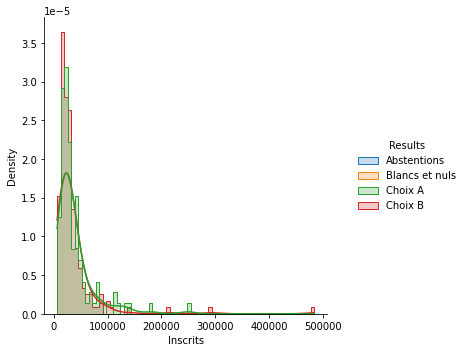

Abstentions


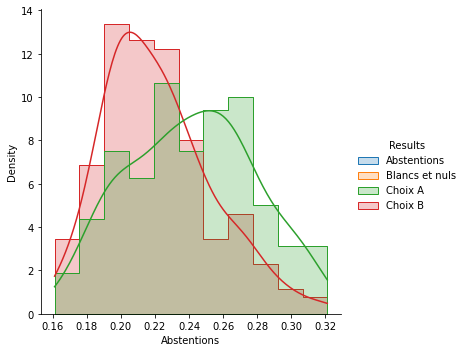

Blancs et nuls


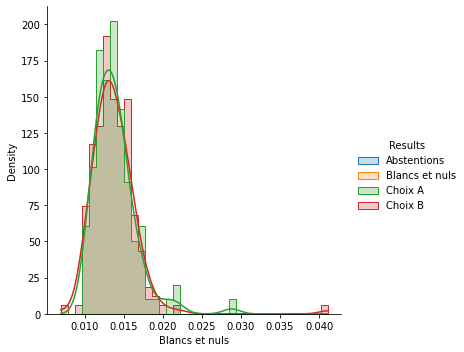

Choix A


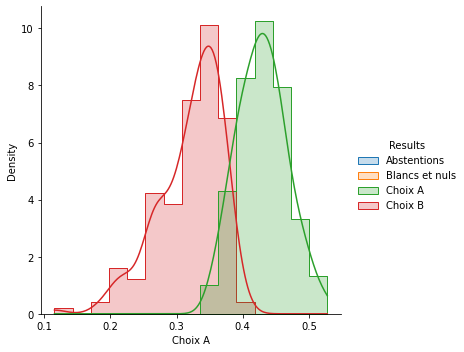

Choix B


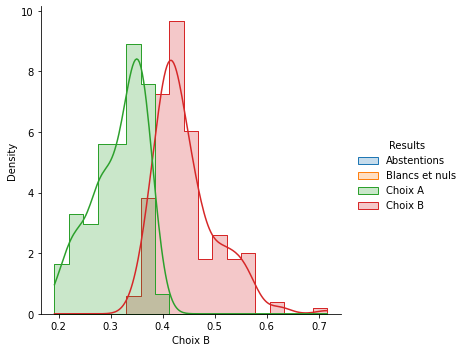

P13_POP


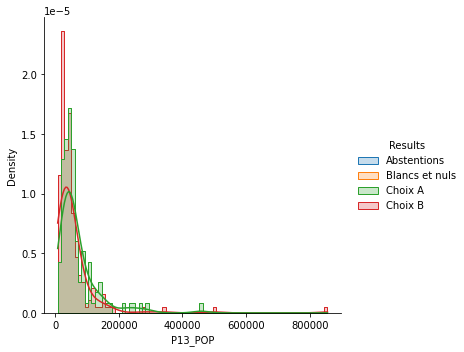

P13_POP0014


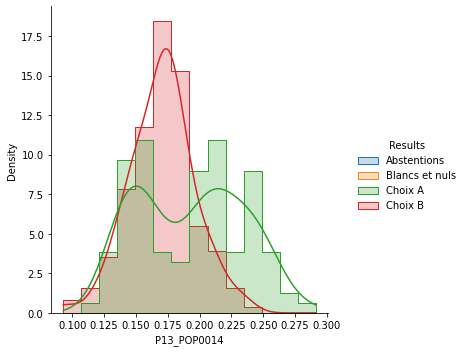

P13_POP1529


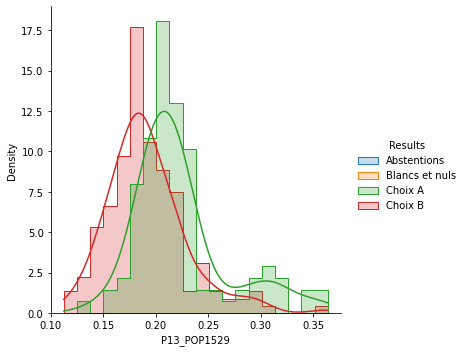

P13_POP3044


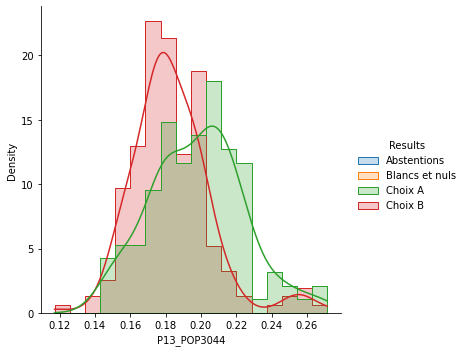

P13_POP4559


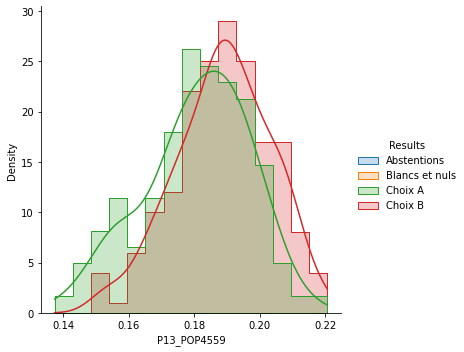

P13_POP6074


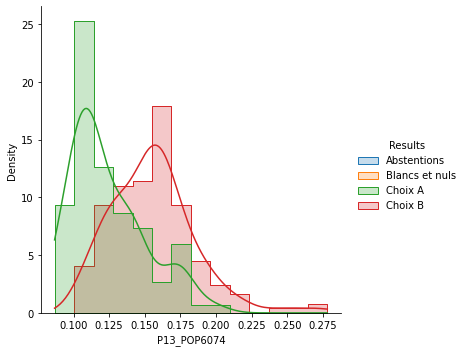

P13_POP7589


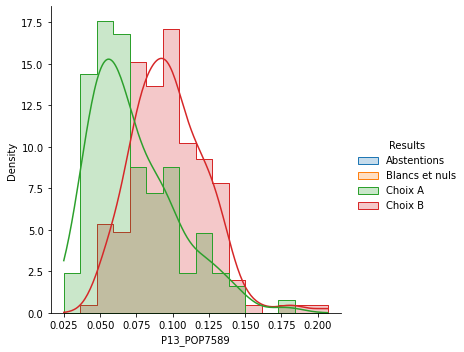

P13_POP90P


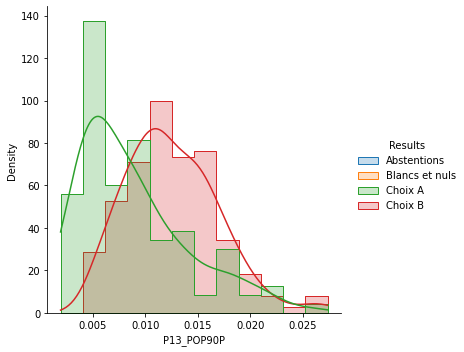

P13_POPH


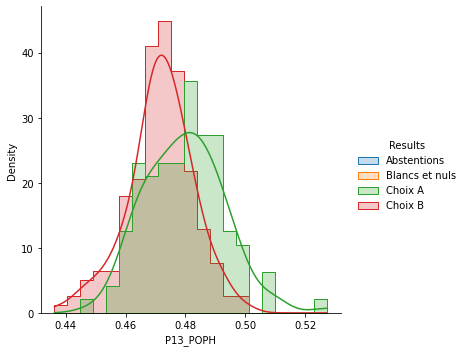

P13_H0014


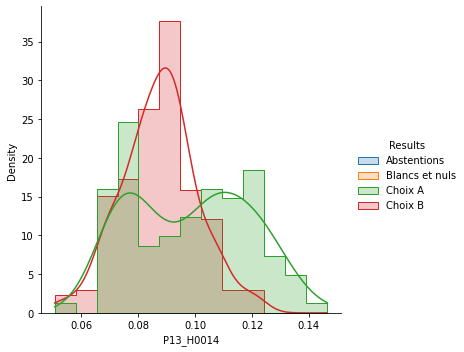

P13_H1529


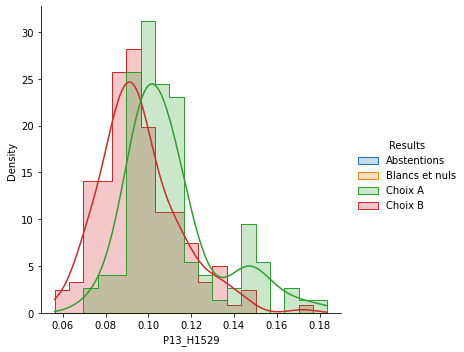

P13_H3044


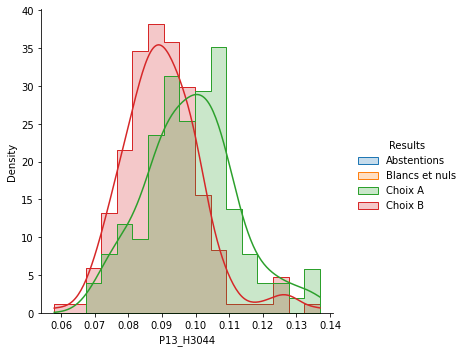

P13_H4559


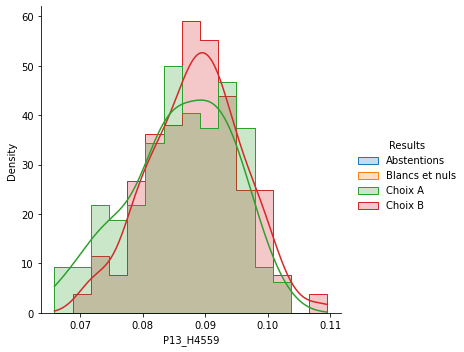

P13_H6074


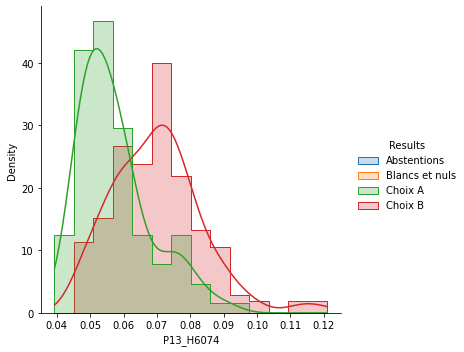

P13_H7589


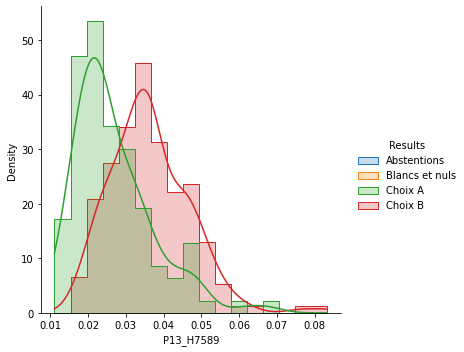

P13_H90P


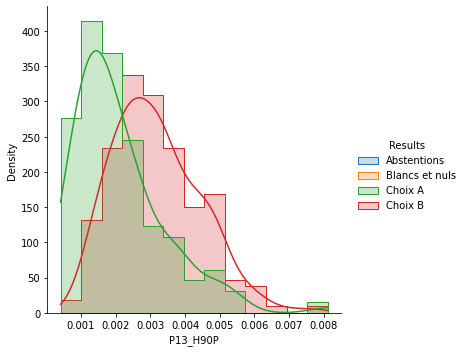

P13_H0019


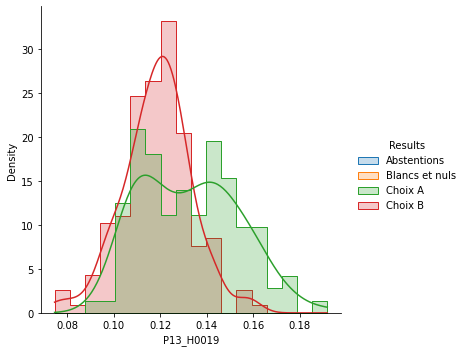

P13_H2064


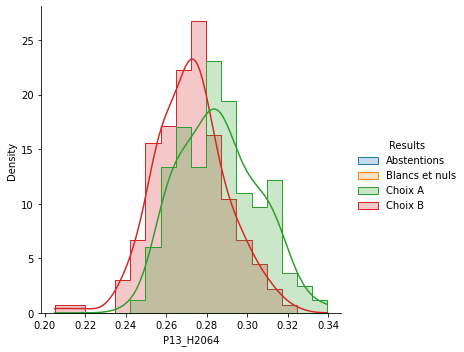

P13_H65P


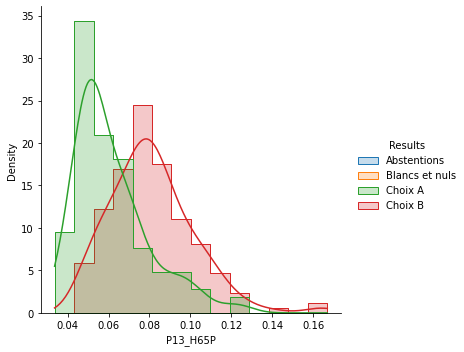

P13_POPF


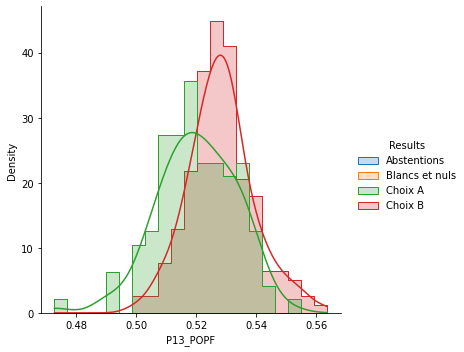

P13_F0014


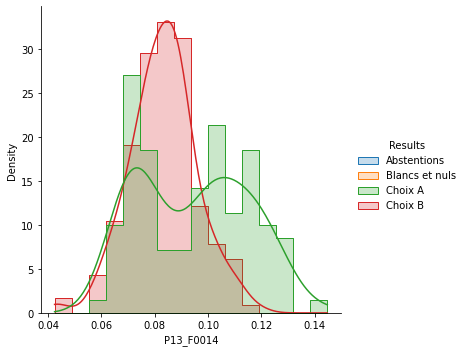

P13_F1529


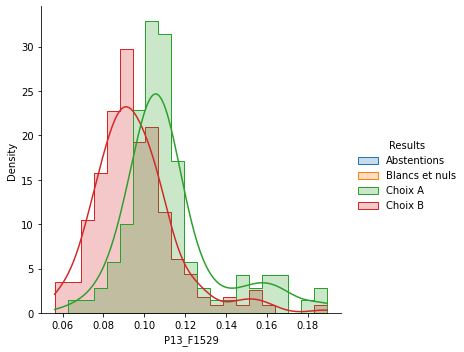

P13_F3044


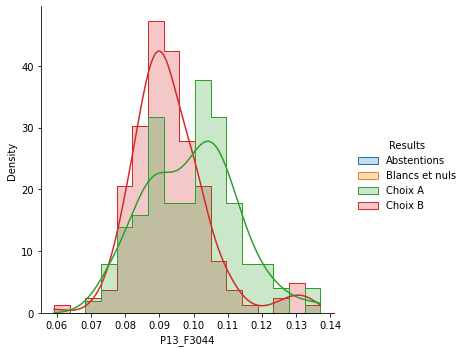

P13_F4559


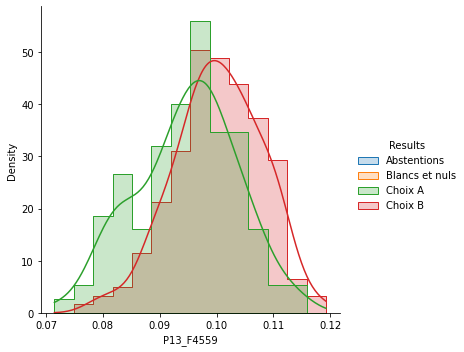

P13_F6074


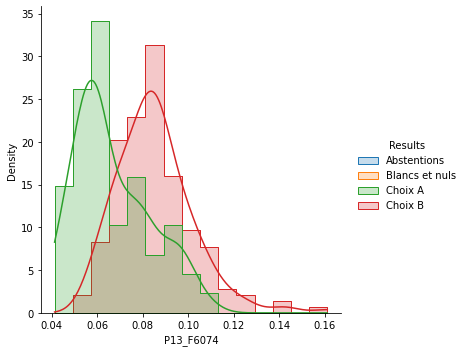

P13_F7589


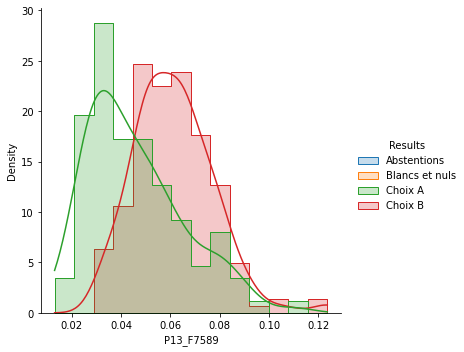

P13_F90P


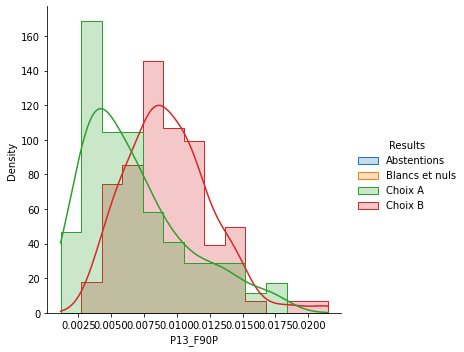

P13_F0019


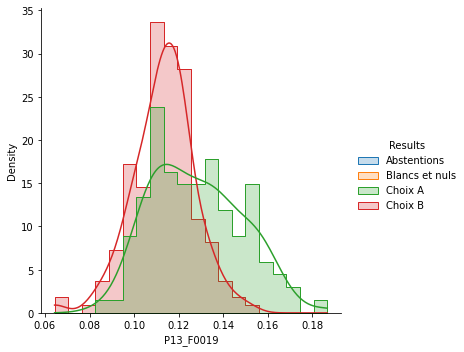

P13_F2064


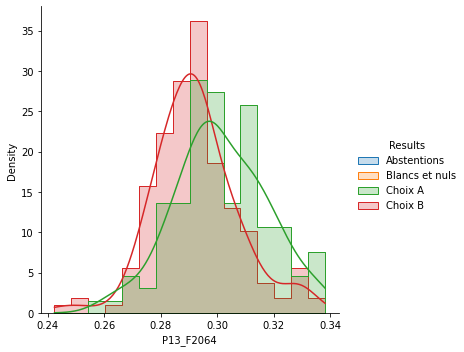

P13_F65P


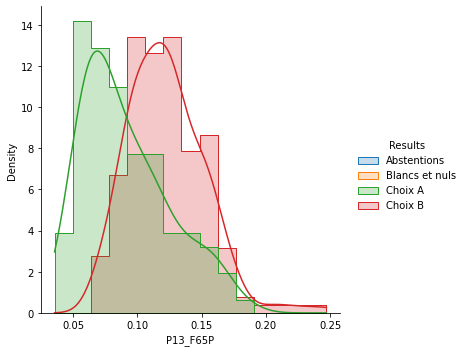

P13_POP01P


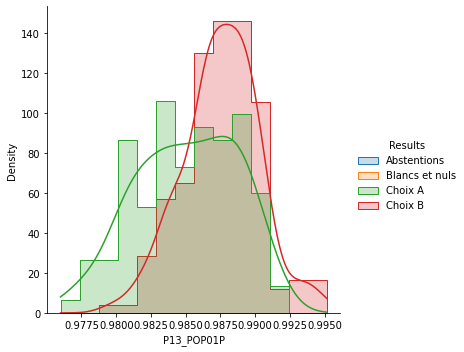

P13_POP01P_IRAN1


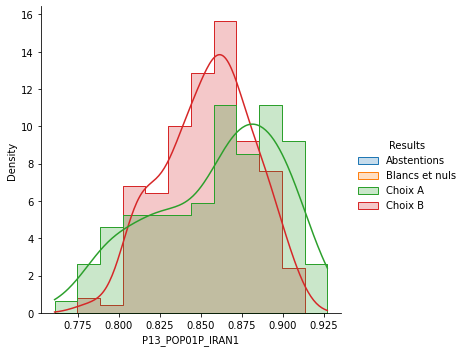

P13_POP01P_IRAN2


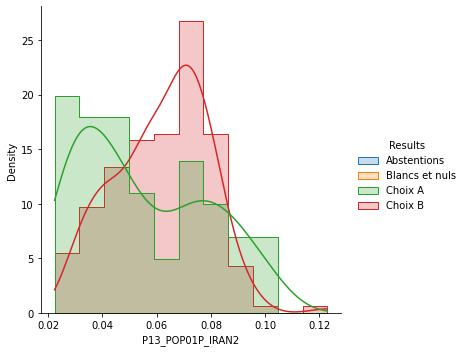

P13_POP01P_IRAN3


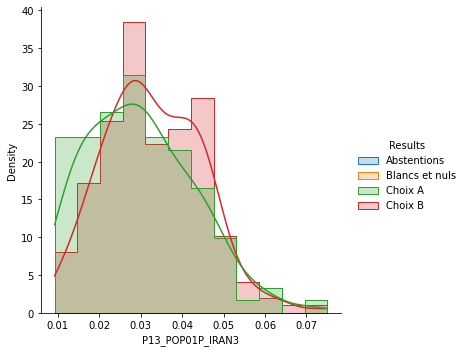

P13_POP01P_IRAN4


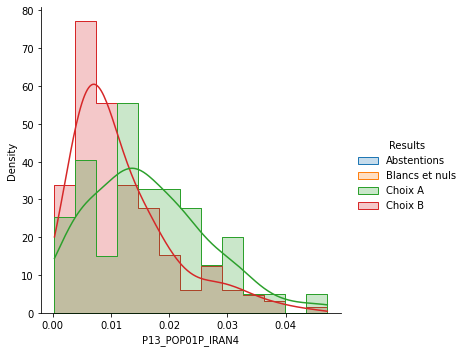

P13_POP01P_IRAN5


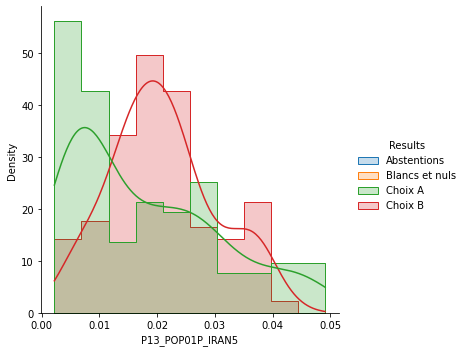

P13_POP01P_IRAN6


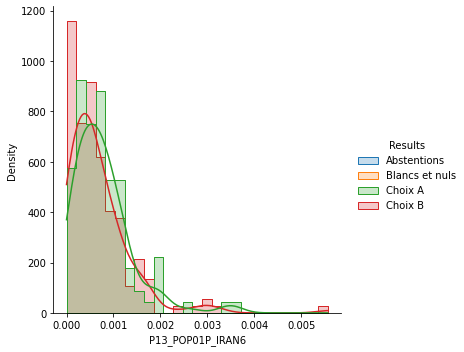

P13_POP01P_IRAN7


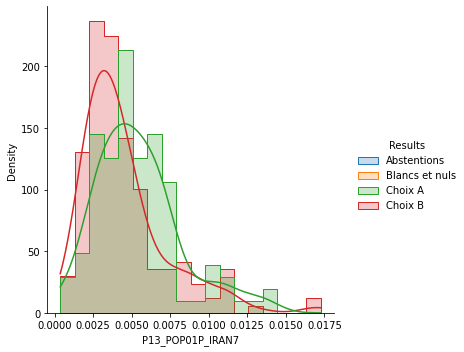

P13_POP0114_IRAN2P


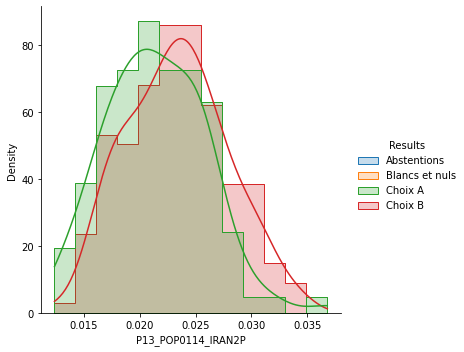

P13_POP0114_IRAN2


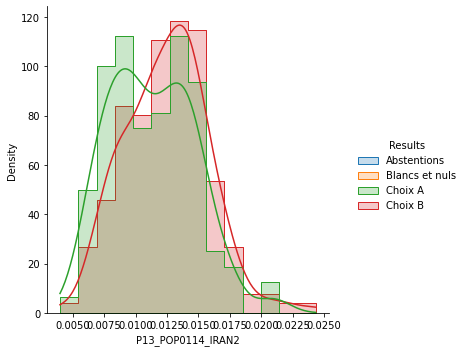

P13_POP0114_IRAN3P


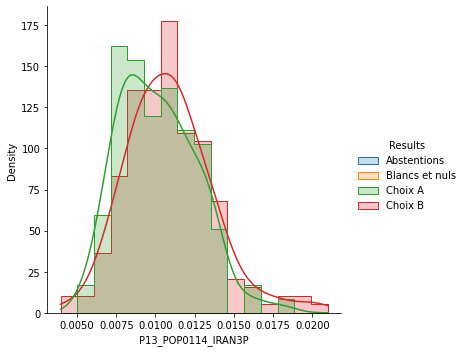

P13_POP1524_IRAN2P


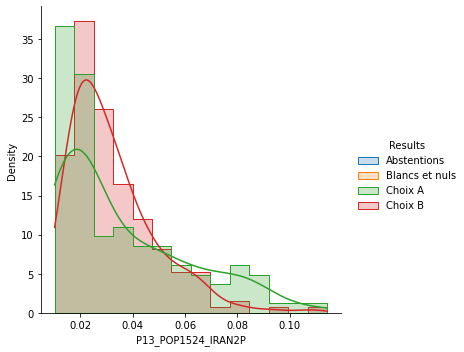

P13_POP1524_IRAN2


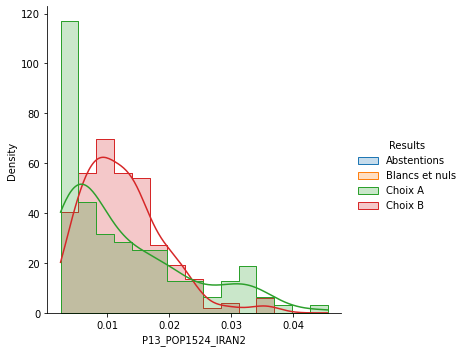

P13_POP1524_IRAN3P


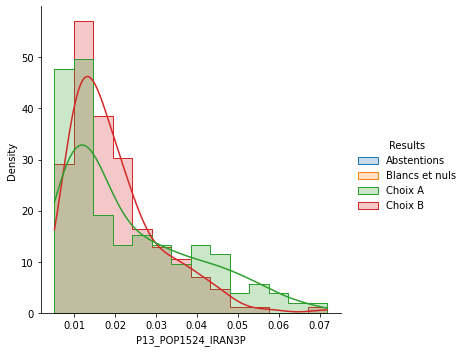

P13_POP2554_IRAN2P


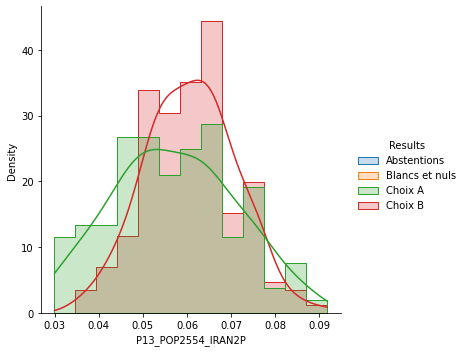

P13_POP2554_IRAN2


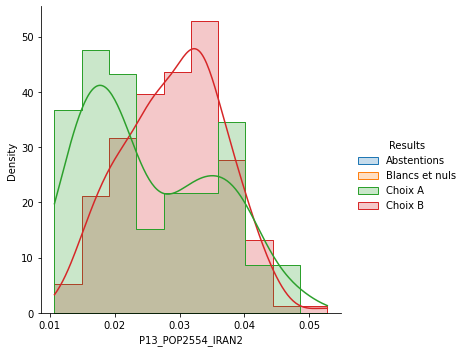

P13_POP2554_IRAN3P


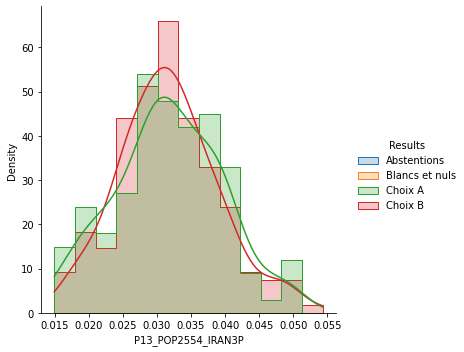

P13_POP55P_IRAN2P


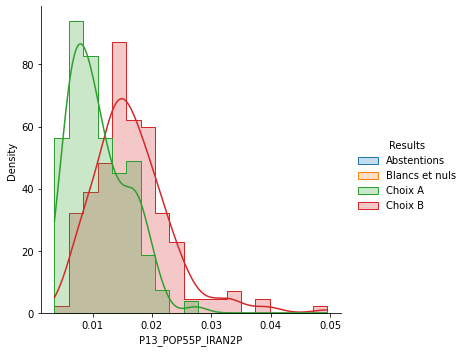

P13_POP55P_IRAN2


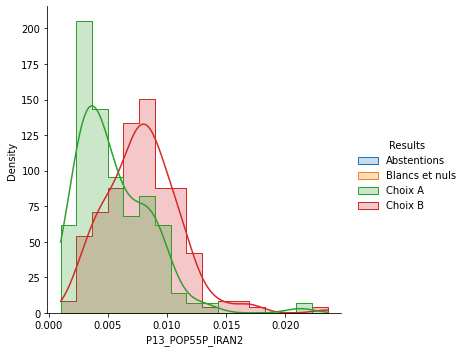

P13_POP55P_IRAN3P


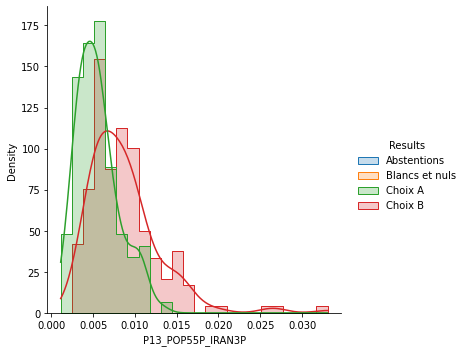

C13_POP15P


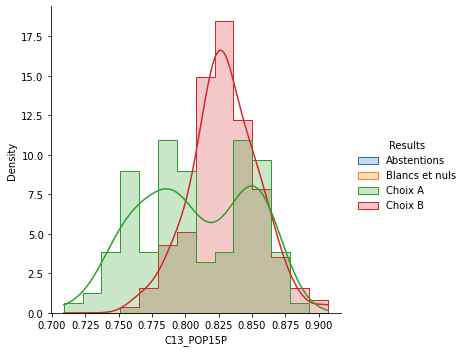

C13_POP15P_CS1


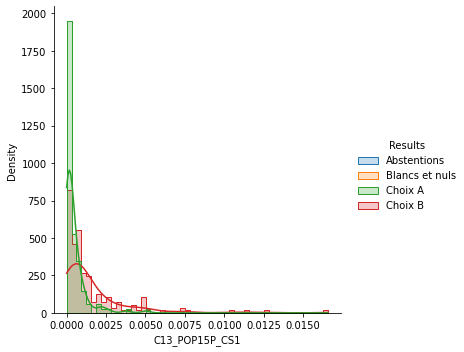

C13_POP15P_CS2


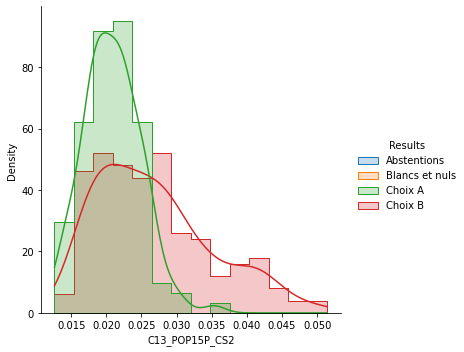

C13_POP15P_CS3


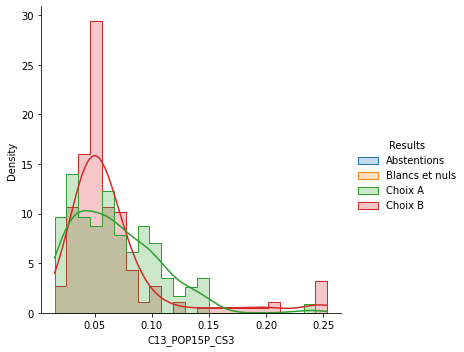

C13_POP15P_CS4


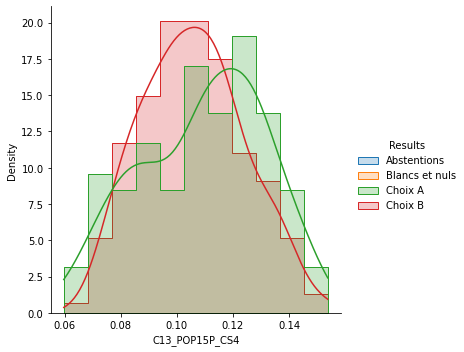

C13_POP15P_CS5


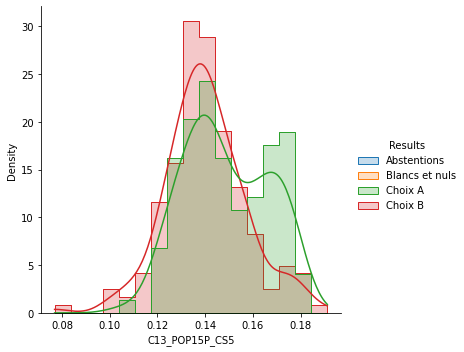

C13_POP15P_CS6


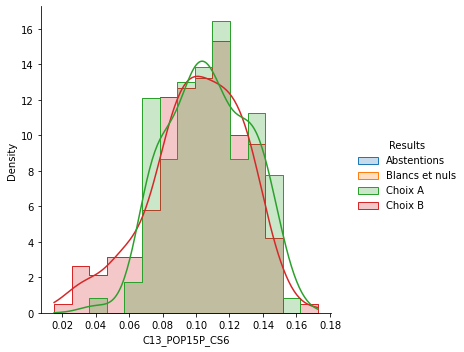

C13_POP15P_CS7


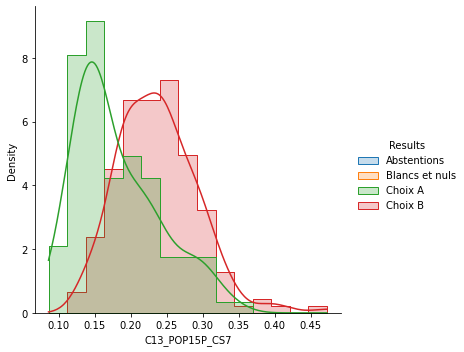

C13_POP15P_CS8


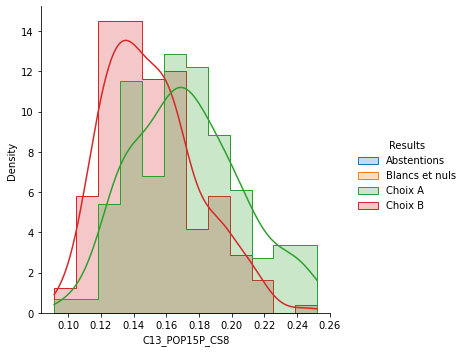

C13_H15P


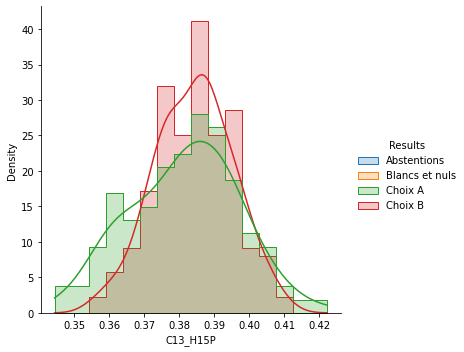

C13_H15P_CS1


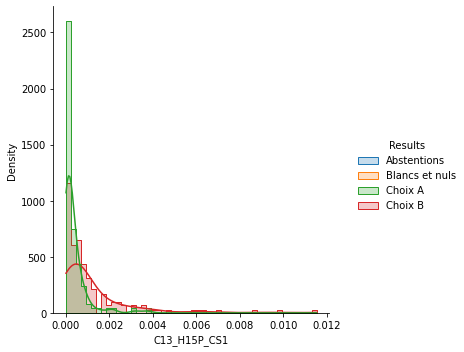

C13_H15P_CS2


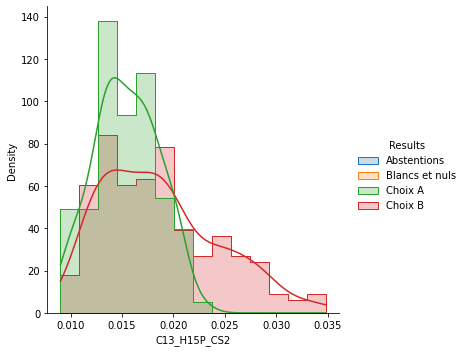

C13_H15P_CS3


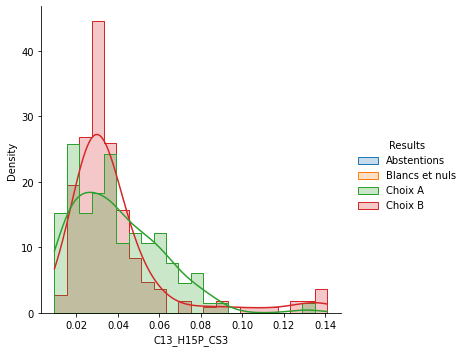

C13_H15P_CS4


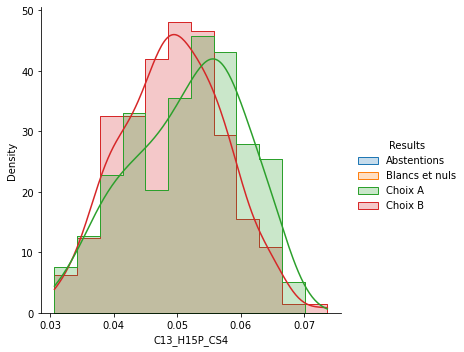

C13_H15P_CS5


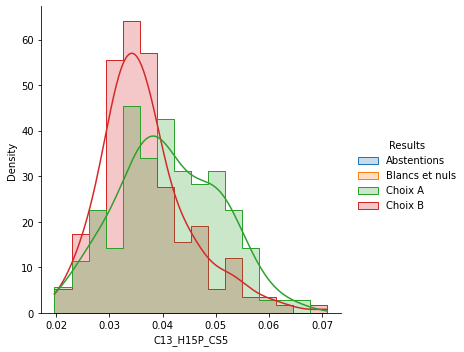

C13_H15P_CS6


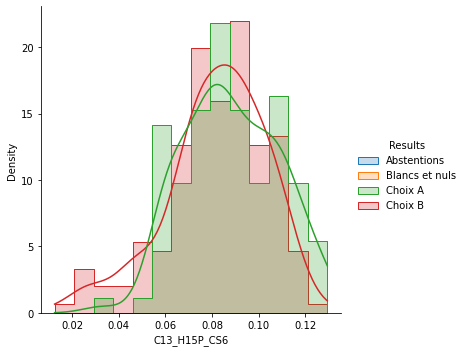

C13_H15P_CS7


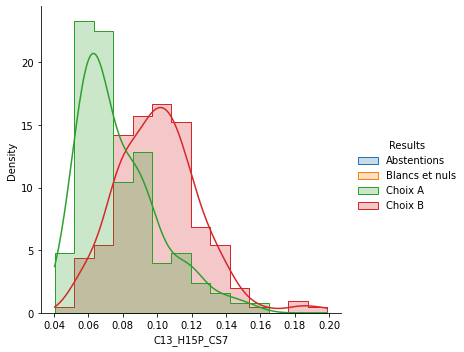

C13_H15P_CS8


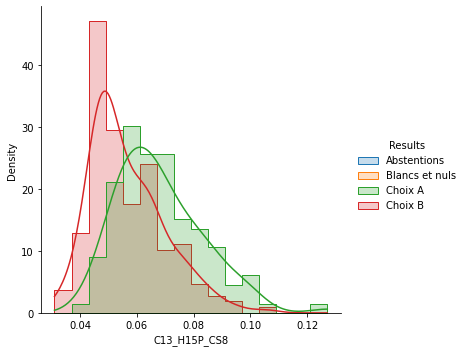

C13_F15P


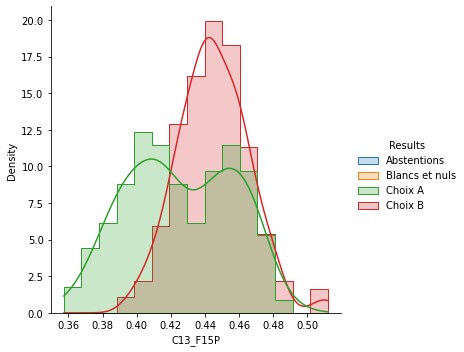

C13_F15P_CS1


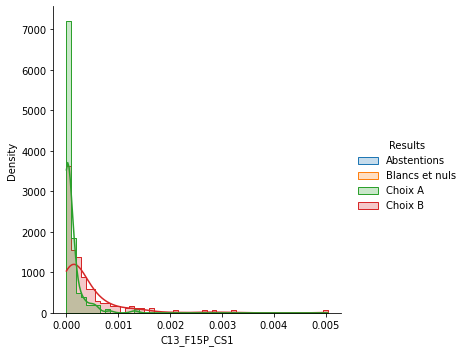

C13_F15P_CS2


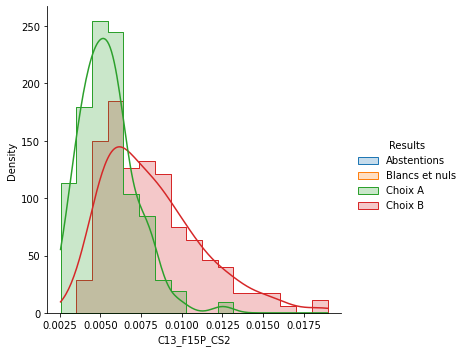

C13_F15P_CS3


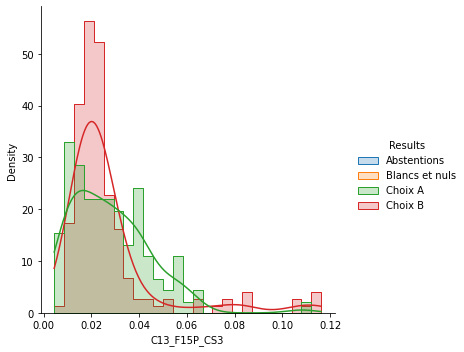

C13_F15P_CS4


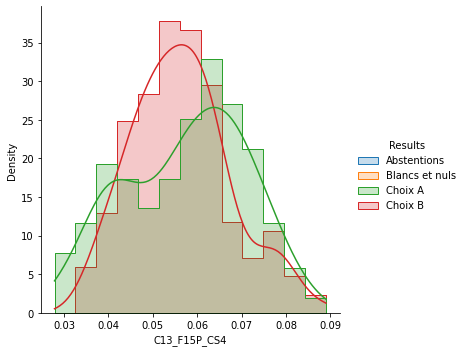

C13_F15P_CS5


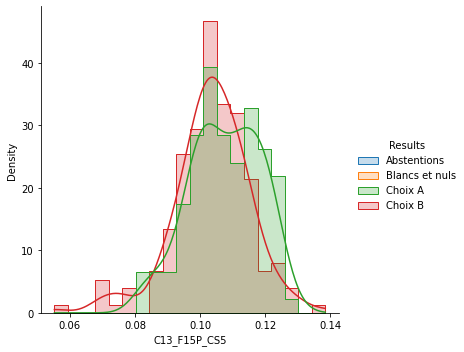

C13_F15P_CS6


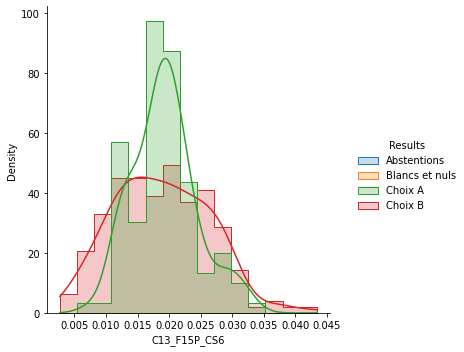

C13_F15P_CS7


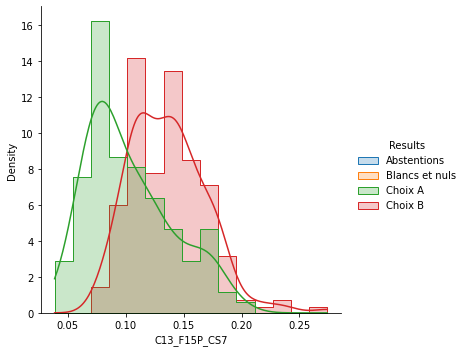

C13_F15P_CS8


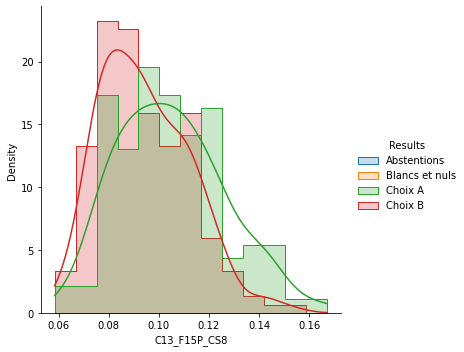

C13_POP1524


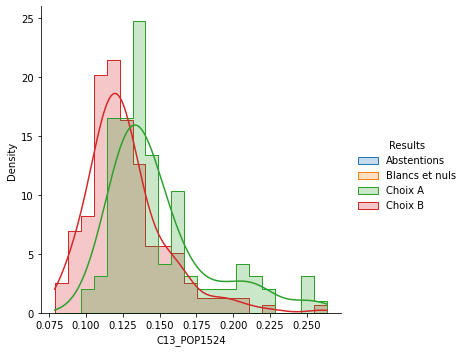

C13_POP1524_CS1


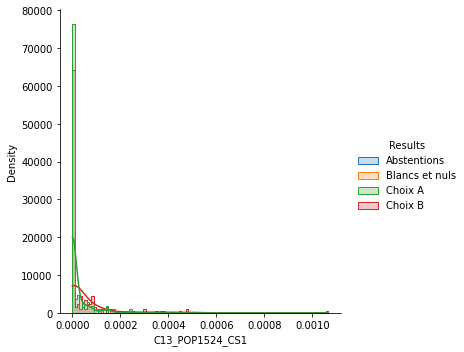

C13_POP1524_CS2


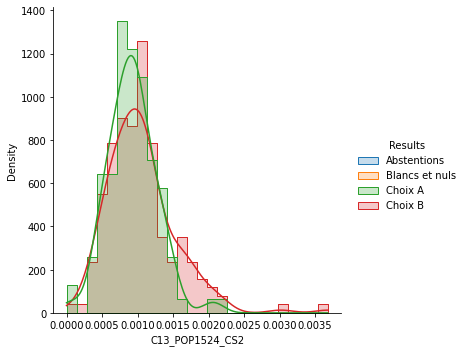

C13_POP1524_CS3


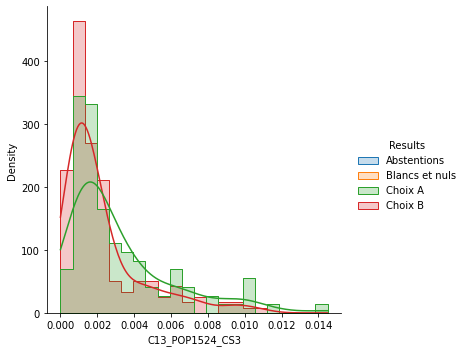

C13_POP1524_CS4


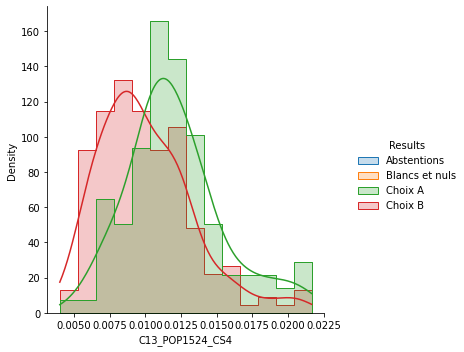

C13_POP1524_CS5


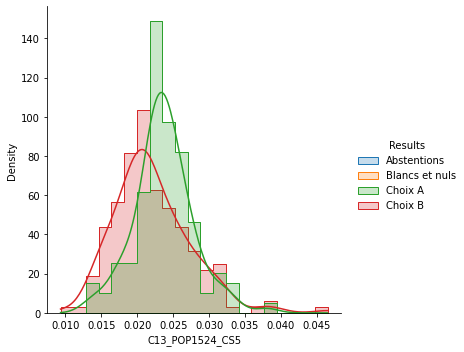

C13_POP1524_CS6


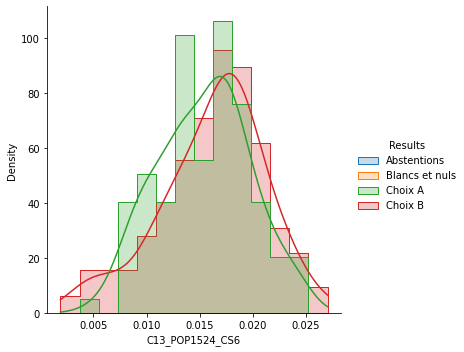

C13_POP1524_CS8


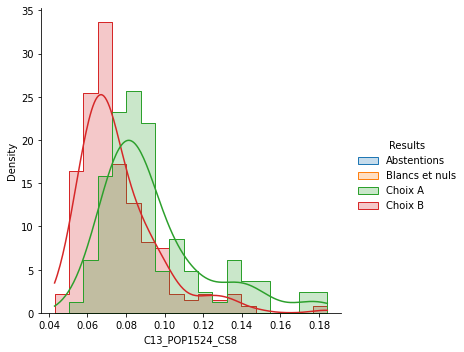

C13_POP2554


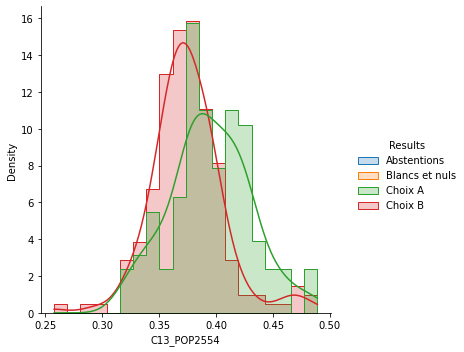

C13_POP2554_CS1


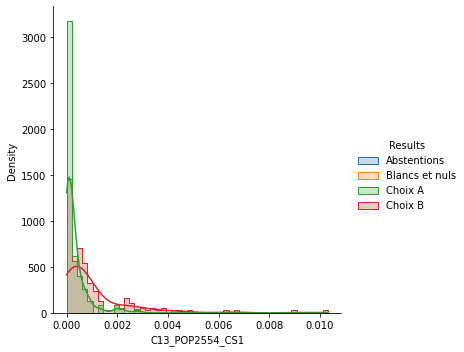

C13_POP2554_CS2


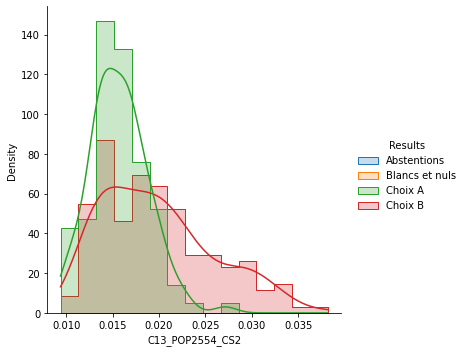

C13_POP2554_CS3


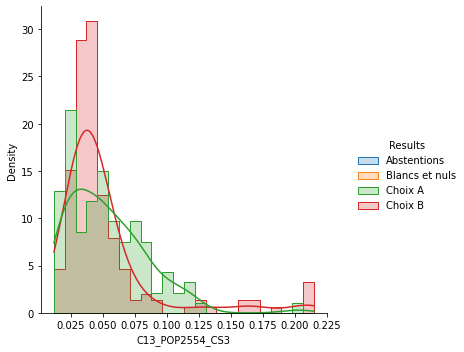

C13_POP2554_CS4


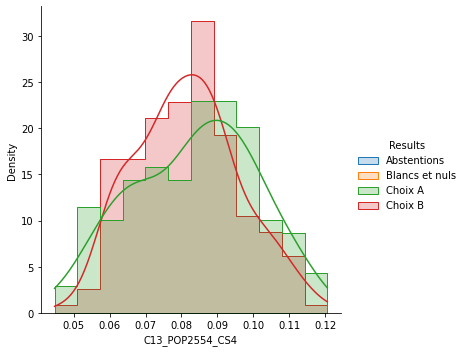

C13_POP2554_CS5


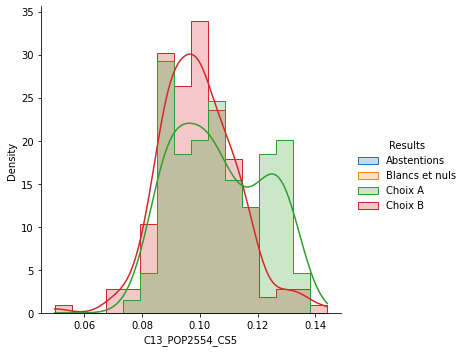

C13_POP2554_CS6


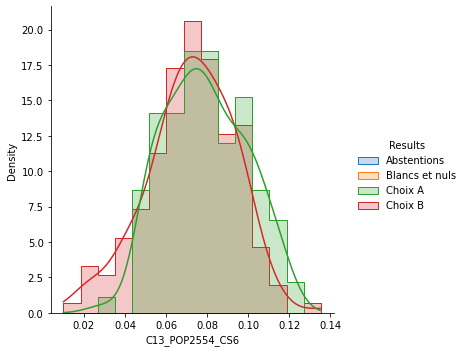

C13_POP2554_CS7


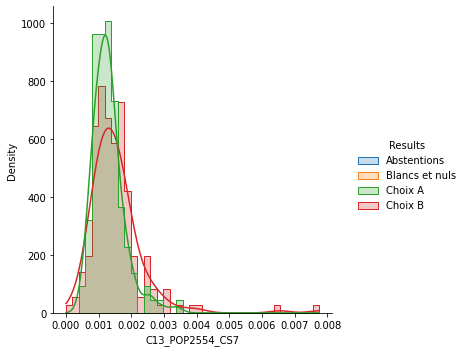

C13_POP2554_CS8


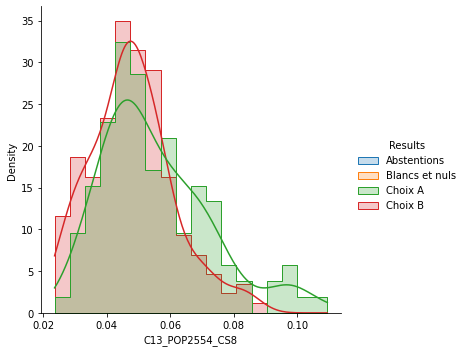

C13_POP55P


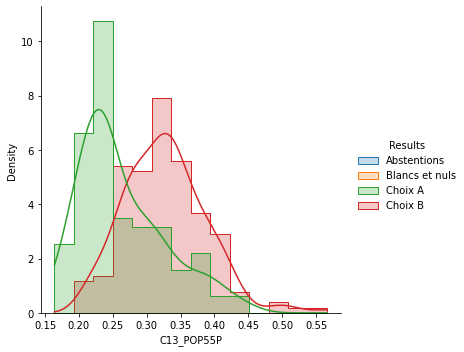

C13_POP55P_CS1


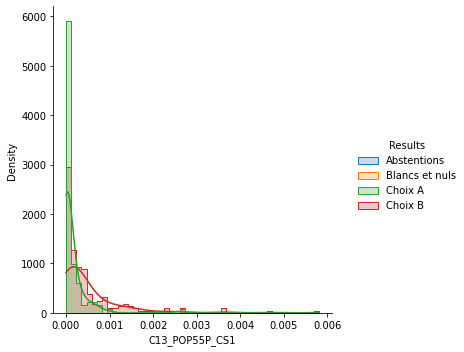

C13_POP55P_CS2


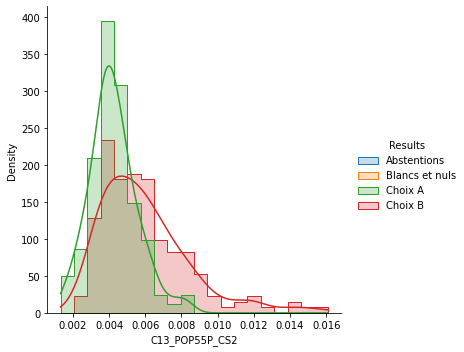

C13_POP55P_CS3


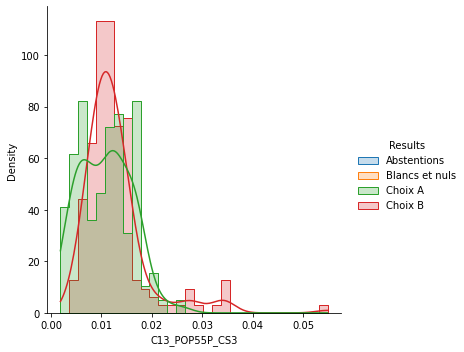

C13_POP55P_CS4


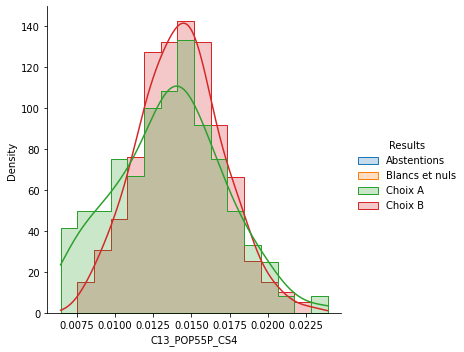

C13_POP55P_CS5


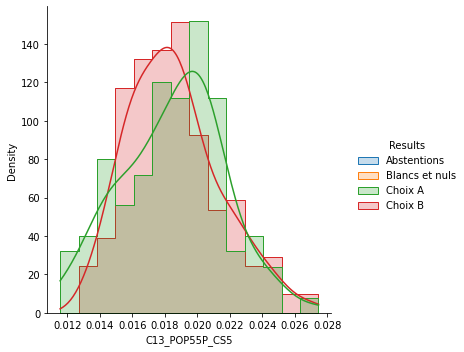

C13_POP55P_CS6


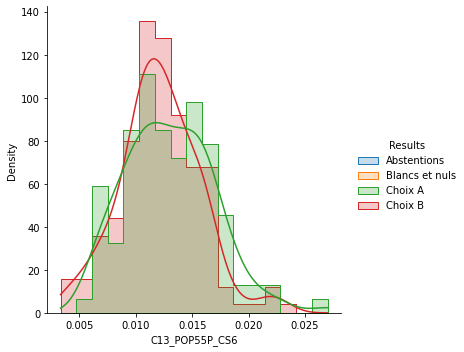

C13_POP55P_CS7


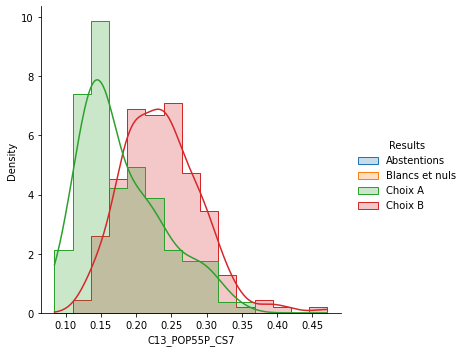

C13_POP55P_CS8


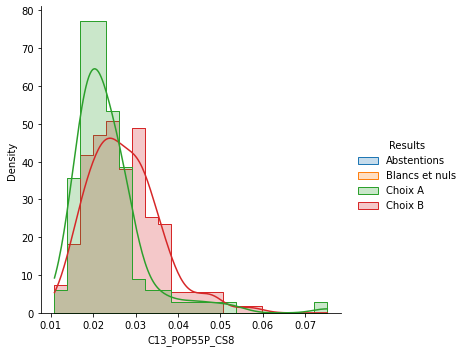

NBMENFISC13


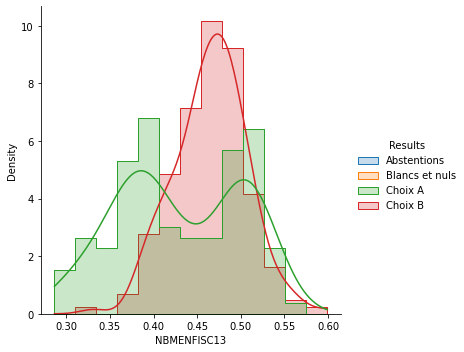

NBPERSMENFISC13


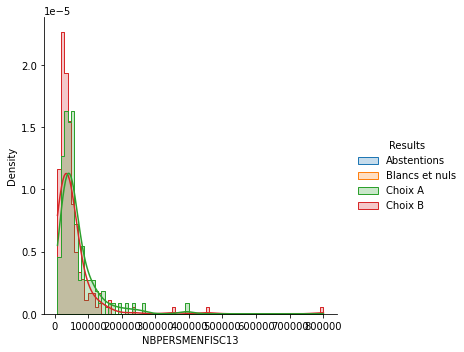

MED13


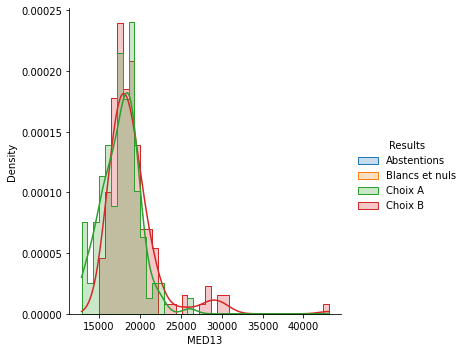

PIMP13


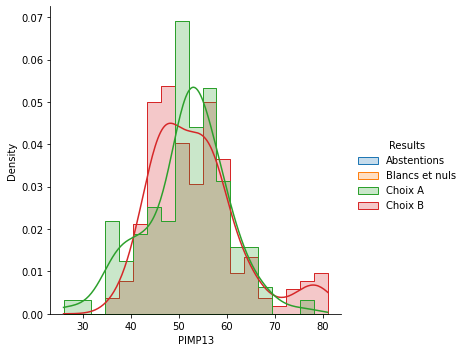

TP6013


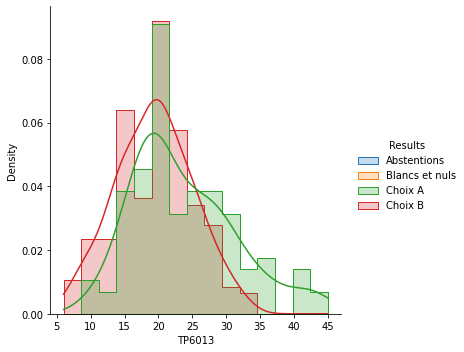

TP60AGE113


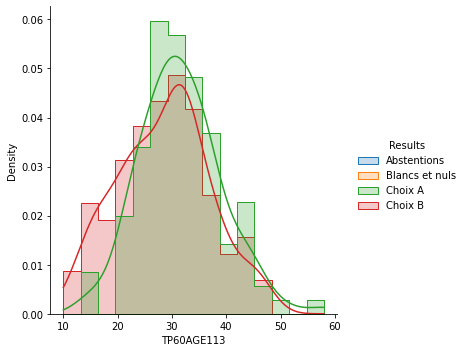

TP60AGE213


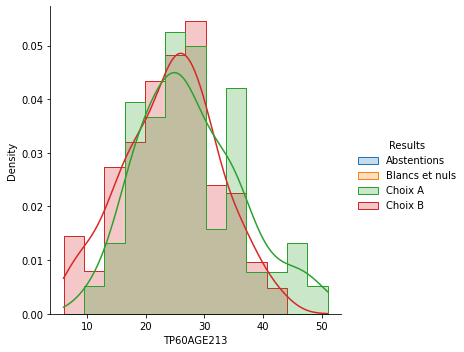

TP60AGE313


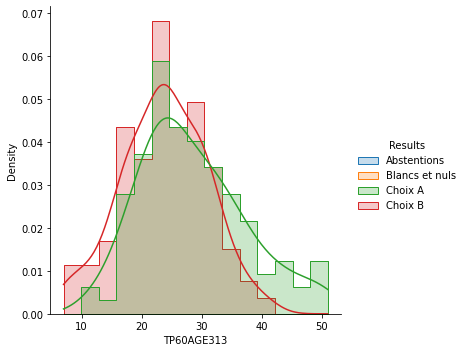

TP60AGE413


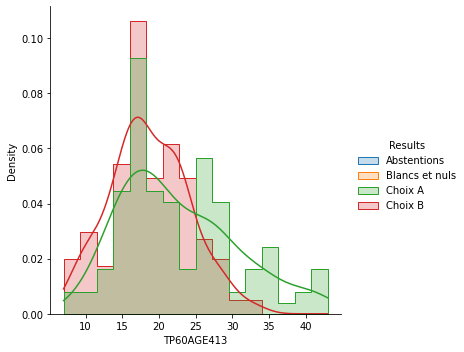

TP60AGE513


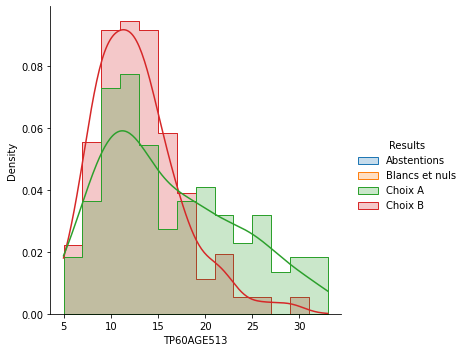

TP60AGE613


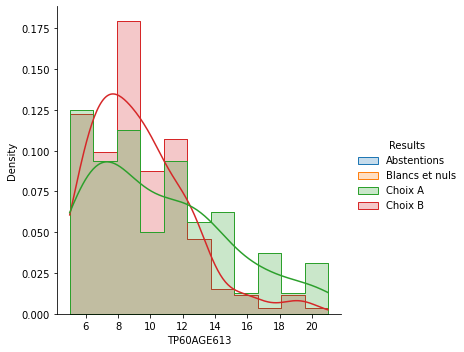

TP60TOL113


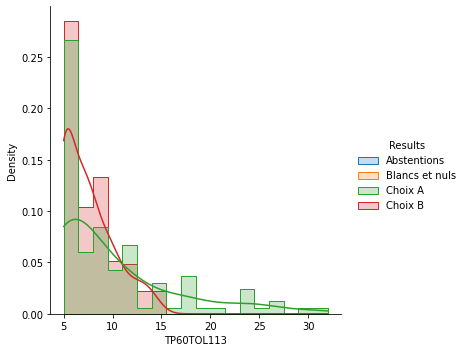

TP60TOL213


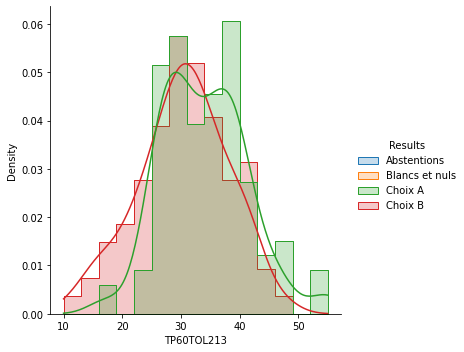

PRA13


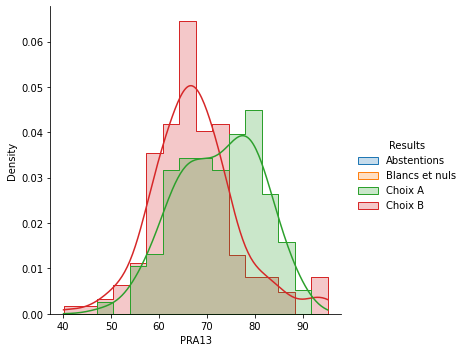

PTSAC13


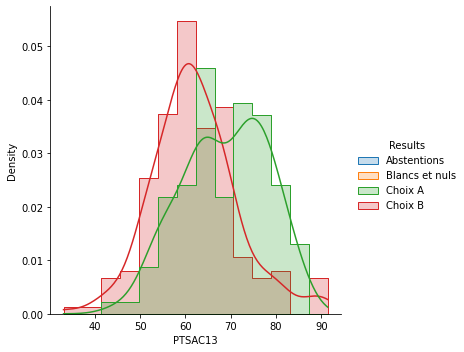

PBEN13


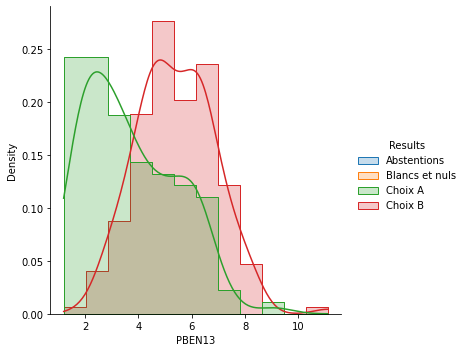

PPEN13


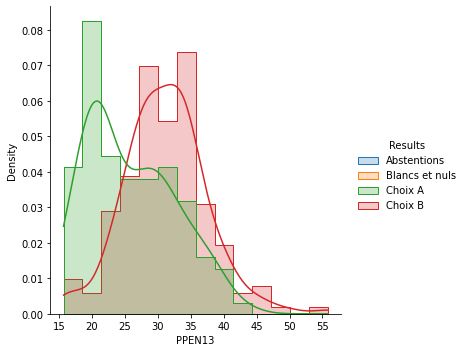

PPAT13


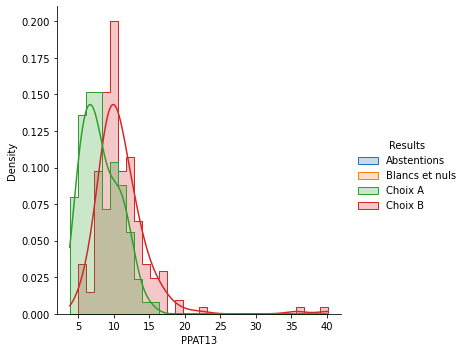

PPSOC13


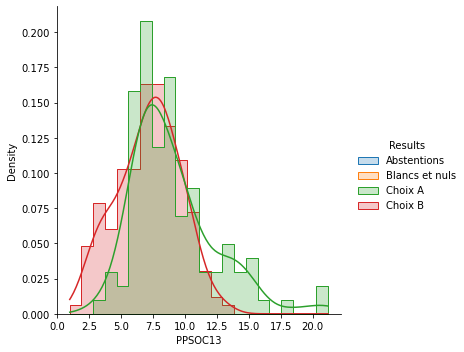

PPFAM13


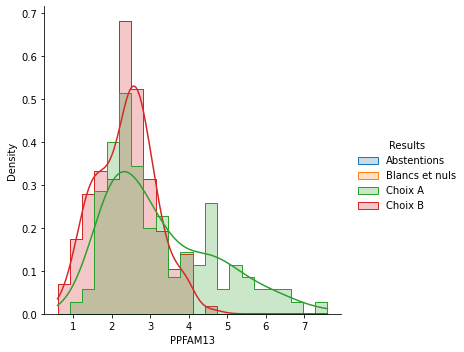

PPMINI13


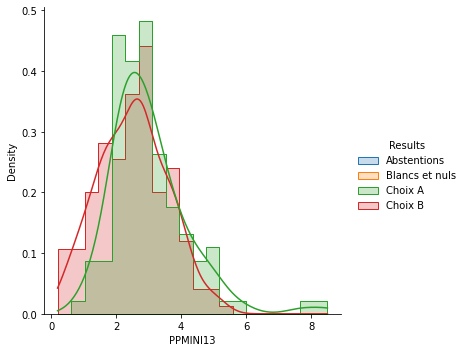

PPLOGT13


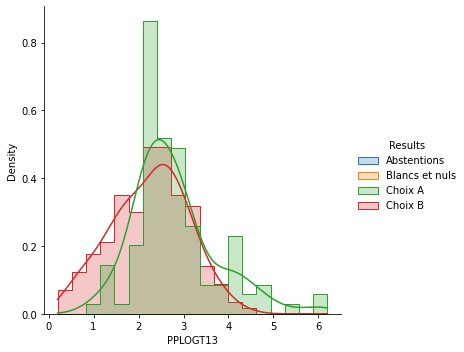

PIMPOT13


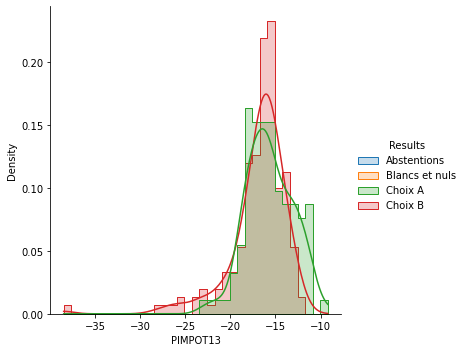

RD13


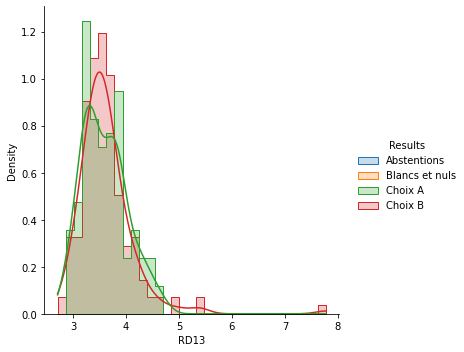

D113


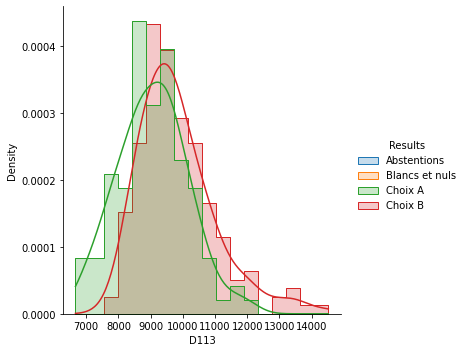

D913


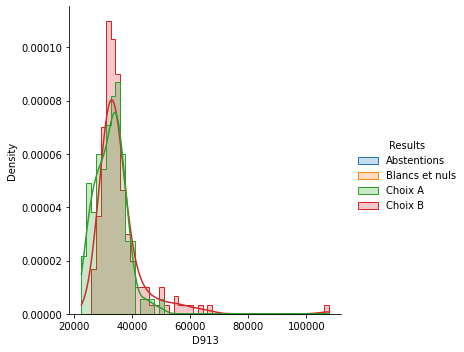

NBPERSMENFISC13_


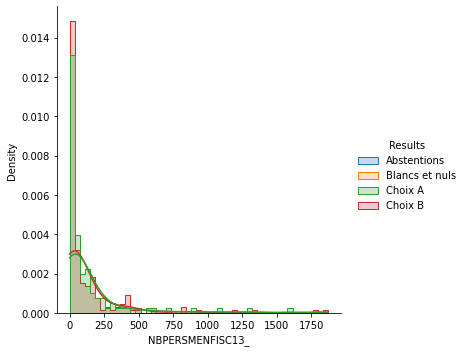

H0


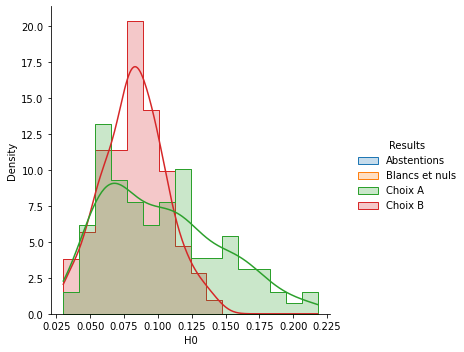

F0


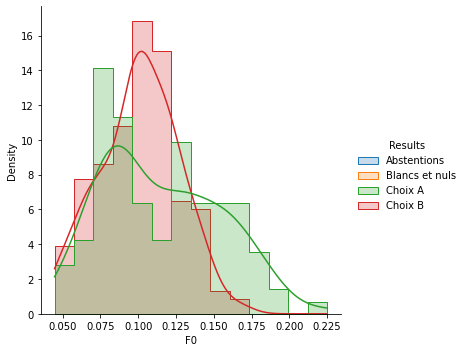

H1


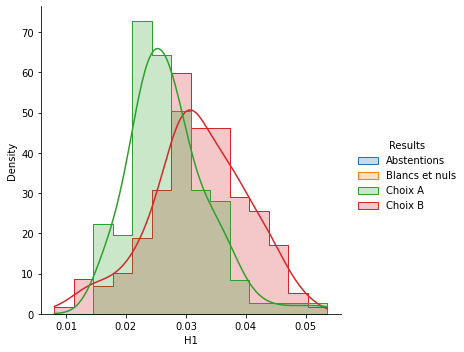

F1


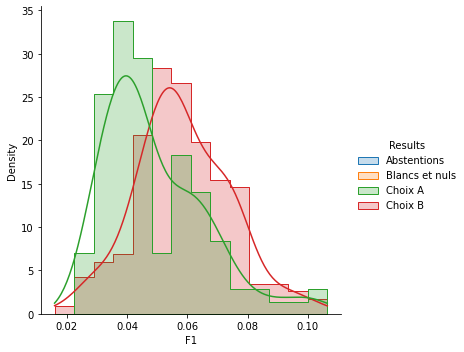

H2


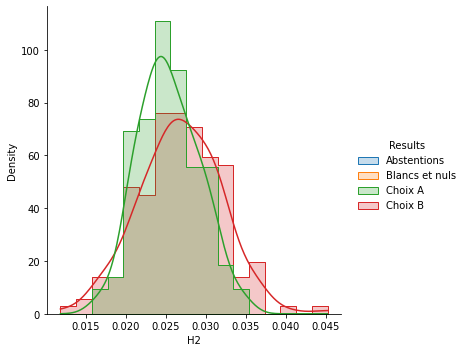

F2


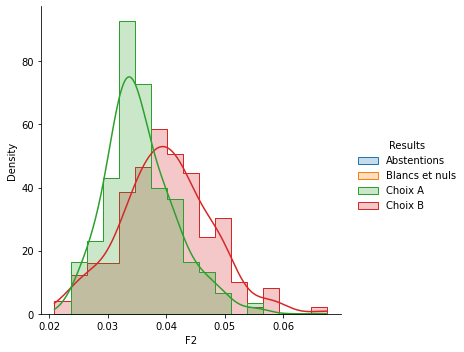

H3


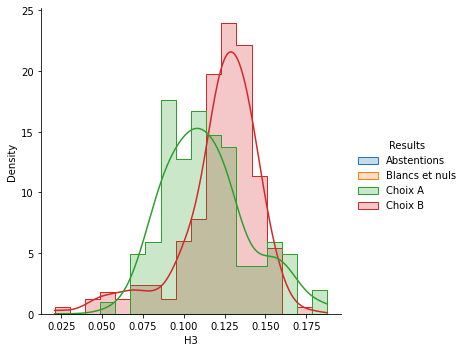

F3


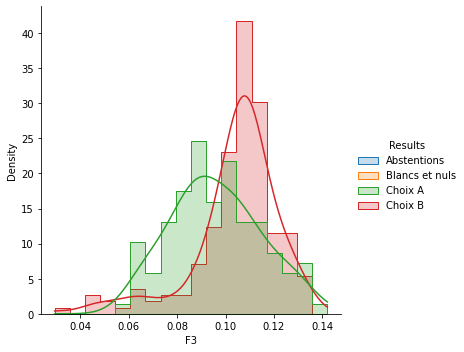

H4


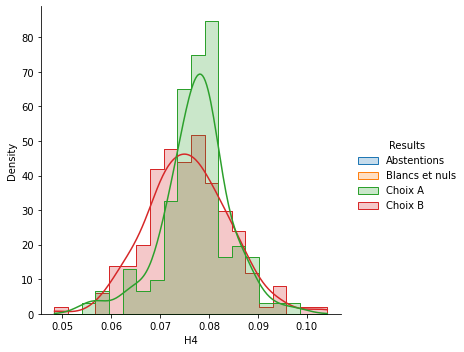

F4


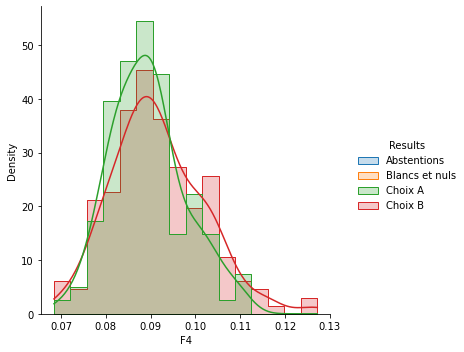

H5


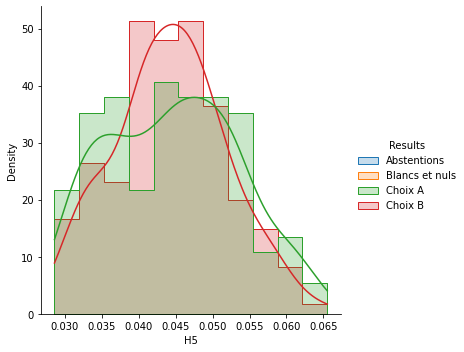

F5


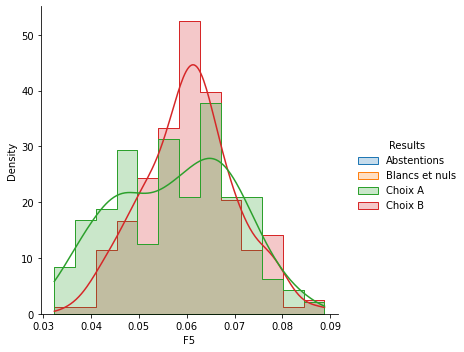

H6


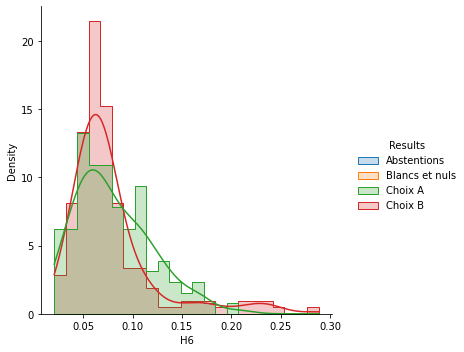

F6


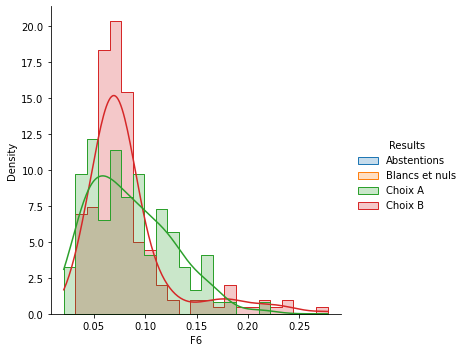

In [26]:
# plot
plt.rcParams.update({'figure.max_open_warning': 0})
for col in reduced_df.select_dtypes('float'):
    print(col)
    sns.displot(data=reduced_df[[col,'Results']], x=col, hue='Results', kde=True, element="step", stat="density", common_norm=False)
    plt.show(); plt.close()

**Observation :** Beaucoup de variables ont des distributions qui coincide (à tester plus tard). Les variables qui ont des distributions où la moyenne est décalé sont plus interessante pour l'analyse. On remarque que les distributions se séparer lorsqu'on a 

In [27]:
# 1000
separated_feature = ['Choix A','Choix B', 'P13_POP0014','P13_POP1529','P13_POP6074','P13_POP7589','P13_H1529','P13_H6074','P13_H7589','P13_H65P','P13_F6074','P13_F7589','P13_F0019','P13_F65P','C13_POP15P_CS7','C13_H15P_CS7','C13_POP55P','C13_POP55P_CS7']
# dropna
different_feature = ['PRA13','PTSAC13','PBEN13','PPEN13','PPAT13','PPFAM13','D113','H0','H1','F1', 'H2', 'F2', 'H3', 'F3']

#### (iii) Quantile proportion (specific variable)

Lorsqu'on veut quantifier la proportion d'une variable specifiant dans quel categorie appartiennent les differents echantillons, nous pouvons faire une analyse quantile

Ici, nous pouvons creer des variable entieres decrivant la categorie sociale mediane, l'age median, etc. Ou encore la categorie dominante (max)

(si plus de temps)

In [28]:
# for dominant, it's max
""" """
# listing of feature connected and ordered
""" """
# calculate cumulate sum
""" """
# calculate median/mean
""" """

' '

In [29]:
#sns.countplot(x=var, hue='Results', data=d.sample(1000, random_state=0))

### 2-c. Data reduction visualization

Decorrelation des variables tres correlée entre elles et projection dans l'espace des covariances. Voir s'il y a besoin d'extraire des caracteristiques pour creer de nouvelle variables.

In [30]:
# standardization (correlated_bloc without poverty)
x = df_explore.loc[:, correlated_block].dropna()
x = skpp.StandardScaler().fit_transform(x)
# PCA compression of continious variables (if unlinear : Manifold : IsoMap)
pca = PCA(n_components=0.8)
principalComponents = pca.fit_transform(x)
pca_df = principalComponents[:,:3]
# dataframe pca
explore_df_pca = pd.DataFrame(data = pca_df, columns = ['PC1', 'PC2', 'PC3'])
# add class
explore_df_pca['Results'] = df_explore['Results'].astype("category")

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

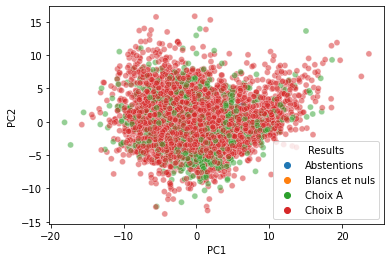

In [31]:
#ax = plt.axes(projection='3d')
# ax.scatter(explore_df_pca['PC1'], explore_df_pca['PC2'], explore_df_pca['PC3'], c= explore_df_pca['Results'].cat.codes); plt.show();plt.close()
sns.scatterplot(data=explore_df_pca,  x="PC1", y="PC2", hue='Results', alpha=0.5)

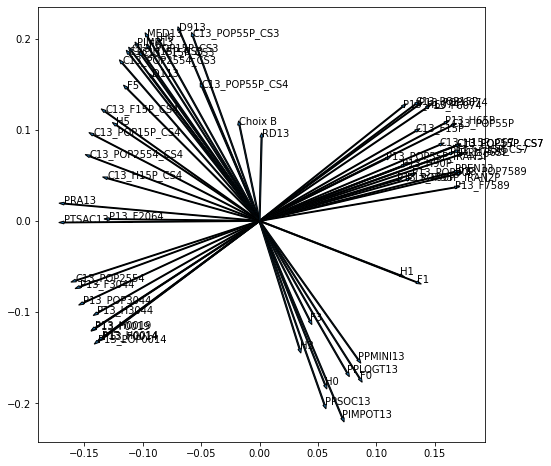

In [32]:
# components in correlation circle
components = pca.components_
# dataframe
pca_c_df = components[:3,:]
# plot pca circle correlation
(fig, ax) = plt.subplots(figsize=(8, 8))
for i in range(0, pca.components_.shape[1]):
    ax.arrow(0,0, pca.components_[0, i], pca.components_[1, i])
    plt.text(pca.components_[0, i], pca.components_[1, i],correlated_block[i])

**Observation :** Tout comme precedement, on observe un nuages de points qui se chevauche entre le choix A et le choix B. Néamoins, on observes un pattern d'ensembles de 3 groupe intercorrélé.

### 2-c. Data contingency

Relation entre la target "Result" et les variables qualitatives disponible. Ici nous en avons qu'une seule, celle qui a été construite manuellement à partir des donnée de revenu (impot privée ou public)

In [33]:
contigency = pd.crosstab(df_explore['Results'], df_explore['Confidentiality'])
print(df_explore['Confidentiality'].value_counts() , '\n')
print(df_explore['Results'].value_counts())

private    34423
public      2092
Name: Confidentiality, dtype: int64 

Choix B           30690
Choix A            5784
Abstentions          38
Blancs et nuls        3
Name: Results, dtype: int64


<AxesSubplot:xlabel='Confidentiality', ylabel='Results'>

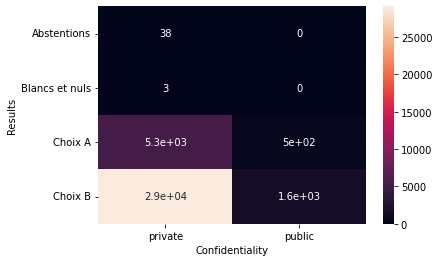

In [34]:
"""
# if normalize
contigency['private'] = contigency['private'].div(df_explore['Confidentiality'].value_counts()['private'])
contigency['public'] = contigency['public'].div(df_explore['Confidentiality'].value_counts()['public'])
"""
sns.heatmap(contigency, annot=True)

**Observation :** Les proportions de vote sont conservées dans la matrice de contingence, le faite que les données soit privé ou public n'influence pas le resultat du vote.

### 2-d. Data Test

Mesure si la moyenne entre plusieurs distributions par categorie est statistiquement significative. Dans notre cas, seule la categorie target "Results" nous interesse, et dont seulement les distributions du "Choix A", "Choix B" à prendre en compte dans notre analyse.

Hypothèse nulle à rejeter : Les taux moyens sont égales pour le choix A et le choix B.

In [35]:
# balance class
A = df_explore[df_explore.Results == 'Choix A'].sample(1000, random_state=0)
B = df_explore[df_explore.Results == 'Choix B'].sample(1000, random_state=0)

In [36]:
def t_test(df_1, df_2, col):
    alpha = 0.02
    stat, p = ttest_ind(df_1[col].dropna(), df_2[col].dropna())
    if p < alpha:
        return 'H0 Rejetée'
    else :
        return 0

In [37]:
feature_columns =  df_explore.select_dtypes('float').columns
variables = []
for col in feature_columns :
    H0 = t_test(A,B,col)
    if H0 != 0 :
        variables += [col]
    print(f'{col :-<50} {H0}')
print("\n Nombres d'hypothèses rejeté : " + str(len(variables)))

Inscrits------------------------------------------ H0 Rejetée
Abstentions--------------------------------------- 0
Blancs et nuls------------------------------------ 0
Choix A------------------------------------------- H0 Rejetée
Choix B------------------------------------------- H0 Rejetée
P13_POP------------------------------------------- H0 Rejetée
P13_POP0014--------------------------------------- H0 Rejetée
P13_POP1529--------------------------------------- H0 Rejetée
P13_POP3044--------------------------------------- H0 Rejetée
P13_POP4559--------------------------------------- 0
P13_POP6074--------------------------------------- H0 Rejetée
P13_POP7589--------------------------------------- H0 Rejetée
P13_POP90P---------------------------------------- H0 Rejetée
P13_POPH------------------------------------------ 0
P13_H0014----------------------------------------- H0 Rejetée
P13_H1529----------------------------------------- H0 Rejetée
P13_H3044-----------------------------------

**Observations :** 98 features sont statistiquements significatives pour discriminer les données.

## 3. Data preprocessing

Pour preparer les données d'entrainement, nous utilisons les colonnes qui sont statistiquements significative. Néamoins, nous allons aussi enlever les colonnes qui possedes moins de 15% d'informations (à revoir si necessaire à l'analyse)

In [38]:
df_preprocess = complete_data.copy()
features = variables.copy()
for e in ['Abstentions','Blancs et nuls','Choix A','Choix B'] : 
    if e in features : features.remove(e)
# only columns with no relation, completly empty or no variance (constance)
df_preprocess = df_preprocess[['CODGEO','Results']+features]
select_columns = df_preprocess.columns[df_preprocess.isna().sum()/df_preprocess.shape[0] < 0.85]
df_preprocess = df_preprocess[select_columns]
# delete aberrant values (is necessary)
#df_preprocess = df_preprocess[(df_preprocess.isin([0]).sum(axis=1)) > 1] #delete also 1 (to optimize)
df_preprocess = df_preprocess[(df_preprocess['Results'] == 'Choix A') | (df_preprocess['Results'] == 'Choix B')]
# show new properties
print(df_preprocess.shape)
print(df_preprocess['Results'].value_counts())
df_preprocess.head()

(36474, 86)
Choix B           30690
Choix A            5784
Blancs et nuls        0
Abstentions           0
Name: Results, dtype: int64


,CODGEO,Results,Inscrits,P13_POP,P13_POP0014,P13_POP1529,P13_POP3044,P13_POP6074,P13_POP7589,P13_POP90P,P13_H0014,P13_H1529,P13_H3044,P13_H6074,P13_H7589,P13_H90P,P13_H0019,P13_H2064,P13_H65P,P13_F0014,P13_F1529,P13_F3044,P13_F4559,P13_F6074,P13_F7589,P13_F90P,P13_F0019,P13_F2064,P13_F65P,P13_POP01P,P13_POP01P_IRAN1,P13_POP01P_IRAN2,P13_POP01P_IRAN5,P13_POP01P_IRAN7,P13_POP0114_IRAN2,P13_POP2554_IRAN2P,P13_POP2554_IRAN2,P13_POP2554_IRAN3P,P13_POP55P_IRAN2P,P13_POP55P_IRAN2,P13_POP55P_IRAN3P,C13_POP15P,C13_POP15P_CS1,C13_POP15P_CS2,C13_POP15P_CS5,C13_POP15P_CS6,C13_POP15P_CS7,C13_POP15P_CS8,C13_H15P,C13_H15P_CS2,C13_H15P_CS4,C13_H15P_CS6,C13_H15P_CS7,C13_F15P,C13_F15P_CS1,C13_F15P_CS3,C13_F15P_CS5,C13_F15P_CS6,C13_F15P_CS7,C13_POP1524,C13_POP1524_CS4,C13_POP1524_CS5,C13_POP1524_CS6,C13_POP2554,C13_POP2554_CS1,C13_POP2554_CS4,C13_POP2554_CS5,C13_POP2554_CS6,C13_POP55P,C13_POP55P_CS2,C13_POP55P_CS4,C13_POP55P_CS6,C13_POP55P_CS7,C13_POP55P_CS8,NBMENFISC13,NBPERSMENFISC13,MED13,H0,F0,H2,F2,H3,F3,F4,H6,F6
0,01001,Choix B,592.0,767.0,0.229487,0.124359,0.212821,0.164103,0.070513,0.003846,0.119231,0.067949,0.110256,0.084615,0.029487,0.000000,0.147436,0.284615,0.075641,0.110256,0.056410,0.102564,0.098718,0.079487,0.041026,0.003846,0.137179,0.267949,0.087179,0.989744,0.926923,0.008974,0.001282,0.001282,0.003846,0.030769,0.002564,0.028205,0.006410,0.000000,0.006410,0.794872,0.020513,0.005128,0.148718,0.092308,0.215385,0.097436,0.405128,0.005128,0.035897,0.082051,0.117949,0.389744,0.010256,0.020513,0.123077,0.010256,0.097436,0.117949,0.005128,0.015385,0.010256,0.389744,0.020513,0.102564,0.107692,0.066667,0.287179,0.000000,0.005128,0.015385,0.210256,0.010256,0.386719,768.0,22130.000000,0.058567,0.070804,0.041496,0.034509,0.141622,0.109485,0.085834,0.060978,0.035163
1,01002,Choix B,215.0,236.0,0.188034,0.149573,0.256410,0.153846,0.081197,0.008547,0.106838,0.072650,0.145299,0.094017,0.038462,0.004274,0.119658,0.311966,0.098291,0.081197,0.076923,0.111111,0.094017,0.059829,0.042735,0.004274,0.102564,0.290598,0.076923,1.000000,0.863248,0.042735,0.008547,0.000000,0.012821,0.081197,0.029915,0.051282,0.008547,0.000000,0.008547,0.803419,0.000000,0.017094,0.034188,0.136752,0.273504,0.034188,0.427350,0.017094,0.119658,0.136752,0.119658,0.376068,0.000000,0.051282,0.034188,0.000000,0.153846,0.051282,0.000000,0.034188,0.017094,0.444444,0.000000,0.222222,0.000000,0.085470,0.307692,0.000000,0.000000,0.034188,0.273504,0.000000,0.414226,239.0,23213.000000,0.023124,0.026920,0.026920,0.000000,0.149956,0.088526,0.134599,0.053839,0.084555
2,01004,Choix B,8205.0,14359.0,0.212365,0.199021,0.192985,0.124980,0.075534,0.009839,0.100600,0.098040,0.098492,0.059842,0.025695,0.004352,0.129945,0.283951,0.064950,0.111765,0.100981,0.094493,0.093451,0.065138,0.049839,0.005487,0.142325,0.284341,0.094488,0.982250,0.829467,0.047858,0.015893,0.003976,0.009002,0.070391,0.023141,0.047250,0.012372,0.003941,0.008430,0.786380,0.000000,0.023624,0.135813,0.136387,0.202154,0.116870,0.377250,0.015162,0.064328,0.105155,0.088409,0.409131,0.000000,0.019281,0.098786,0.031231,0.113745,0.122503,0.010971,0.025919,0.024002,0.394574,0.000000,0.098073,0.095055,0.098651,0.269303,0.003685,0.012789,0.013734,0.200209,0.017949,0.443709,13599.0,19554.000000,0.074991,0.092806,0.027956,0.036561,0.148460,0.122236,0.090203,0.048760,0.062697
3,01005,Choix B,1152.0,1635.0,0.206300,0.154416,0.198271,0.142681,0.061149,0.006177,0.105621,0.081532,0.089561,0.074120,0.029648,0.001853,0.137739,0.290920,0.075355,0.100679,0.072884,0.108709,0.109327,0.068561,0.031501,0.004324,0.127857,0.290920,0.077208,0.990117,0.920321,0.024707,0.003706,0.000000,0.008647,0.035825,0.010500,0.025324,0.006177,0.003088,0.003088,0.821495,0.003088,0.037060,0.148240,0.142063,0.191476,0.092650,0.416924,0.030883,0.067943,0.117356,0.098826,0.404571,0.000000,0.021618,0.132798,0.024707,0.092650,0.132798,0.015442,0.021618,0.033972,0.413836,0.003088,0.114268,0.111180,0.089561,0.274861,0.003088,0.012353,0.018530,0.191476,0.018530,0.364442,1693.0,223

### 3-a. Dataset training-test construction

Construct dataset reparti equitablement

In [39]:
df_preprocess_A = df_preprocess[df_preprocess.Results == 'Choix A']
df_preprocess_B = df_preprocess[df_preprocess.Results == 'Choix B'].sample(df_preprocess_A.shape[0], random_state=0)
dataset = pd.concat([df_preprocess_A,df_preprocess_B])

In [40]:
trainset, testset = skms.train_test_split(dataset.drop('CODGEO', axis=1), test_size=0.2, random_state=0)
# proportion of class repartition (try to distribute with the same proportion : after)
display(trainset['Results'].value_counts(), testset['Results'].value_counts())

Choix A           4634
Choix B           4620
Blancs et nuls       0
Abstentions          0
Name: Results, dtype: int64

Choix B           1164
Choix A           1150
Blancs et nuls       0
Abstentions          0
Name: Results, dtype: int64

### 3-b. Data Encoding

In [41]:
def encoding(df, target_name) : 
    # convert string to values
    code = {'Choix A':0,'Choix B':1}
    df.loc[:,target_name] = df[target_name].map(code)

In [42]:
encoding(trainset, 'Results')
encoding(testset, 'Results')
trainset.head()

,Results,Inscrits,P13_POP,P13_POP0014,P13_POP1529,P13_POP3044,P13_POP6074,P13_POP7589,P13_POP90P,P13_H0014,P13_H1529,P13_H3044,P13_H6074,P13_H7589,P13_H90P,P13_H0019,P13_H2064,P13_H65P,P13_F0014,P13_F1529,P13_F3044,P13_F4559,P13_F6074,P13_F7589,P13_F90P,P13_F0019,P13_F2064,P13_F65P,P13_POP01P,P13_POP01P_IRAN1,P13_POP01P_IRAN2,P13_POP01P_IRAN5,P13_POP01P_IRAN7,P13_POP0114_IRAN2,P13_POP2554_IRAN2P,P13_POP2554_IRAN2,P13_POP2554_IRAN3P,P13_POP55P_IRAN2P,P13_POP55P_IRAN2,P13_POP55P_IRAN3P,C13_POP15P,C13_POP15P_CS1,C13_POP15P_CS2,C13_POP15P_CS5,C13_POP15P_CS6,C13_POP15P_CS7,C13_POP15P_CS8,C13_H15P,C13_H15P_CS2,C13_H15P_CS4,C13_H15P_CS6,C13_H15P_CS7,C13_F15P,C13_F15P_CS1,C13_F15P_CS3,C13_F15P_CS5,C13_F15P_CS6,C13_F15P_CS7,C13_POP1524,C13_POP1524_CS4,C13_POP1524_CS5,C13_POP1524_CS6,C13_POP2554,C13_POP2554_CS1,C13_POP2554_CS4,C13_POP2554_CS5,C13_POP2554_CS6,C13_POP55P,C13_POP55P_CS2,C13_POP55P_CS4,C13_POP55P_CS6,C13_POP55P_CS7,C13_POP55P_CS8,NBMENFISC13,NBPERSMENFISC13,MED13,H0,F0,H2,F2,H3,F3,F4,H6,F6
33305,0.0,267.0,300.0,0.149502,0.149502,0.162791,0.142857,0.069767,0.003322,0.069767,0.079734,0.073090,0.076412,0.026578,0.000000,0.112957,0.328904,0.049834,0.079734,0.069767,0.089701,0.156146,0.066445,0.043189,0.003322,0.122924,0.308970,0.076412,0.990033,0.960133,0.003322,0.000000,0.000000,0.000000,0.013289,0.000000,0.013289,0.000000,0.000000,0.000000,0.877076,0.000000,0.039867,0.132890,0.172757,0.225914,0.119601,0.451827,0.026578,0.053156,0.106312,0.119601,0.425249,0.0,0.039867,0.079734,0.066445,0.106312,0.159468,0.000000,0.026578,0.039867,0.398671,0.000000,0.079734,0.079734,0.119601,0.318937,0.000000,0.013289,0.013289,0.225914,0.013289,0.366071,336.0,21213.095238,0.107262,0.095492,0.038048,0.027416,0.136868,0.120507,0.072033,0.040555,0.043882
24168,1.0,1105.0,1394.0,0.180057,0.138451,0.177905,0.182209,0.102582,0.005739,0.099713,0.070301,0.086083,0.084648,0.040890,0.001435,0.128407,0.269010,0.091105,0.080344,0.068149,0.091822,0.107604,0.097561,0.061693,0.004304,0.104017,0.285509,0.121951,0.985653,0.945481,0.002869,0.002152,0.000000,0.000000,0.018651,0.002152,0.016499,0.004304,0.000717,0.003587,0.832138,0.000000,0.022956,0.114778,0.120516,0.232425,0.134864,0.387374,0.020086,0.063128,0.103300,0.103300,0.444763,0.0,0.020086,0.086083,0.017217,0.129125,0.103300,0.002869,0.022956,0.020086,0.364419,0.000000,0.126255,0.060258,0.088953,0.364419,0.014347,0.020086,0.011478,0.232425,0.043042,0.422316,1416.0,23028.000000,0.074554,0.074107,0.017411,0.026339,0.186161,0.155357,0.063839,0.047321,0.056696
9046,1.0,685.0,900.0,0.156216,0.156809,0.157262,0.180967,0.068181,0.004702,0.076345,0.080659,0.072818,0.088165,0.032915,0.002351,0.109130,0.310869,0.071707,0.079871,0.076151,0.084444,0.137408,0.092802,0.035266,0.002351,0.105733,0.320273,0.082287,0.983543,0.849910,0.033842,0.009404,0.000000,0.006924,0.063683,0.016792,0.046892,0.015217,0.002286,0.012931,0.830723,0.014106,0.051465,0.141064,0.089340,0.281869,0.093007,0.389500,0.037358,0.065830,0.061128,0.136362,0.441223,0.0,0.000000,0.112851,0.028213,0.145507,0.102670,0.009404,0.014106,0.028213,0.347440,0.009404,0.112851,0.103447,0.047021,0.380614,0.018809,0.018809,0.014106,0.281869,0.009404,0.396195,893.5,19610.666667,0.059636,0.061056,0.058772,0.054745,0.150556,0.150397,0.123055,0.038638,0.036480
28194,1.0,206.0,278.0,0.224638,0.137681,0.235507,0.094203,0.068841,0.000000,0.097826,0.057971,0.108696,0.057971,0.025362,0.000000,0.115942,0.307971,0.054348,0.126812,0.079710,0.126812,0.108696,0.036232,0.043478,0.000000,0.159420,0.300725,0.061594,0.989130,0.952899,0.003623,0.000000,0.000000,0.000000,0.018116,0.000000,0.018116,0.003623,0.003623,0.000000,0.695652,0.000000,0.000000,0.072464,0.260870,0.115942,0.101449,0.333333,0.000000,0.014493,0.188406,0.057971,0.362319,0.0,0.000000,0.057971,0.072464,0.057971,0.072464,0.014493,0.000000,0.028986,0.420290,0.000000,0.101449,0.072464,0.188406,0.202899,0.000000,0.014493,0.043478,0.115942,0.028986,0.371212,264.0,33046.250000,0.119220,0.109541,0.012228,0.021908,0.150680,0.

--- 
*Return here after basic test modelization (Trial and error method)*

### 3-c. Data Transform


In [43]:
def preprocessing(df, target_name):
    ### feature engineering (if underfitting)
    #df['new'] = df[] #
    ### feature imputation (if overfitting)
    df = df.dropna()
    #df = df.fillna(0)
    # input / target
    X = df.drop(target_name, axis=1)
    y = df[target_name]
    # show param
    print(y.value_counts())
    return X,y

## 4. Data modelization

Trouver un modele ayant une précision superieur à 90%. Tester du plus simple au plus complexe et revenir au pré-traitement si necessaire.

In [44]:
X_train, y_train = preprocessing(trainset, 'Results')
X_test, y_test = preprocessing(testset, 'Results')
# show
X_train.head()

1.0    4033
0.0    3851
Name: Results, dtype: int64
1.0    1000
0.0     938
Name: Results, dtype: int64


,Inscrits,P13_POP,P13_POP0014,P13_POP1529,P13_POP3044,P13_POP6074,P13_POP7589,P13_POP90P,P13_H0014,P13_H1529,P13_H3044,P13_H6074,P13_H7589,P13_H90P,P13_H0019,P13_H2064,P13_H65P,P13_F0014,P13_F1529,P13_F3044,P13_F4559,P13_F6074,P13_F7589,P13_F90P,P13_F0019,P13_F2064,P13_F65P,P13_POP01P,P13_POP01P_IRAN1,P13_POP01P_IRAN2,P13_POP01P_IRAN5,P13_POP01P_IRAN7,P13_POP0114_IRAN2,P13_POP2554_IRAN2P,P13_POP2554_IRAN2,P13_POP2554_IRAN3P,P13_POP55P_IRAN2P,P13_POP55P_IRAN2,P13_POP55P_IRAN3P,C13_POP15P,C13_POP15P_CS1,C13_POP15P_CS2,C13_POP15P_CS5,C13_POP15P_CS6,C13_POP15P_CS7,C13_POP15P_CS8,C13_H15P,C13_H15P_CS2,C13_H15P_CS4,C13_H15P_CS6,C13_H15P_CS7,C13_F15P,C13_F15P_CS1,C13_F15P_CS3,C13_F15P_CS5,C13_F15P_CS6,C13_F15P_CS7,C13_POP1524,C13_POP1524_CS4,C13_POP1524_CS5,C13_POP1524_CS6,C13_POP2554,C13_POP2554_CS1,C13_POP2554_CS4,C13_POP2554_CS5,C13_POP2554_CS6,C13_POP55P,C13_POP55P_CS2,C13_POP55P_CS4,C13_POP55P_CS6,C13_POP55P_CS7,C13_POP55P_CS8,NBMENFISC13,NBPERSMENFISC13,MED13,H0,F0,H2,F2,H3,F3,F4,H6,F6
33305,267.0,300.0,0.149502,0.149502,0.162791,0.142857,0.069767,0.003322,0.069767,0.079734,0.073090,0.076412,0.026578,0.000000,0.112957,0.328904,0.049834,0.079734,0.069767,0.089701,0.156146,0.066445,0.043189,0.003322,0.122924,0.308970,0.076412,0.990033,0.960133,0.003322,0.000000,0.000000,0.000000,0.013289,0.000000,0.013289,0.000000,0.000000,0.000000,0.877076,0.000000,0.039867,0.132890,0.172757,0.225914,0.119601,0.451827,0.026578,0.053156,0.106312,0.119601,0.425249,0.0,0.039867,0.079734,0.066445,0.106312,0.159468,0.000000,0.026578,0.039867,0.398671,0.000000,0.079734,0.079734,0.119601,0.318937,0.000000,0.013289,0.013289,0.225914,0.013289,0.366071,336.0,21213.095238,0.107262,0.095492,0.038048,0.027416,0.136868,0.120507,0.072033,0.040555,0.043882
24168,1105.0,1394.0,0.180057,0.138451,0.177905,0.182209,0.102582,0.005739,0.099713,0.070301,0.086083,0.084648,0.040890,0.001435,0.128407,0.269010,0.091105,0.080344,0.068149,0.091822,0.107604,0.097561,0.061693,0.004304,0.104017,0.285509,0.121951,0.985653,0.945481,0.002869,0.002152,0.000000,0.000000,0.018651,0.002152,0.016499,0.004304,0.000717,0.003587,0.832138,0.000000,0.022956,0.114778,0.120516,0.232425,0.134864,0.387374,0.020086,0.063128,0.103300,0.103300,0.444763,0.0,0.020086,0.086083,0.017217,0.129125,0.103300,0.002869,0.022956,0.020086,0.364419,0.000000,0.126255,0.060258,0.088953,0.364419,0.014347,0.020086,0.011478,0.232425,0.043042,0.422316,1416.0,23028.000000,0.074554,0.074107,0.017411,0.026339,0.186161,0.155357,0.063839,0.047321,0.056696
9046,685.0,900.0,0.156216,0.156809,0.157262,0.180967,0.068181,0.004702,0.076345,0.080659,0.072818,0.088165,0.032915,0.002351,0.109130,0.310869,0.071707,0.079871,0.076151,0.084444,0.137408,0.092802,0.035266,0.002351,0.105733,0.320273,0.082287,0.983543,0.849910,0.033842,0.009404,0.000000,0.006924,0.063683,0.016792,0.046892,0.015217,0.002286,0.012931,0.830723,0.014106,0.051465,0.141064,0.089340,0.281869,0.093007,0.389500,0.037358,0.065830,0.061128,0.136362,0.441223,0.0,0.000000,0.112851,0.028213,0.145507,0.102670,0.009404,0.014106,0.028213,0.347440,0.009404,0.112851,0.103447,0.047021,0.380614,0.018809,0.018809,0.014106,0.281869,0.009404,0.396195,893.5,19610.666667,0.059636,0.061056,0.058772,0.054745,0.150556,0.150397,0.123055,0.038638,0.036480
28194,206.0,278.0,0.224638,0.137681,0.235507,0.094203,0.068841,0.000000,0.097826,0.057971,0.108696,0.057971,0.025362,0.000000,0.115942,0.307971,0.054348,0.126812,0.079710,0.126812,0.108696,0.036232,0.043478,0.000000,0.159420,0.300725,0.061594,0.989130,0.952899,0.003623,0.000000,0.000000,0.000000,0.018116,0.000000,0.018116,0.003623,0.003623,0.000000,0.695652,0.000000,0.000000,0.072464,0.260870,0.115942,0.101449,0.333333,0.000000,0.014493,0.188406,0.057971,0.362319,0.0,0.000000,0.057971,0.072464,0.057971,0.072464,0.014493,0.000000,0.028986,0.420290,0.000000,0.101449,0.072464,0.188406,0.202899,0.000000,0.014493,0.043478,0.115942,0.028986,0.371212,264.0,33046.250000,0.119220,0.109541,0.012228,0.021908,0.150680,0.094764,0.083049,0.068273

### 4-a. Basic model testing

In [163]:
def evaluation(model, lc = True) :
    # fit
    model.fit(X_train, y_train)
    print(f'{"Fit" :-<50} {"done"}')
    # first evaluation
    score = model.score(X_train, y_train)
    # predict
    ypred = model.predict(X_test)
    # evaluation
    confusion = skm.confusion_matrix(y_test, ypred)
    report = skm.classification_report(y_test, ypred)
    # learning and validation curve
    if lc == True :
        # show 
        print(confusion)
        print(report)
        # (with cross validation : StratifiedKfold per default) + find minimum dataset size
        N, train_score, val_score = skms.learning_curve(model, X_train, y_train, cv=4, scoring='f1',train_sizes=np.linspace(0.1, 1, 10))
        # learning curve F1 = precision/recall (see overfit, underfit)
        plt.figure(figsize=(12, 8))
        plt.plot(N, train_score.mean(axis=1), label='train score')
        plt.plot(N, val_score.mean(axis=1), label='validation score')
        plt.legend(); plt.show(); plt.close()
    else :
        return score, confusion

Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit----------------------------------------------- done
Fit---------------------------------------------

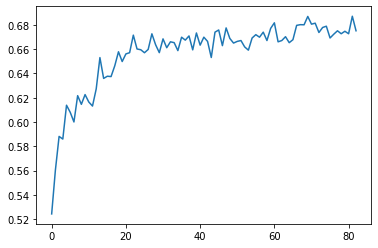

82
Fit----------------------------------------------- done
[[664 274]
 [331 669]]
              precision    recall  f1-score   support

         0.0       0.67      0.71      0.69       938
         1.0       0.71      0.67      0.69      1000

    accuracy                           0.69      1938
   macro avg       0.69      0.69      0.69      1938
weighted avg       0.69      0.69      0.69      1938



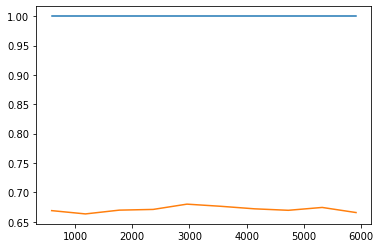

In [122]:
#### Basics test (see interesting feature)
"""
#test_model = DecisionTreeClassifier(random_state=0) # first
#test_model = RandomForestClassifier(random_state=0) # regularized model (basic ensemble)
"""

### Custum test with Transformer (pipeline)
"""
f1 = [] # optimize by dichotomy method
for i in range(X_train.columns.size-1) :
    ## feature selection KBest (test d'analyse de variance ANOVA)
    #test_model = make_pipeline(skfs.SelectKBest(skfs.f_classif, k=i+1), RandomForestClassifier(random_state=0))
    test_model = make_pipeline(skpp.PolynomialFeatures(2,  include_bias=False), skfs.SelectKBest(skfs.f_classif, k=i+1), RandomForestClassifier(random_state=0))
    # evaluation
    s,c = evaluation(test_model, lc = False)
    # f1 score list
    p = c[0,0]/(c[0,0]+c[1,0])
    r = c[0,0]/(c[0,0]+c[0,1])
    f1 += [2*(p*r)/(p+r)]
# choosen nk = 20
plt.plot(f1);plt.show();plt.close()
nk = np.argmax(f1)+1
print(nk)
"""
nk = 20
#test_model = make_pipeline(skfs.SelectKBest(skfs.f_classif, k=nk), RandomForestClassifier(random_state=0))
test_model = make_pipeline(skpp.PolynomialFeatures(2, include_bias=False), skfs.SelectKBest(skfs.f_classif, k=nk), RandomForestClassifier(random_state=0))

## final evaluation
evaluation(test_model)

**Observations steps :**
- 1. DecisionTreeClassifier : Overfitting (train = 100%), precision 60%. Try ensemble
- 2. RandomForestClassifier : Toujours overfitting, mais on a un precision et f1 à 70%. Try Feature selection
- 3. Pipeline(ANOVA+RandomForest) : reduction à 65 features, essayer l'amplification polynomiale des features
- 4. Polynomial feature : 20 features sembles suffisante, mais efficace à 68%

**Visualization of feature importance (if manual selection)**

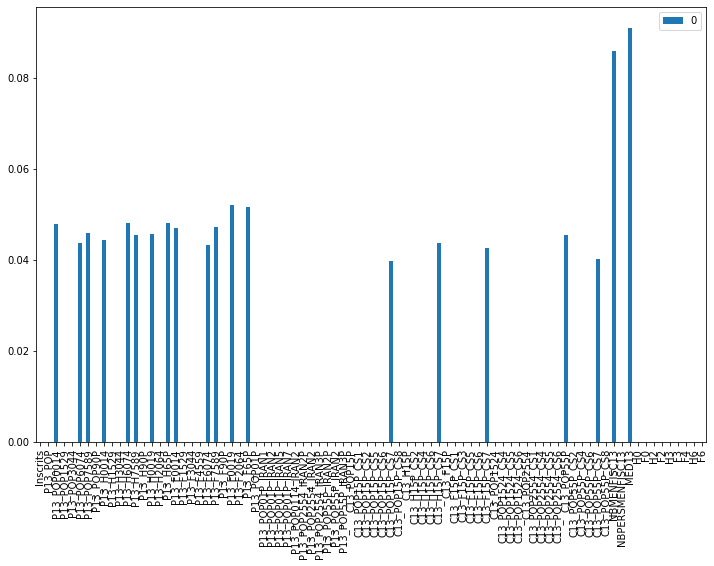

In [151]:
if isinstance(test_model, sk.pipeline.Pipeline) :
    mask = test_model.named_steps['selectkbest'].get_support()
    feature_weight = np.zeros(len(mask))
    feature_weight[mask] = test_model.named_steps['randomforestclassifier'].feature_importances_
    pd.DataFrame(feature_weight, index=X_train.columns).plot.bar(figsize=(12, 8))
else :
    pd.DataFrame(test_model.feature_importances_, index=X_train.columns).plot.bar(figsize=(12, 8))

**Observations :** Dans le cas de 20 features, aucune informations lié au niveau d'etudes n'a été conservé.

*funfact :* Le modele le plus simple (DecisionTreeClassifier) avait une precision de 100% et un f1_score à 99%, mais j'avais laissé les features "Choix A" et "Choix B"...

---
*When the precision, recall and f1-score is > 50% (convergence of Law of large numbers), the dataset it's good*

### 4-b. Ensemble learning


In [165]:
Transformer = make_pipeline(skpp.PolynomialFeatures(2, include_bias=False), skfs.SelectKBest(skfs.f_classif, k=40))

In [166]:
# classification model list
RandomForest = make_pipeline(Transformer, RandomForestClassifier(random_state=0))
SGDClass = make_pipeline(Transformer, skpp.StandardScaler(), SGDClassifier(max_iter=1000, tol=1e-3))
AdaBoost = make_pipeline(Transformer, AdaBoostClassifier(random_state=0))
SVM = make_pipeline(Transformer, skpp.StandardScaler(), SVC(random_state=0))
KNN = make_pipeline(Transformer, skpp.StandardScaler(), KNeighborsClassifier())

In [167]:
dict_of_models = {'RandomForest': RandomForest,
                  'SGDClass' : SGDClass,
                  'AdaBoost' : AdaBoost,
                  'SVM': SVM,
                  'KNN': KNN
                 }

RandomForest
Fit----------------------------------------------- done
[[649 289]
 [341 659]]
              precision    recall  f1-score   support

         0.0       0.66      0.69      0.67       938
         1.0       0.70      0.66      0.68      1000

    accuracy                           0.67      1938
   macro avg       0.68      0.68      0.67      1938
weighted avg       0.68      0.67      0.67      1938



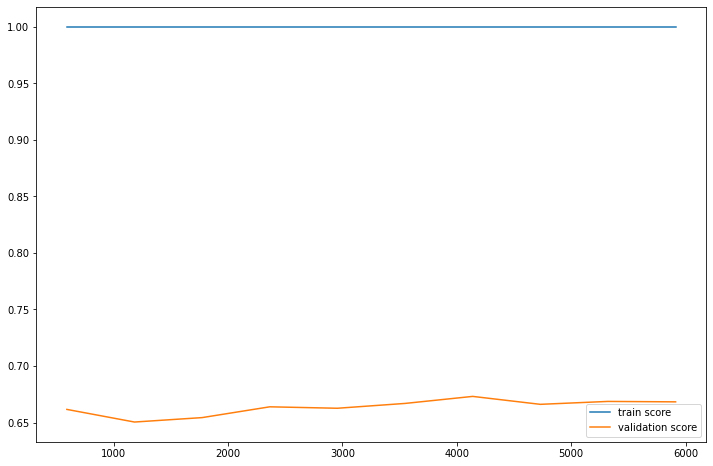

SGDClass
Fit----------------------------------------------- done
[[359 579]
 [290 710]]
              precision    recall  f1-score   support

         0.0       0.55      0.38      0.45       938
         1.0       0.55      0.71      0.62      1000

    accuracy                           0.55      1938
   macro avg       0.55      0.55      0.54      1938
weighted avg       0.55      0.55      0.54      1938



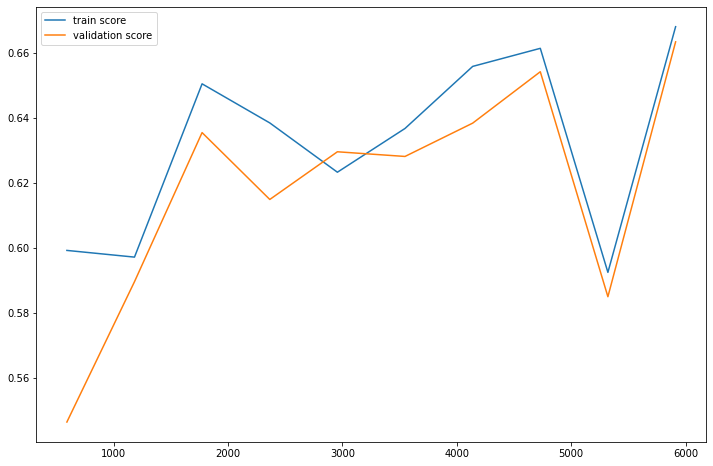

AdaBoost
Fit----------------------------------------------- done
[[594 344]
 [325 675]]
              precision    recall  f1-score   support

         0.0       0.65      0.63      0.64       938
         1.0       0.66      0.68      0.67      1000

    accuracy                           0.65      1938
   macro avg       0.65      0.65      0.65      1938
weighted avg       0.65      0.65      0.65      1938



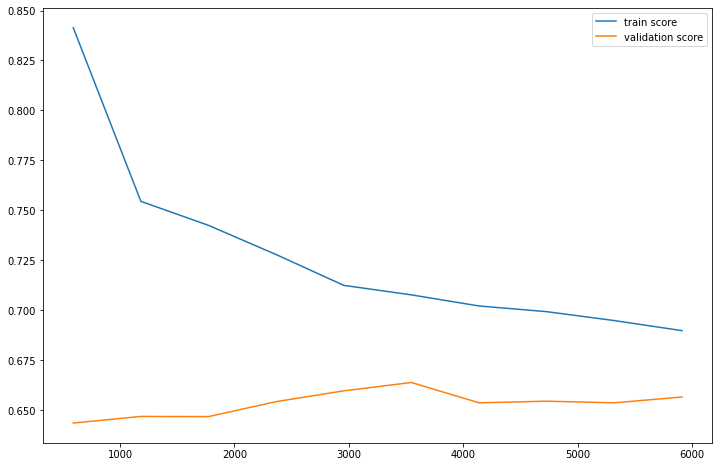

SVM
Fit----------------------------------------------- done
[[646 292]
 [329 671]]
              precision    recall  f1-score   support

         0.0       0.66      0.69      0.68       938
         1.0       0.70      0.67      0.68      1000

    accuracy                           0.68      1938
   macro avg       0.68      0.68      0.68      1938
weighted avg       0.68      0.68      0.68      1938



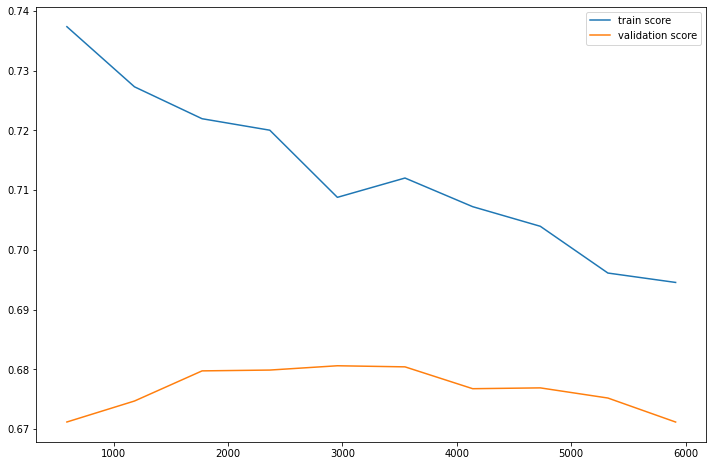

KNN
Fit----------------------------------------------- done
[[597 341]
 [377 623]]
              precision    recall  f1-score   support

         0.0       0.61      0.64      0.62       938
         1.0       0.65      0.62      0.63      1000

    accuracy                           0.63      1938
   macro avg       0.63      0.63      0.63      1938
weighted avg       0.63      0.63      0.63      1938



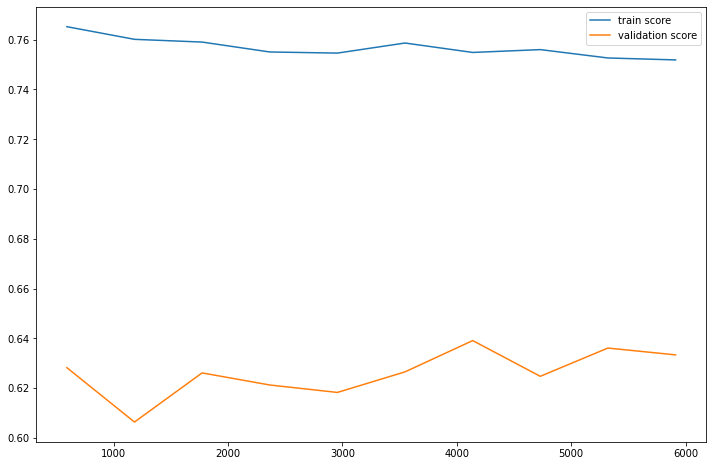

In [168]:
for name, model in dict_of_models.items():
    print(name)
    evaluation(model)

**Observations :** Pour chacun des modele pour k=20, plus on augmente le nombre de batch et moins de modele est efficace. Lorsqu'on augmente le nombre de feature à 40, le probleme est le meme, les hyperparametres ne sont pas bien réglé.

**Model choisi :** Nous privilégions un modele qui limite le surapprentissage (RandomForest,KNN). Nous ne choisissons pas le SGD, car le nombre d'echantillons n'est pas assez grands. Adaboost et SVM sont à tester car les courbes de test/learn se rejoignent : peux se généraliser.

### 4-c. Hyperparameter search with validation curve

On choisi toujours de maximiser le score F1 (le recall serait si on minimiser le nombre de faux negatif)

In [171]:
SVM

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('polynomialfeatures',
                                  PolynomialFeatures(include_bias=False)),
                                 ('selectkbest', SelectKBest(k=40))])),
                ('standardscaler', StandardScaler()),
                ('svc', SVC(random_state=0))])

In [179]:
#### for chosen model 
# 1st for grid
"""
hyper_params = {'svc__gamma':[1e-3, 1e-4],
                'svc__C':[1, 10, 100, 1000, 3000]}
"""
hyper_params = {'svc__gamma':[1e-3, 1e-4, 0.0005],
                'svc__C':[1, 10, 100, 1000, 3000], 
               'pipeline__polynomialfeatures__degree':[1, 2],
               'pipeline__selectkbest__k': range(10, 60)}

In [180]:
# grid = GridSearchCV(SVM, hyper_params, scoring='recall', cv=4) # first for some parameter
N = 50
grid = RandomizedSearchCV(SVM, hyper_params, scoring='f1', cv=4, n_iter=N, verbose=10)
grid.fit(X_train, y_train)
print(grid.best_params_)
y_pred = grid.predict(X_test)
print(skm.classification_report(y_test, y_pred))

Fitting 4 folds for each of 40 candidates, totalling 160 fits
[CV] svc__gamma=0.0005, svc__C=1000, pipeline__selectkbest__k=48, pipeline__polynomialfeatures__degree=3 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  svc__gamma=0.0005, svc__C=1000, pipeline__selectkbest__k=48, pipeline__polynomialfeatures__degree=3, score=0.654, total=  11.4s
[CV] svc__gamma=0.0005, svc__C=1000, pipeline__selectkbest__k=48, pipeline__polynomialfeatures__degree=3 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   11.4s remaining:    0.0s


[CV]  svc__gamma=0.0005, svc__C=1000, pipeline__selectkbest__k=48, pipeline__polynomialfeatures__degree=3, score=0.672, total=  11.2s
[CV] svc__gamma=0.0005, svc__C=1000, pipeline__selectkbest__k=48, pipeline__polynomialfeatures__degree=3 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   22.6s remaining:    0.0s


[CV]  svc__gamma=0.0005, svc__C=1000, pipeline__selectkbest__k=48, pipeline__polynomialfeatures__degree=3, score=0.684, total=  10.9s
[CV] svc__gamma=0.0005, svc__C=1000, pipeline__selectkbest__k=48, pipeline__polynomialfeatures__degree=3 


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   33.5s remaining:    0.0s


[CV]  svc__gamma=0.0005, svc__C=1000, pipeline__selectkbest__k=48, pipeline__polynomialfeatures__degree=3, score=0.662, total=  10.8s
[CV] svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=57, pipeline__polynomialfeatures__degree=1 


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:   44.3s remaining:    0.0s


[CV]  svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=57, pipeline__polynomialfeatures__degree=1, score=0.689, total=   2.4s
[CV] svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=57, pipeline__polynomialfeatures__degree=1 


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   46.8s remaining:    0.0s


[CV]  svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=57, pipeline__polynomialfeatures__degree=1, score=0.697, total=   2.4s
[CV] svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=57, pipeline__polynomialfeatures__degree=1 


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:   49.2s remaining:    0.0s


[CV]  svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=57, pipeline__polynomialfeatures__degree=1, score=0.695, total=   2.4s
[CV] svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=57, pipeline__polynomialfeatures__degree=1 


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:   51.6s remaining:    0.0s


[CV]  svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=57, pipeline__polynomialfeatures__degree=1, score=0.685, total=   2.4s
[CV] svc__gamma=0.0001, svc__C=3000, pipeline__selectkbest__k=53, pipeline__polynomialfeatures__degree=1 


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:   54.0s remaining:    0.0s


[CV]  svc__gamma=0.0001, svc__C=3000, pipeline__selectkbest__k=53, pipeline__polynomialfeatures__degree=1, score=0.679, total=   4.3s
[CV] svc__gamma=0.0001, svc__C=3000, pipeline__selectkbest__k=53, pipeline__polynomialfeatures__degree=1 


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:   58.4s remaining:    0.0s


[CV]  svc__gamma=0.0001, svc__C=3000, pipeline__selectkbest__k=53, pipeline__polynomialfeatures__degree=1, score=0.695, total=   4.2s
[CV] svc__gamma=0.0001, svc__C=3000, pipeline__selectkbest__k=53, pipeline__polynomialfeatures__degree=1 
[CV]  svc__gamma=0.0001, svc__C=3000, pipeline__selectkbest__k=53, pipeline__polynomialfeatures__degree=1, score=0.689, total=   4.2s
[CV] svc__gamma=0.0001, svc__C=3000, pipeline__selectkbest__k=53, pipeline__polynomialfeatures__degree=1 
[CV]  svc__gamma=0.0001, svc__C=3000, pipeline__selectkbest__k=53, pipeline__polynomialfeatures__degree=1, score=0.690, total=   4.2s
[CV] svc__gamma=0.0005, svc__C=3000, pipeline__selectkbest__k=51, pipeline__polynomialfeatures__degree=2 
[CV]  svc__gamma=0.0005, svc__C=3000, pipeline__selectkbest__k=51, pipeline__polynomialfeatures__degree=2, score=0.663, total=   5.9s
[CV] svc__gamma=0.0005, svc__C=3000, pipeline__selectkbest__k=51, pipeline__polynomialfeatures__degree=2 
[CV]  svc__gamma=0.0005, svc__C=3000, pi

[CV]  svc__gamma=0.0005, svc__C=3000, pipeline__selectkbest__k=50, pipeline__polynomialfeatures__degree=3, score=0.652, total=  12.0s
[CV] svc__gamma=0.0005, svc__C=3000, pipeline__selectkbest__k=50, pipeline__polynomialfeatures__degree=3 
[CV]  svc__gamma=0.0005, svc__C=3000, pipeline__selectkbest__k=50, pipeline__polynomialfeatures__degree=3, score=0.671, total=  12.2s
[CV] svc__gamma=0.0005, svc__C=3000, pipeline__selectkbest__k=50, pipeline__polynomialfeatures__degree=3 
[CV]  svc__gamma=0.0005, svc__C=3000, pipeline__selectkbest__k=50, pipeline__polynomialfeatures__degree=3, score=0.677, total=  12.1s
[CV] svc__gamma=0.0005, svc__C=3000, pipeline__selectkbest__k=50, pipeline__polynomialfeatures__degree=3 
[CV]  svc__gamma=0.0005, svc__C=3000, pipeline__selectkbest__k=50, pipeline__polynomialfeatures__degree=3, score=0.670, total=  12.3s
[CV] svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=54, pipeline__polynomialfeatures__degree=3 
[CV]  svc__gamma=0.001, svc__C=1, pipeline__

[CV]  svc__gamma=0.0005, svc__C=10, pipeline__selectkbest__k=10, pipeline__polynomialfeatures__degree=1, score=0.647, total=   1.1s
[CV] svc__gamma=0.001, svc__C=100, pipeline__selectkbest__k=16, pipeline__polynomialfeatures__degree=2 
[CV]  svc__gamma=0.001, svc__C=100, pipeline__selectkbest__k=16, pipeline__polynomialfeatures__degree=2, score=0.631, total=   1.9s
[CV] svc__gamma=0.001, svc__C=100, pipeline__selectkbest__k=16, pipeline__polynomialfeatures__degree=2 
[CV]  svc__gamma=0.001, svc__C=100, pipeline__selectkbest__k=16, pipeline__polynomialfeatures__degree=2, score=0.663, total=   1.8s
[CV] svc__gamma=0.001, svc__C=100, pipeline__selectkbest__k=16, pipeline__polynomialfeatures__degree=2 
[CV]  svc__gamma=0.001, svc__C=100, pipeline__selectkbest__k=16, pipeline__polynomialfeatures__degree=2, score=0.658, total=   1.8s
[CV] svc__gamma=0.001, svc__C=100, pipeline__selectkbest__k=16, pipeline__polynomialfeatures__degree=2 
[CV]  svc__gamma=0.001, svc__C=100, pipeline__selectkbes

[CV]  svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=45, pipeline__polynomialfeatures__degree=1, score=0.692, total=   2.1s
[CV] svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=45, pipeline__polynomialfeatures__degree=1 
[CV]  svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=45, pipeline__polynomialfeatures__degree=1, score=0.668, total=   2.1s
[CV] svc__gamma=0.0001, svc__C=1, pipeline__selectkbest__k=15, pipeline__polynomialfeatures__degree=3 
[CV]  svc__gamma=0.0001, svc__C=1, pipeline__selectkbest__k=15, pipeline__polynomialfeatures__degree=3, score=0.613, total=   8.5s
[CV] svc__gamma=0.0001, svc__C=1, pipeline__selectkbest__k=15, pipeline__polynomialfeatures__degree=3 
[CV]  svc__gamma=0.0001, svc__C=1, pipeline__selectkbest__k=15, pipeline__polynomialfeatures__degree=3, score=0.650, total=   8.6s
[CV] svc__gamma=0.0001, svc__C=1, pipeline__selectkbest__k=15, pipeline__polynomialfeatures__degree=3 
[CV]  svc__gamma=0.0001, svc__C=1, pipeline__selectkbest__k=15, pip

[CV]  svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=52, pipeline__polynomialfeatures__degree=1, score=0.696, total=   2.3s
[CV] svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=52, pipeline__polynomialfeatures__degree=1 
[CV]  svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=52, pipeline__polynomialfeatures__degree=1, score=0.692, total=   2.3s
[CV] svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=52, pipeline__polynomialfeatures__degree=1 
[CV]  svc__gamma=0.001, svc__C=1, pipeline__selectkbest__k=52, pipeline__polynomialfeatures__degree=1, score=0.683, total=   2.3s
[CV] svc__gamma=0.001, svc__C=1000, pipeline__selectkbest__k=16, pipeline__polynomialfeatures__degree=3 
[CV]  svc__gamma=0.001, svc__C=1000, pipeline__selectkbest__k=16, pipeline__polynomialfeatures__degree=3, score=0.630, total=   9.6s
[CV] svc__gamma=0.001, svc__C=1000, pipeline__selectkbest__k=16, pipeline__polynomialfeatures__degree=3 
[CV]  svc__gamma=0.001, svc__C=1000, pipeline__selectkbest__k=1

[Parallel(n_jobs=1)]: Done 160 out of 160 | elapsed: 13.8min finished


{'svc__gamma': 0.001, 'svc__C': 1, 'pipeline__selectkbest__k': 57, 'pipeline__polynomialfeatures__degree': 1}
              precision    recall  f1-score   support

         0.0       0.68      0.64      0.66       938
         1.0       0.68      0.72      0.70      1000

    accuracy                           0.68      1938
   macro avg       0.68      0.68      0.68      1938
weighted avg       0.68      0.68      0.68      1938



Fit----------------------------------------------- done
[[563 375]
 [309 691]]
              precision    recall  f1-score   support

         0.0       0.65      0.60      0.62       938
         1.0       0.65      0.69      0.67      1000

    accuracy                           0.65      1938
   macro avg       0.65      0.65      0.65      1938
weighted avg       0.65      0.65      0.65      1938



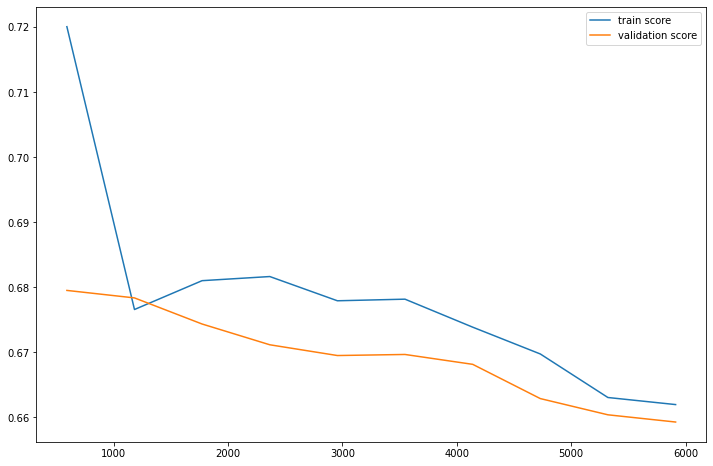

In [175]:
evaluation(grid.best_estimator_)

### 4-d. Threshold search

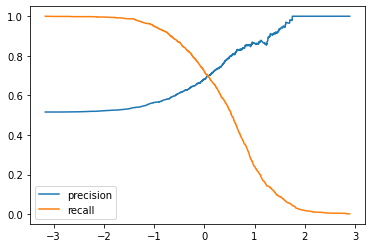

In [182]:
precision, recall, threshold = skm.precision_recall_curve(y_test, grid.best_estimator_.decision_function(X_test))
plt.plot(threshold, precision[:-1], label='precision')
plt.plot(threshold, recall[:-1], label='recall')
plt.legend()

### 4-e. Final model

In [183]:
def model_final(model, X, threshold=0):
    return model.decision_function(X) > threshold

In [204]:
y_pred = model_final(grid.best_estimator_, X_test, threshold=-0.5)
# score for classification model
print(skm.f1_score(y_test, y_pred))
print(skm.precision_score(y_test, y_pred))
print(skm.recall_score(y_test, y_pred))

0.7181818181818181
0.6119718309859155
0.869


## 5. Conclusion

Chosen model, link between other report, good variable

### 5-a. Synthetic visualization

Representation des resultats du modele sur la carte

In [265]:
Y_map = model_final(grid.best_estimator_, df_preprocess.iloc[:,2:].fillna(0), threshold=-1.)

In [266]:
# import
geo_predict = data[5].copy()
Predict_map = df_preprocess['CODGEO'].copy()
# construct
Predict_map = pd.concat([Predict_map,pd.Series(Y_map,name='Predicted')], axis=1).fillna(True)
Predict_map['Predicted'] = Predict_map['Predicted'].map({True:'Choix B', False:'Choix A'})
display(Predict_map['Predicted'].value_counts())
# merge
geo_predict = geo_predict.merge(Predict_map[['CODGEO', 'Predicted']], how='inner', on='CODGEO')
geo_predict.head()

Choix B    31935
Choix A     4580
Name: Predicted, dtype: int64

,CODGEO,nom,wikipedia,surf_ha,geometry,Results,Predicted
0,2B137,Lano,fr:Lano,824.0,"POLYGON ((9.20010 42.39013, 9.20014 42.39014, ...",Choix A,Choix A
1,2B051,Cambia,fr:Cambia,833.0,"POLYGON ((9.27757 42.37509, 9.27758 42.37512, ...",Choix B,Choix B
2,2B106,Érone,fr:Érone,393.0,"POLYGON ((9.25119 42.37605, 9.25132 42.37603, ...",Choix A,Choix A
3,2B185,Oletta,fr:Oletta,2674.0,"POLYGON ((9.28340 42.66273, 9.28345 42.66273, ...",Choix B,Choix B
4,2B058,Canari,fr:Canari (Haute-Corse),1678.0,"POLYGON ((9.30952 42.83348, 9.30963 42.83361, ...",Choix B,Choix B


/home/fabien/.local/lib/python3.8/site-packages/geopandas/plotting.py:49: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in geom:
/home/fabien/.local/lib/python3.8/site-packages/descartes/patch.py:63: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  concatenate([asarray(t.exterior)[:, :2]] +
/home/fabien/.local/lib/python3.8/site-packages/descartes/patch.py:64: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  [asarray(r)[:, :2] for r in t.interiors])


<AxesSubplot:>

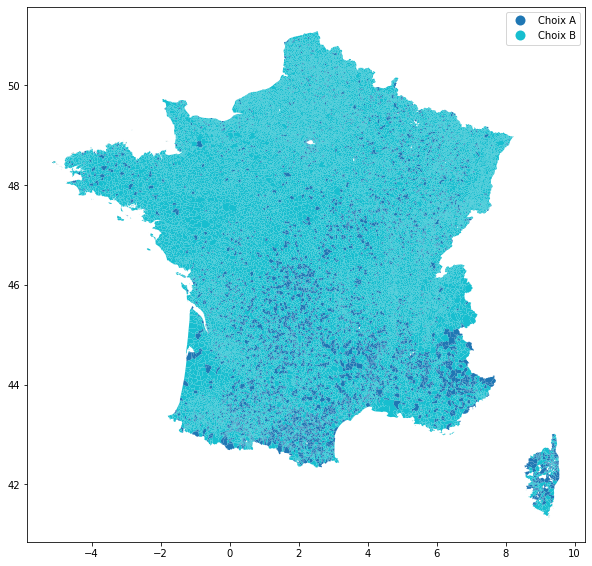

In [267]:
# show
fig,ax = plt.subplots(figsize=(10, 10))
geo_predict[geo_predict.CODGEO.str[:2] != "97"].plot(ax=ax, categorical=True, column = "Predicted", legend=True)

### 5-b. Discussion

Possible amelioration (if more time)